# A Predictive Analysis on Credit Card Customer Churn Using Maching Learning and Deep Learning Techniques

The aim of this study is to evaluate which Machine Learning, Deep Learning or Ensemble techniques is most efficient at predicting credit card customer churn for banks. Widely varying methodologies and experimental setups have been carried to compare various techniques for customer churn, however Ensemble techniques are not experimented in many studies within this domain. In this study, Ensemble techniques such as voting and stacking is applied to combine several base model in order to produce an optimal model.

The study aims to help banks mitigate the cost associated with losing credit card customers. By predicting if a customer intends on leaving, the bank can proactively react in time and convince the customer to stay

The dataset is used in this analysis is available on kaggle at: https://www.kaggle.com/datasets/sakshigoyal7/credit-card-customers

### Table of Content
1. [Exploratory Data Analysis](#1.-Exploratory-Data-Analysis)
2. [Data Preparation](#2.-Data-Preparation) <br>
    2.1 [Data Preprocessing](#2.1-Data-Preprocessing) <br>
    2.2 [Feature Selection](#2.2-Feature-Selection)
3. [Artificial Neural Network Epoch Selection](#3.-Artificial-Neural-Network-Epoch-Selection)
4. [Cross Validation using Machine Learning and Deep Learning models](#4.-Cross-Validation-using-Machine-Learning-and-Deep-Learning-models)
5. [SMOTE Balancing Technique](#5.-SMOTE-Balancing-Technique) <br>
    5.1 [Modelling using Random Forest, SVM, KNN, ANN, Logistic Regression and Ensembles (Stacking & Voting)](#5.1-Modelling-using-Random-Forest,-SVM,-KNN,-ANN,-Logistic-Regression-and-Ensembles-(Stacking-&-Voting)) <br>
    5.2 [Results](#5.2-Results) <br>
    5.3 [Feature Importance](#5.3-Feature-Importance) <br>
6. [Random Sampling Balancing Technique](#6.-Random-Sampling-Balancing-Technique) <br>
    6.1 [Modelling using Random Forest, SVM, KNN, ANN, Logistic Regression and Ensembles (Stacking & Voting)](#6.1-Modelling-using-Random-Forest,-SVM,-KNN,-ANN,-Logistic-Regression-and-Ensembles-(Stacking-&-Voting)) <br>
    6.2 [Results](#6.2-Results) <br>
    6.3 [Feature Importance](#6.3-Feature-Importance) <br>
7. [Conclusion](#7.-Conclusion)
 

### Import Libraries

In [1]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
from collections import Counter
from sklearn.datasets import make_classification
from imblearn.over_sampling import SMOTE
from matplotlib import pyplot
from numpy import where
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import SVC
from sklearn.model_selection import KFold, StratifiedKFold
from sklearn.metrics import  recall_score, precision_score, accuracy_score, f1_score
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Activation, Dropout
from tensorflow.keras.callbacks import EarlyStopping
from sklearn.linear_model import Lasso
from xgboost import XGBClassifier
from sklearn.metrics import classification_report
from sklearn.metrics import confusion_matrix


from matplotlib.colors import LinearSegmentedColormap
import numpy as np
from os import path
from PIL import Image

%matplotlib inline

# 1. Exploratory Data Analysis

An Exploratory Data Analysis is conducted to gain an depth understanding of the data

In [2]:
Churn_Dataset = pd.read_csv("BankChurners.csv")
Churn_Dataset.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10127 entries, 0 to 10126
Data columns (total 23 columns):
 #   Column                                                                                                                              Non-Null Count  Dtype  
---  ------                                                                                                                              --------------  -----  
 0   CLIENTNUM                                                                                                                           10127 non-null  int64  
 1   Attrition_Flag                                                                                                                      10127 non-null  object 
 2   Customer_Age                                                                                                                        10127 non-null  int64  
 3   Gender                                                                           

#### The last 2 columns are not required for the analysis and were advised to be dropped by the data provider. Client number as well

In [3]:
Churn_Dataset = Churn_Dataset.iloc[:, 1:21]
Churn_Dataset.head()

,Attrition_Flag,Customer_Age,Gender,Dependent_count,Education_Level,Marital_Status,Income_Category,Card_Category,Months_on_book,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio
0,Existing Customer,45,M,3,High School,Married,$60K - $80K,Blue,39,5,1,3,12691.0,777,11914.0,1.335,1144,42,1.625,0.061
1,Existing Customer,49,F,5,Graduate,Single,Less than $40K,Blue,44,6,1,2,8256.0,864,7392.0,1.541,1291,33,3.714,0.105
2,Existing Customer,51,M,3,Graduate,Married,$80K - $120K,Blue,36,4,1,0,3418.0,0,3418.0,2.594,1887,20,2.333,0.000
3,Existing Customer,40,F,4,High School,Unknown,Less than $40K,Blue,34,3,4,1,3313.0,2517,796.0,1.405,1171,20,2.333,0.760
4,Existing Customer,40,M,3,Uneducated,Married,$60K - $80K,Blue,21,5,1,0,4716.0,0,4716.0,2.175,816,28,2.500,0.000


#### The columns are renamed for better usability

In [4]:
Churn_Dataset.columns = ['attrition_flag', 'customer_age', 'gender', 'dependent_count',
                         'education_level', 'marital_status', 'income_category', 'card_category',
                         'months_on_book', 'total_relationship_count', 'months_inactive_12_month',
                         'contacts_count_12_month', 'credit_limit', 'total_revolving_bal',
                         'avg_open_to_buy', 'total_amt_change_q4_q1', 'total_trans_amt',
                         'total_trans_count', 'total_count_change_q4_q1', 'avg_utilization_ratio']

#### Checking for null and na values
We find that there are no null and na values in the dataset

In [5]:
Churn_Dataset.isnull().sum()

attrition_flag              0
customer_age                0
gender                      0
dependent_count             0
education_level             0
marital_status              0
income_category             0
card_category               0
months_on_book              0
total_relationship_count    0
months_inactive_12_month    0
contacts_count_12_month     0
credit_limit                0
total_revolving_bal         0
avg_open_to_buy             0
total_amt_change_q4_q1      0
total_trans_amt             0
total_trans_count           0
total_count_change_q4_q1    0
avg_utilization_ratio       0
dtype: int64

In [6]:
Churn_Dataset.isna().sum()

attrition_flag              0
customer_age                0
gender                      0
dependent_count             0
education_level             0
marital_status              0
income_category             0
card_category               0
months_on_book              0
total_relationship_count    0
months_inactive_12_month    0
contacts_count_12_month     0
credit_limit                0
total_revolving_bal         0
avg_open_to_buy             0
total_amt_change_q4_q1      0
total_trans_amt             0
total_trans_count           0
total_count_change_q4_q1    0
avg_utilization_ratio       0
dtype: int64

In [7]:
Churn_Dataset.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10127 entries, 0 to 10126
Data columns (total 20 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   attrition_flag            10127 non-null  object 
 1   customer_age              10127 non-null  int64  
 2   gender                    10127 non-null  object 
 3   dependent_count           10127 non-null  int64  
 4   education_level           10127 non-null  object 
 5   marital_status            10127 non-null  object 
 6   income_category           10127 non-null  object 
 7   card_category             10127 non-null  object 
 8   months_on_book            10127 non-null  int64  
 9   total_relationship_count  10127 non-null  int64  
 10  months_inactive_12_month  10127 non-null  int64  
 11  contacts_count_12_month   10127 non-null  int64  
 12  credit_limit              10127 non-null  float64
 13  total_revolving_bal       10127 non-null  int64  
 14  avg_op

In [8]:
Churn_Dataset.describe().apply(lambda s: s.apply('{0:.2f}'.format))

,customer_age,dependent_count,months_on_book,total_relationship_count,months_inactive_12_month,contacts_count_12_month,credit_limit,total_revolving_bal,avg_open_to_buy,total_amt_change_q4_q1,total_trans_amt,total_trans_count,total_count_change_q4_q1,avg_utilization_ratio
count,10127.00,10127.00,10127.00,10127.00,10127.00,10127.00,10127.00,10127.00,10127.00,10127.00,10127.00,10127.00,10127.00,10127.00
mean,46.33,2.35,35.93,3.81,2.34,2.46,8631.95,1162.81,7469.14,0.76,4404.09,64.86,0.71,0.27
std,8.02,1.30,7.99,1.55,1.01,1.11,9088.78,814.99,9090.69,0.22,3397.13,23.47,0.24,0.28
min,26.00,0.00,13.00,1.00,0.00,0.00,1438.30,0.00,3.00,0.00,510.00,10.00,0.00,0.00
25%,41.00,1.00,31.00,3.00,2.00,2.00,2555.00,359.00,1324.50,0.63,2155.50,45.00,0.58,0.02
50%,46.00,2.00,36.00,4.00,2.00,2.00,4549.00,1276.00,3474.00,0.74,3899.00,67.00,0.70,0.18
75%,52.00,3.00,40.00,5.00,3.00,3.00,11067.50,1784.00,9859.00,0.86,4741.00,81.00,0.82,0.50
max,73.00,5.00,56.00,6.00,6.00,6.00,34516.00,2517.00,34516.00,3.40,18484.00,139.00,3.71,1.00


#### The features are split into numerical and categorical to explore both groups

In [9]:
numerical = ['customer_age', 'dependent_count', 'months_on_book', 
             'total_relationship_count', 'months_inactive_12_month',
             'contacts_count_12_month', 'credit_limit', 'total_revolving_bal',
             'avg_open_to_buy', 'total_amt_change_q4_q1', 'total_trans_amt',
             'total_trans_count', 'total_count_change_q4_q1', 'avg_utilization_ratio']

categorical = ['attrition_flag', 'gender','education_level', 
               'marital_status', 'income_category', 'card_category']

### Analysis on Numerical Features
We will take a look at <br>
1. The distibution of the numerical features using histograms
2. The correlation between the numerical features using a heatmap
3. Histogram and box plots to show differences in the class distribution <br/>


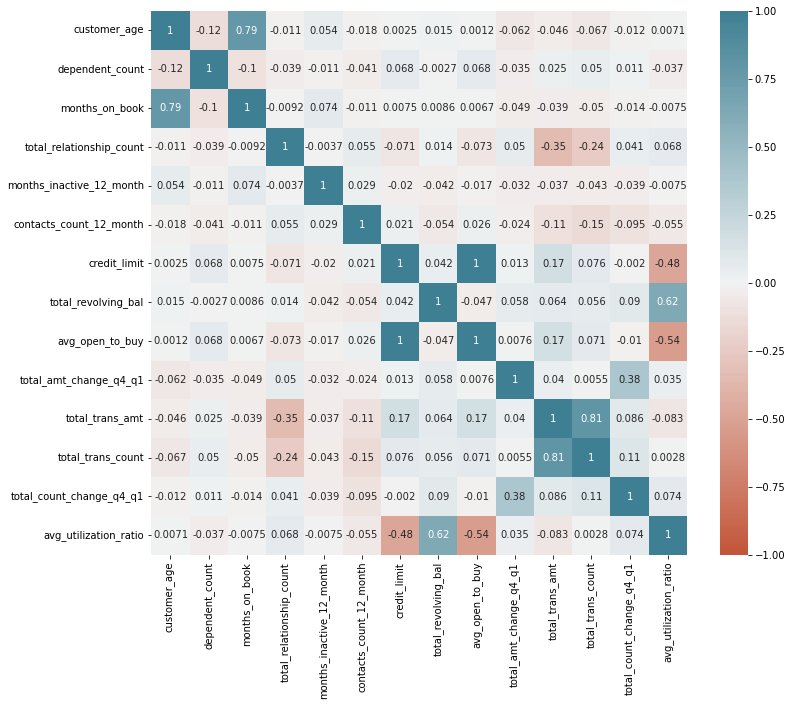

In [111]:
plt.figure(figsize = (12,10))
sns.heatmap(Churn_Dataset.corr(),cmap=sns.diverging_palette(20, 220, n=200),vmin=-1, vmax=1,annot=True,)
plt.show()

#### The below heatmap highlights only the correlations greater than 0.4

We see that the below features have high positive correlation
- Months on the book and customer age
- Total revolving balance and average utilization ratio
- Total count of transaction and total transaction amount
- Average open to buy and credit limit are perfect positive correlation

There is a negative correlation between average utilization ration and average open to buy

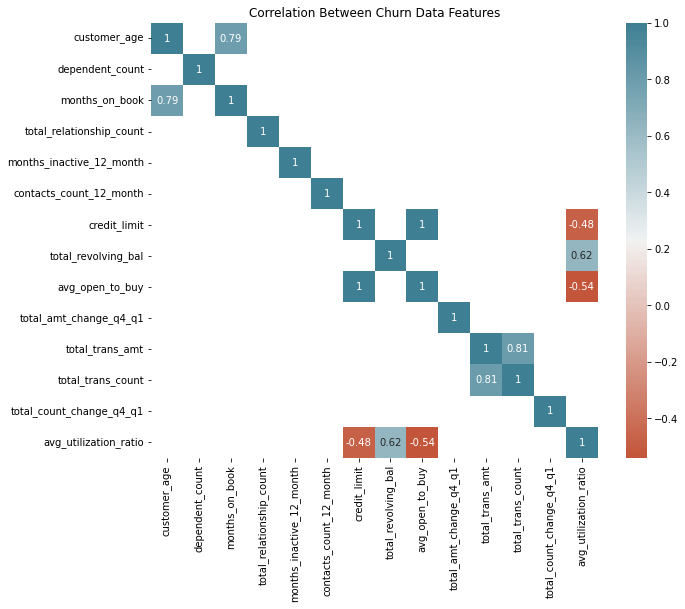

In [11]:
corr = Churn_Dataset.loc[:,numerical].corr()
kot = corr[(corr>= 0.4) | (corr <= -0.4)]
plt.figure(figsize = (10,8))   
dataplot=sns.heatmap(kot,cmap=sns.diverging_palette(20, 220, n=200), annot=True)
plt.title('Correlation Between Churn Data Features')
plt.show()

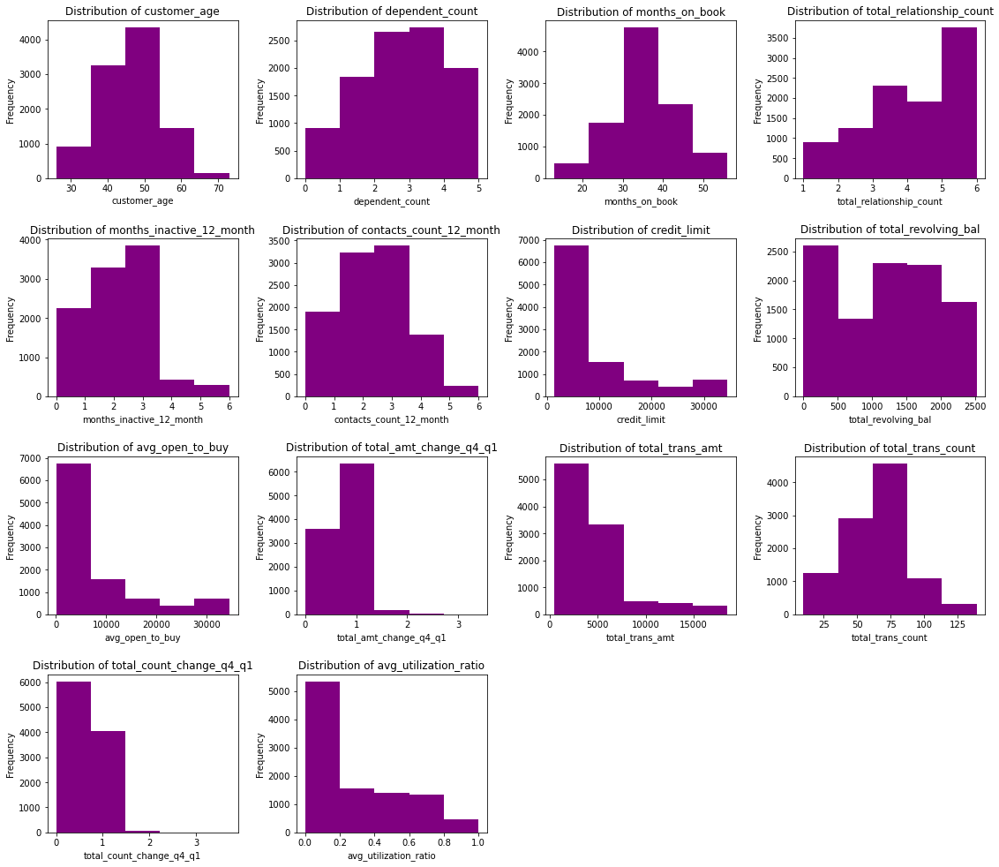

In [12]:
features = list(Churn_Dataset.columns)

fig, axs = plt.subplots(4,4, figsize=(16,14))

idx =0 

for i in range(4):
    for j in range(4):
        axs[i,j].hist(Churn_Dataset[numerical[idx]],bins=5,color='purple')
        axs[i,j].set(xlabel=numerical[idx])
        axs[i,j].set(ylabel='Frequency')
        axs[i,j].set_title("Distribution of " + str(numerical[idx]))
        idx +=1
        
        if idx == len(numerical):
                break;
            
axs[3][2].set_axis_off()
axs[3][3].set_axis_off()

fig.tight_layout(pad=2.0)
#plt.savefig("distribution.jpg",transparent = False)
plt.show()   


In [13]:
fig = px.histogram(Churn_Dataset, 
                   x="customer_age", 
                   color="attrition_flag",
                   title='Age of Customers')
fig.show()

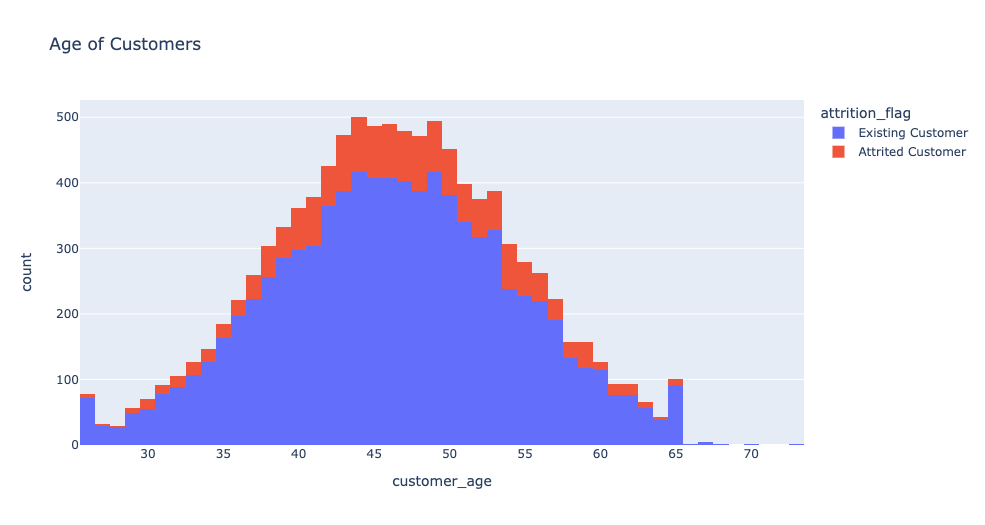

In [14]:
fig = px.histogram(Churn_Dataset, 
                   x="total_trans_count", 
                   color="attrition_flag",
                   title='Total number of Transations')
fig.show()

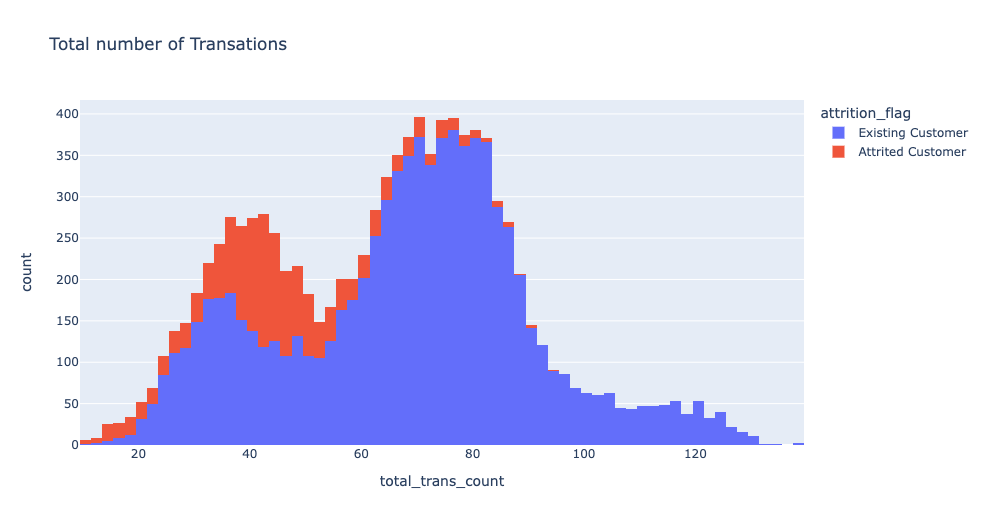

In [15]:
fig = px.histogram(Churn_Dataset, 
                   x="credit_limit", 
                   color="attrition_flag",
                   title='The credit limit of the customers')
fig.show()


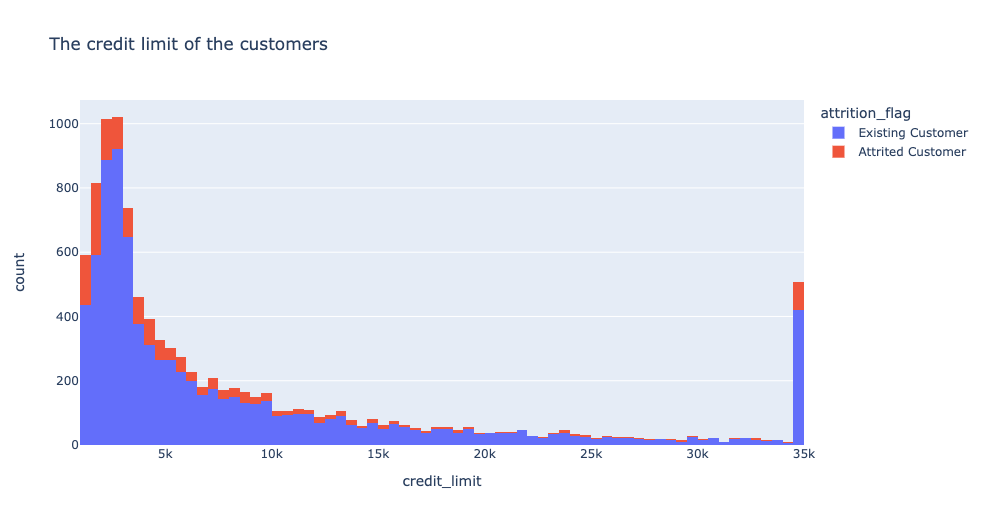

In [16]:
fig = px.histogram(Churn_Dataset, 
                   x="months_inactive_12_month", 
                   color="attrition_flag",
                   title='Total number of months inactive in the last 12 months')
fig.show()

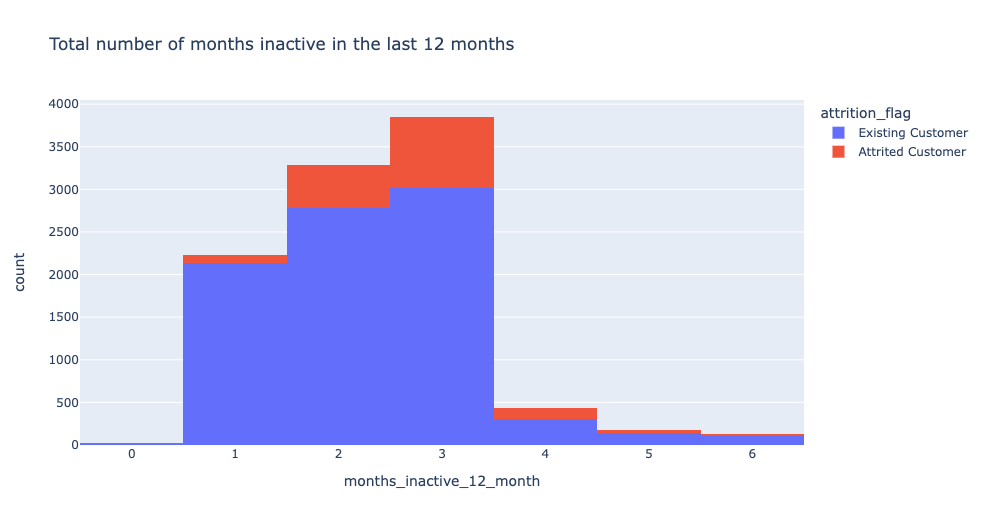

In [17]:
fig = px.histogram(Churn_Dataset, 
                   x="total_trans_amt", 
                   color="attrition_flag",
                   title='Total amount of transactions made in the last year')
fig.show()

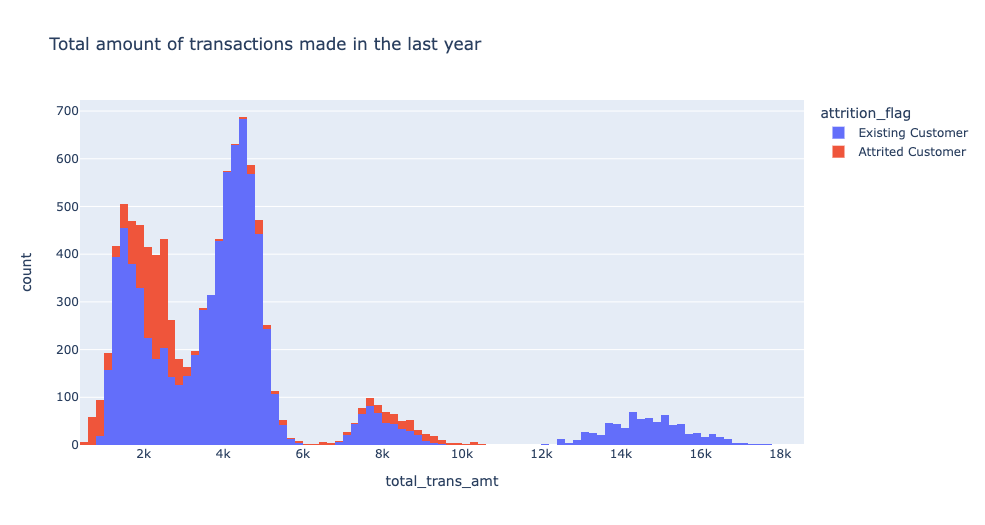

In [18]:
fig = px.histogram(Churn_Dataset, 
                   x="avg_utilization_ratio", 
                   color="attrition_flag",
                   title='Total number of months on the book')
fig.show()


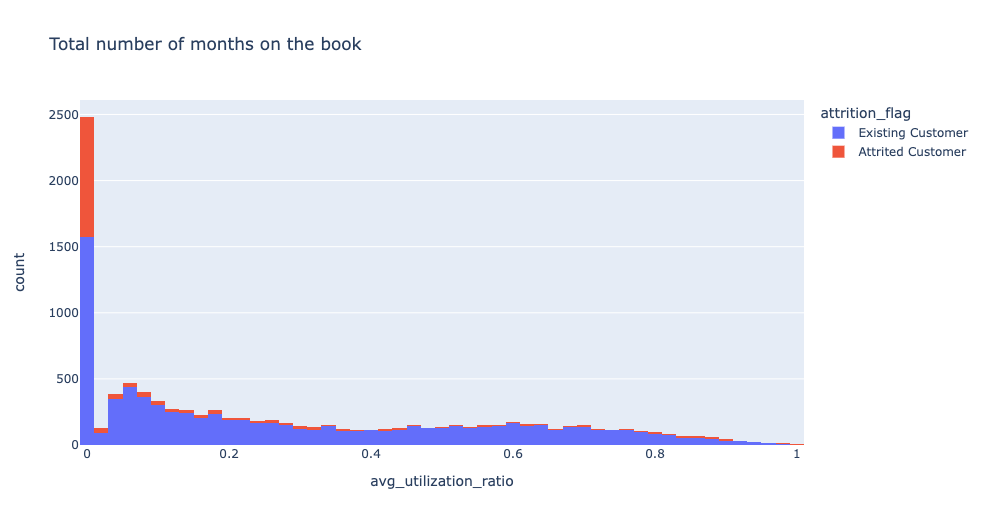

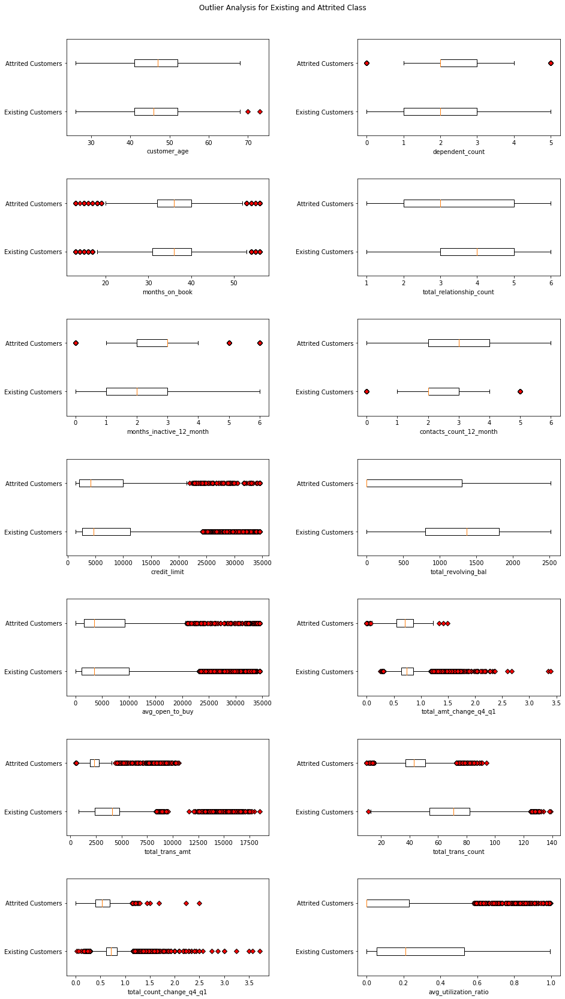

In [19]:

Existing_Dataset = Churn_Dataset[(Churn_Dataset['attrition_flag'] == "Existing Customer")]
Attrited_Dataset = Churn_Dataset[(Churn_Dataset['attrition_flag'] == "Attrited Customer")]
red_diamond = dict(markerfacecolor='r', marker='D')
fig, axs = plt.subplots(7,2, figsize=(14,24))
fig.suptitle('Outlier Analysis for Existing and Attrited Class')
idx =0 

for i in range(7):
    for j in range(2):
        data = [Existing_Dataset[numerical[idx]], Attrited_Dataset[numerical[idx]]]
        axs[i][j].set_xlabel(numerical[idx])
        axs[i][j].boxplot(data, flierprops = red_diamond, vert=0)
        axs[i][j].set_yticks([1, 2], ["Existing Customers", "Attrited Customers"])
    
        idx +=1
        
        if idx == len(features):
            break;
            

fig.tight_layout(pad=4.0)
plt.show() 

### Analysis on Categoral Variables
The categoral variables in the dataset are analyzed below <br>
We find that the dataset is highly imbalance with only 16% of churning customer <br>
Class balancing techniques will the used to tackle this <br>

In [20]:
for cat in categorical:
    print('Variable:', cat)
    print('Unique values:', Churn_Dataset[cat].nunique() )
    print( Churn_Dataset[cat].value_counts() )
    print()

Variable: attrition_flag
Unique values: 2
Existing Customer    8500
Attrited Customer    1627
Name: attrition_flag, dtype: int64

Variable: gender
Unique values: 2
F    5358
M    4769
Name: gender, dtype: int64

Variable: education_level
Unique values: 7
Graduate         3128
High School      2013
Unknown          1519
Uneducated       1487
College          1013
Post-Graduate     516
Doctorate         451
Name: education_level, dtype: int64

Variable: marital_status
Unique values: 4
Married     4687
Single      3943
Unknown      749
Divorced     748
Name: marital_status, dtype: int64

Variable: income_category
Unique values: 6
Less than $40K    3561
$40K - $60K       1790
$80K - $120K      1535
$60K - $80K       1402
Unknown           1112
$120K +            727
Name: income_category, dtype: int64

Variable: card_category
Unique values: 4
Blue        9436
Silver       555
Gold         116
Platinum      20
Name: card_category, dtype: int64



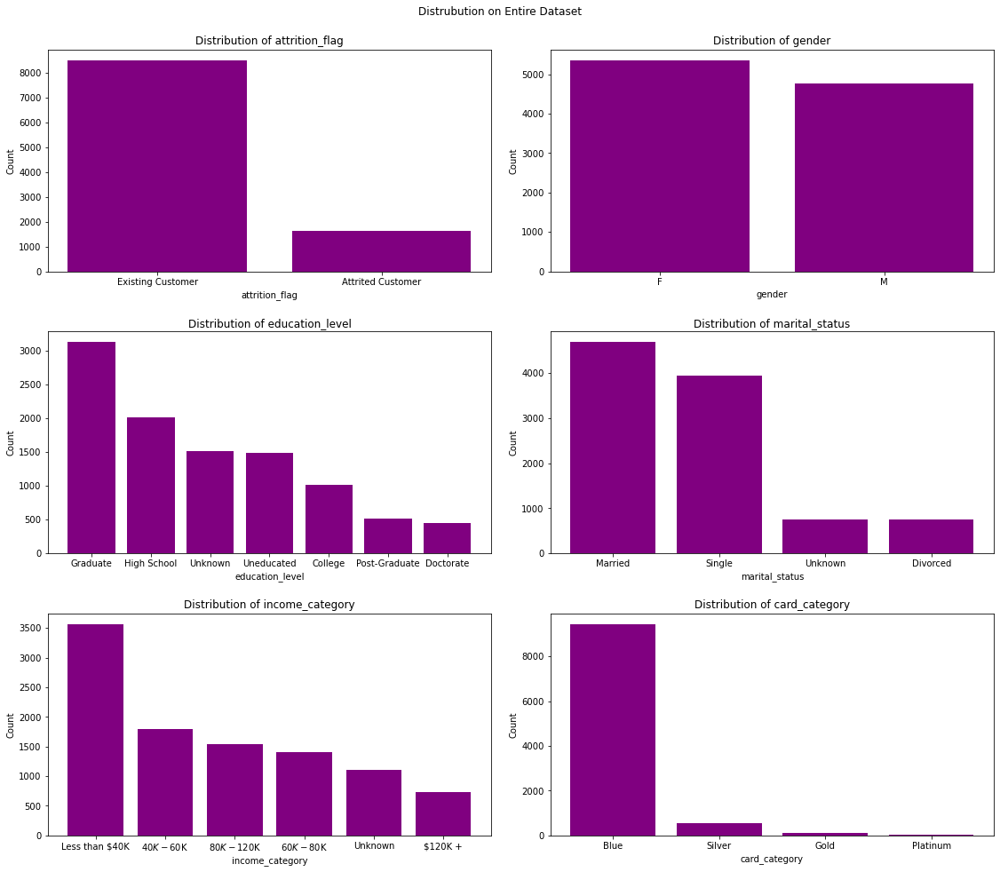

In [21]:
features = list(Churn_Dataset.columns)

fig, axs = plt.subplots(3,2, figsize=(16,14))
fig.suptitle('Distrubution on Entire Dataset')

idx =0 

for i in range(3):
    for j in range(2):
        
        df = Churn_Dataset[categorical[idx]].value_counts()
        axs[i,j].bar(df.index,df.values, color = 'purple')
        axs[i,j].set_title("Distribution of " +categorical[idx])
        axs[i,j].set(ylabel='Count')
        axs[i,j].set(xlabel=categorical[idx])
        idx +=1
        
        if idx == len(categorical):
                break;
            

fig.tight_layout(pad=2.0)
plt.show()   



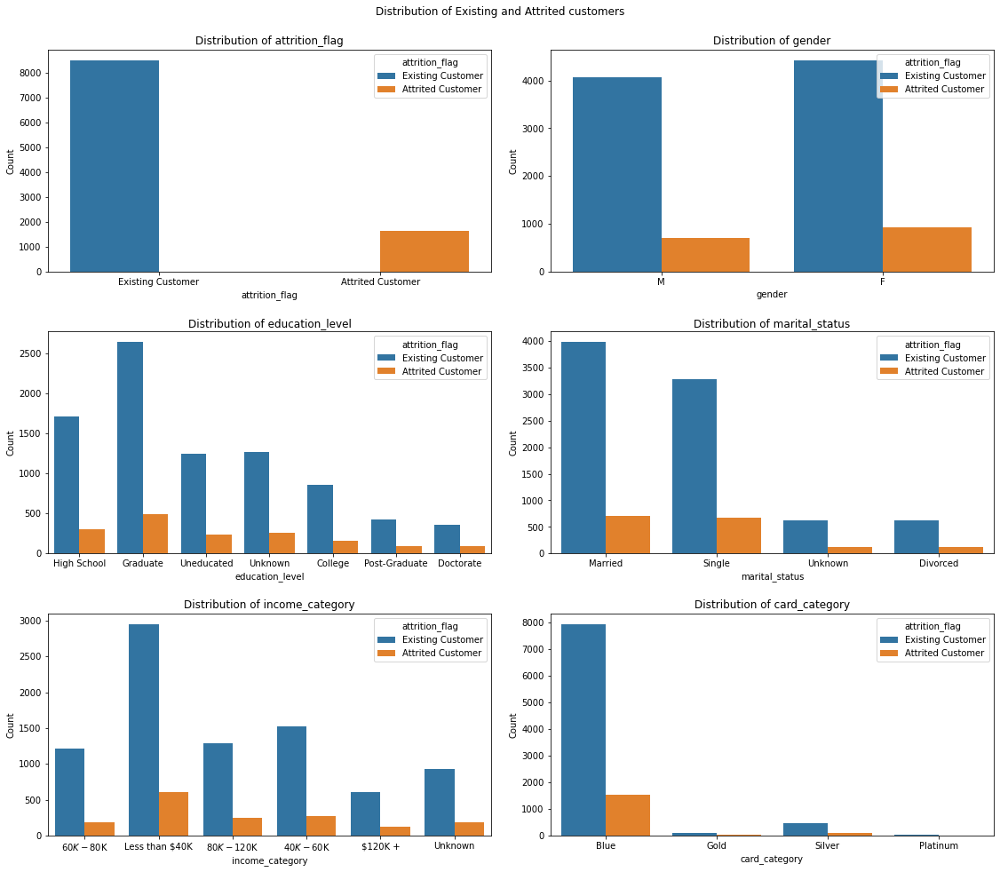

In [22]:
features = list(Churn_Dataset.columns)
fig, axs = plt.subplots(3, 2, figsize=(16, 14))
fig.suptitle("Distribution of Existing and Attrited customers")
idx =0 

for i in range(3):
    for j in range(2):
        
        sns.countplot(ax=axs[i,j], x=categorical[idx],hue='attrition_flag',data=Churn_Dataset)
        axs[i,j].set_title("Distribution of " +categorical[idx])
        axs[i,j].set(ylabel='Count')
        axs[i,j].set(xlabel=categorical[idx])
        idx +=1
        
        if idx == len(categorical):
                break;
            

fig.tight_layout(pad=2.0)
plt.show()   



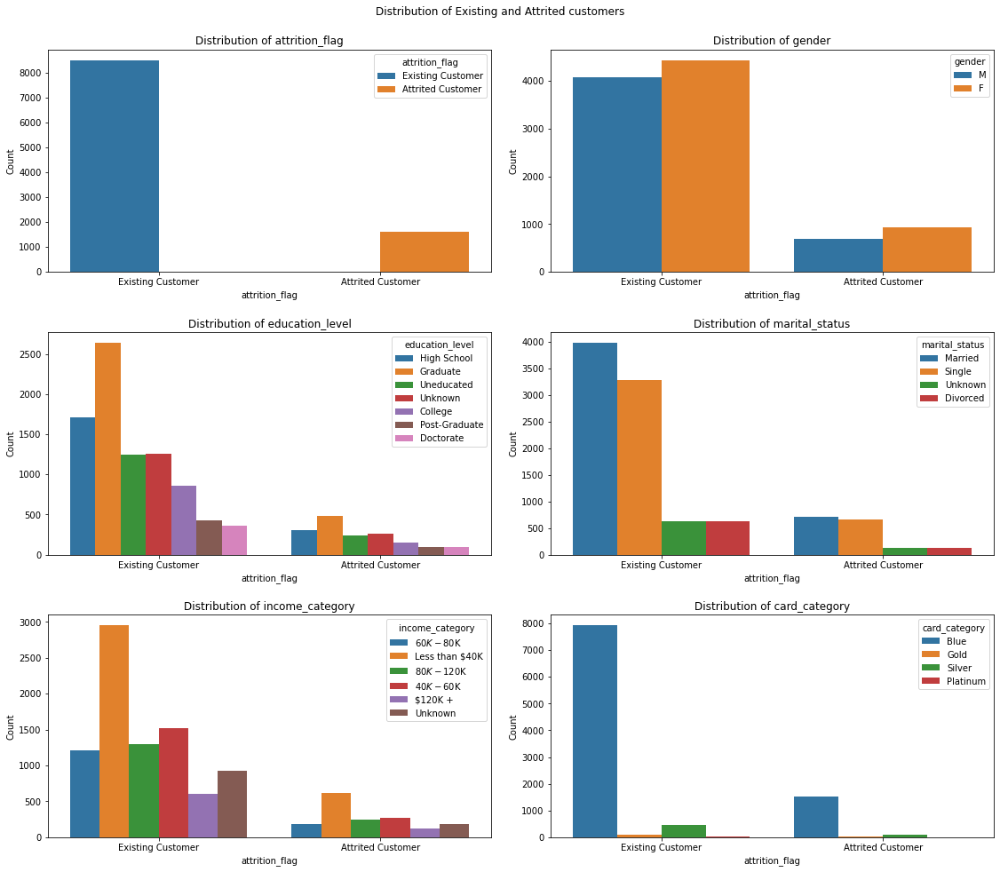

In [23]:
features = list(Churn_Dataset.columns)
fig, axs = plt.subplots(3, 2, figsize=(16, 14))
fig.suptitle("Distribution of Existing and Attrited customers")
idx =0 

for i in range(3):
    for j in range(2):
        
        sns.countplot(ax=axs[i,j], hue=categorical[idx],x='attrition_flag',data=Churn_Dataset)
        axs[i,j].set_title("Distribution of " +categorical[idx])
        axs[i,j].set(ylabel='Count')
        idx +=1
        
        if idx == len(categorical):
                break;
            

fig.tight_layout(pad=2.0)
plt.show()   


In [24]:
fig = px.pie(Churn_Dataset,names='attrition_flag',title='Percentage of Existing and Attrited Customers',
             hole=0.3)
fig.update_traces(textposition='inside', textinfo='percent+label+value', rotation=29)
fig.show()
print('Total number of customers:',Churn_Dataset['attrition_flag'].count())
print(Churn_Dataset['attrition_flag'].value_counts())

px.histogram(Churn_Dataset, x="attrition_flag", color="attrition_flag")


Total number of customers: 10127
Existing Customer    8500
Attrited Customer    1627
Name: attrition_flag, dtype: int64


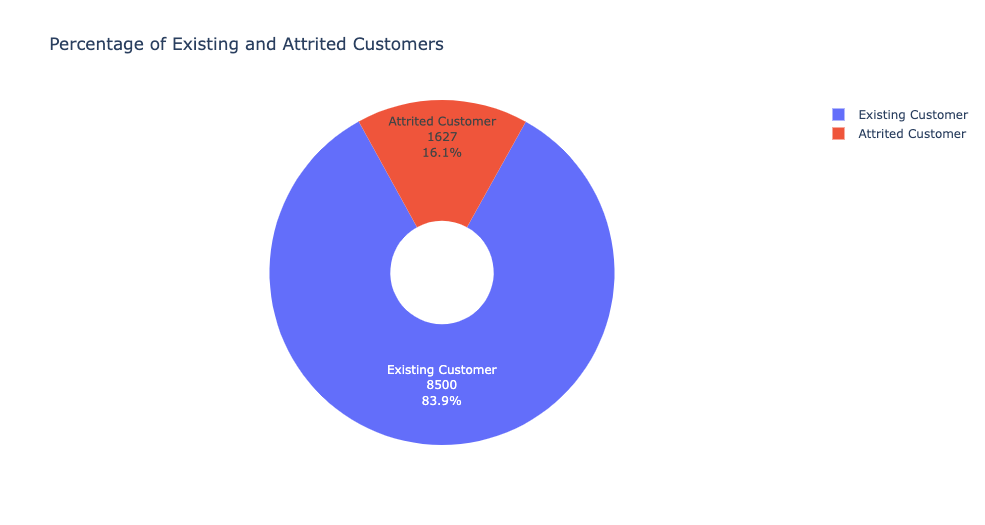

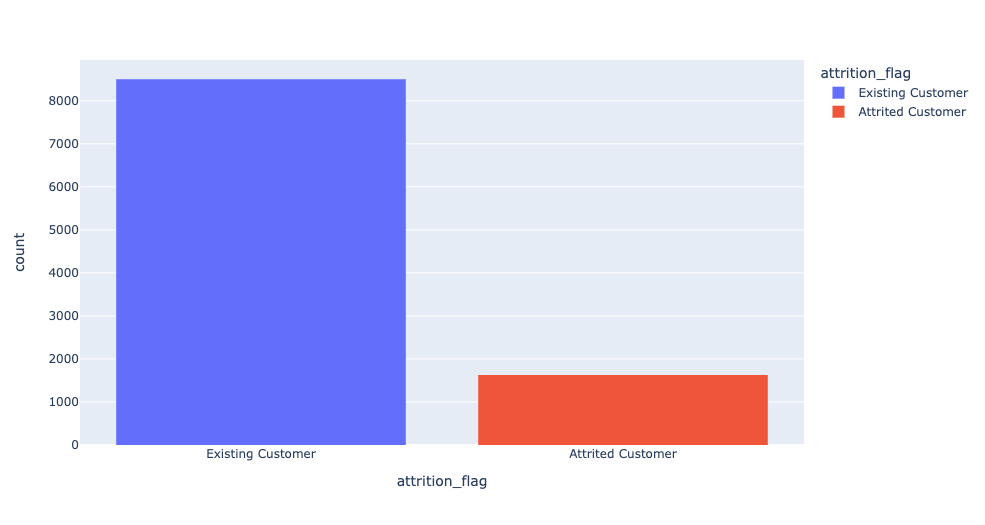

In [25]:
fig = px.pie(Churn_Dataset,names='gender',title='Percentage of Male and Female Customers',hole=0.3)
fig.update_traces(textposition='inside', textinfo='percent+label')
fig.show()
print('Total number of customers:',Churn_Dataset['gender'].count())
print(Churn_Dataset['gender'].value_counts())
px.histogram(Churn_Dataset, x="gender", color="attrition_flag")

Total number of customers: 10127
F    5358
M    4769
Name: gender, dtype: int64


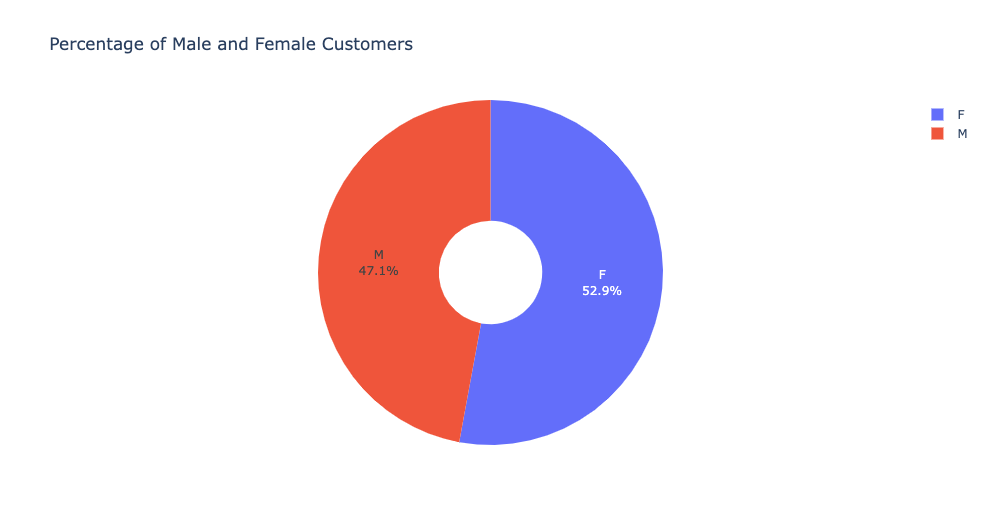

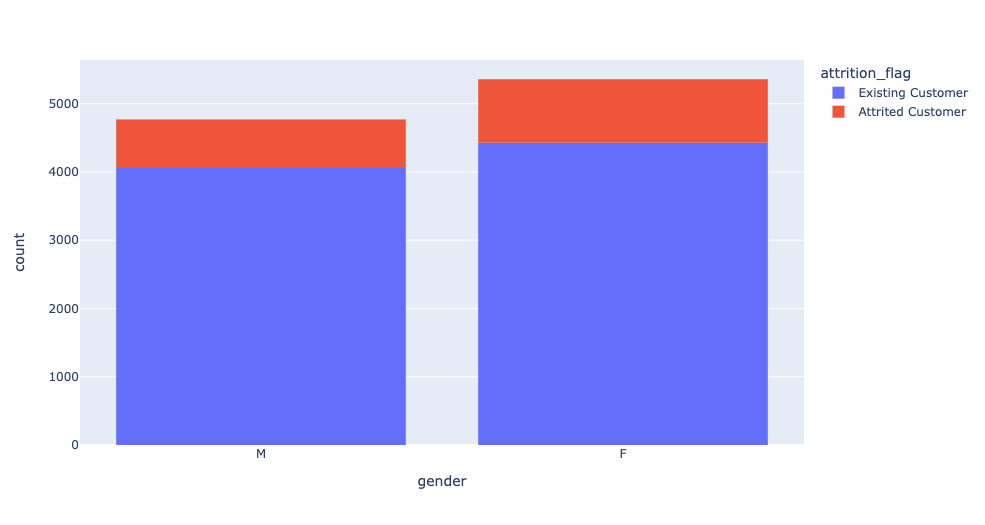

In [26]:
fig = px.pie(Churn_Dataset,names='education_level',title='Percentage of Educated Customers',hole=0.3)
fig.update_traces(textposition='inside', textinfo='percent+label')
fig.show()
print('Total number of customers:',Churn_Dataset['education_level'].count())
print(Churn_Dataset['education_level'].value_counts())
px.histogram(Churn_Dataset, x="education_level", color="attrition_flag")

Total number of customers: 10127
Graduate         3128
High School      2013
Unknown          1519
Uneducated       1487
College          1013
Post-Graduate     516
Doctorate         451
Name: education_level, dtype: int64


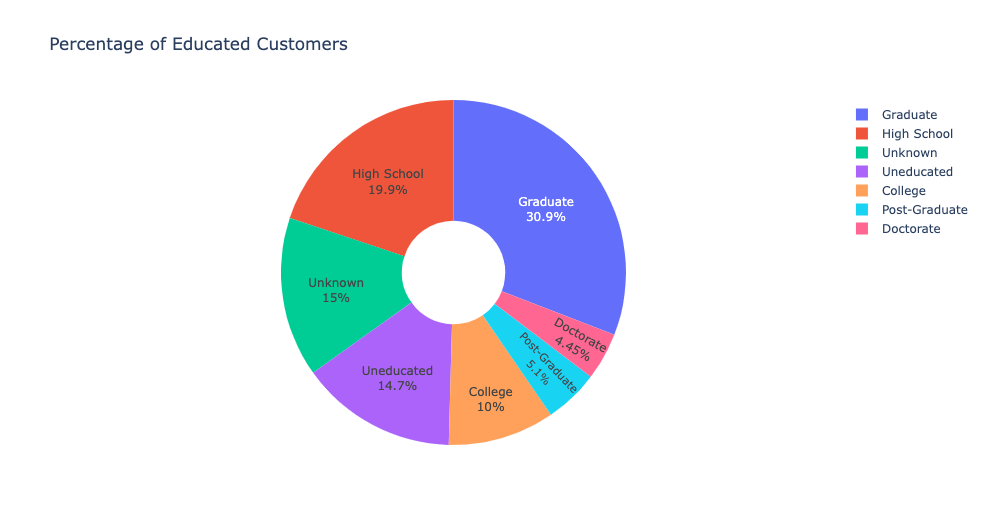

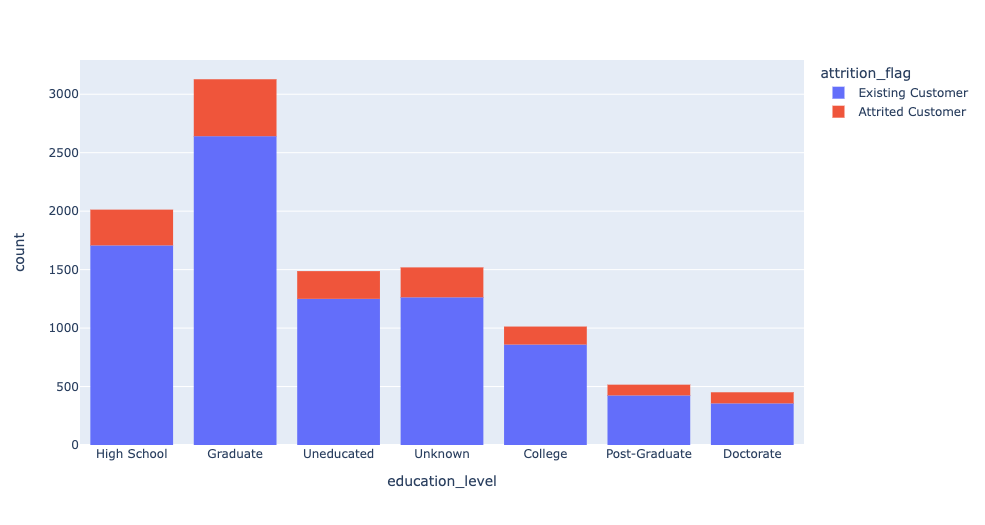

In [27]:
fig = px.pie(Churn_Dataset,names='marital_status',title='Percentage of Married Customers',hole=0.3)
fig.update_traces(textposition='inside', textinfo='percent+label')
fig.show()
print('Total number of customers:',Churn_Dataset['marital_status'].count())
print(Churn_Dataset['marital_status'].value_counts())
px.histogram(Churn_Dataset, x="marital_status", color="attrition_flag")

Total number of customers: 10127
Married     4687
Single      3943
Unknown      749
Divorced     748
Name: marital_status, dtype: int64


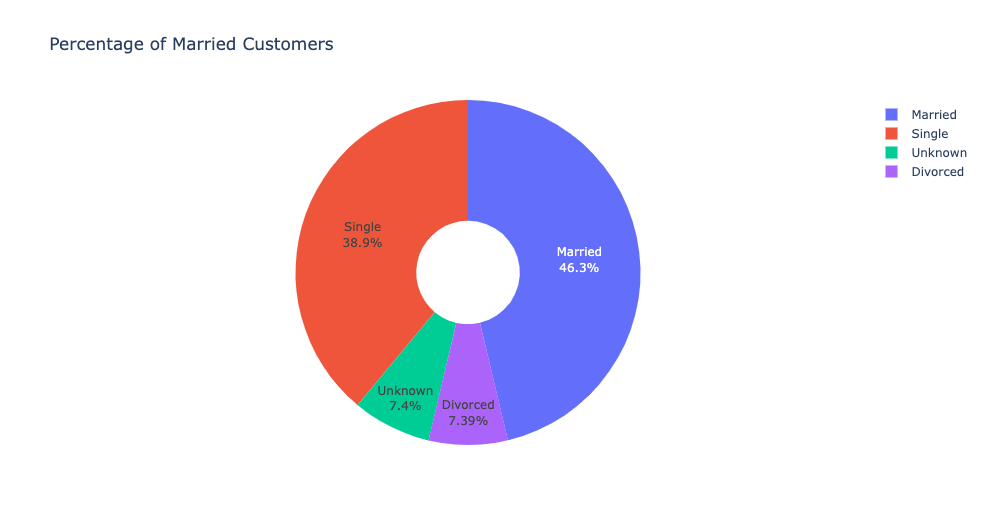

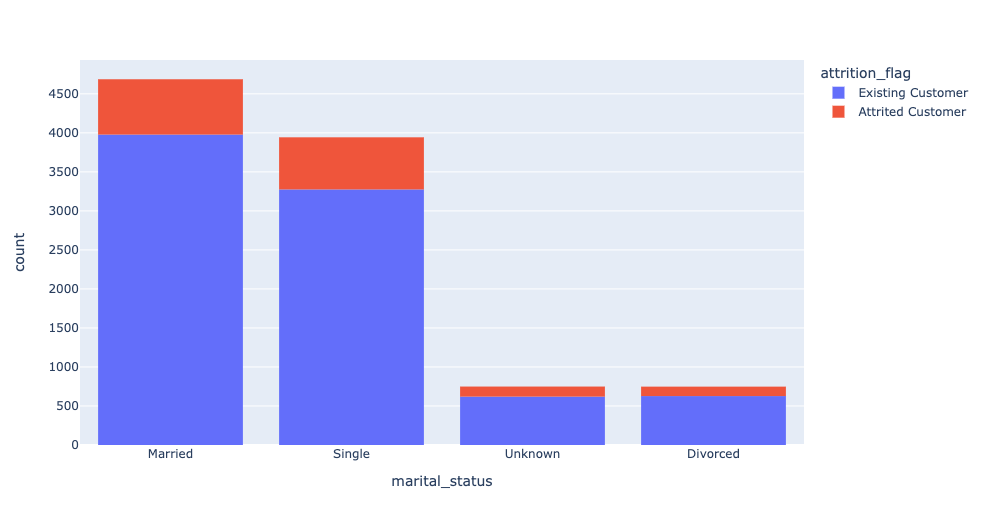

In [28]:
fig = px.pie(Churn_Dataset,names='income_category',title='Percentage of Income distribution',hole=0.3)
fig.update_traces(textposition='inside', textinfo='percent+label')
fig.show()
print('Total number of customers:',Churn_Dataset['income_category'].count())
print(Churn_Dataset['income_category'].value_counts())
px.histogram(Churn_Dataset, x="income_category", color="attrition_flag")

Total number of customers: 10127
Less than $40K    3561
$40K - $60K       1790
$80K - $120K      1535
$60K - $80K       1402
Unknown           1112
$120K +            727
Name: income_category, dtype: int64


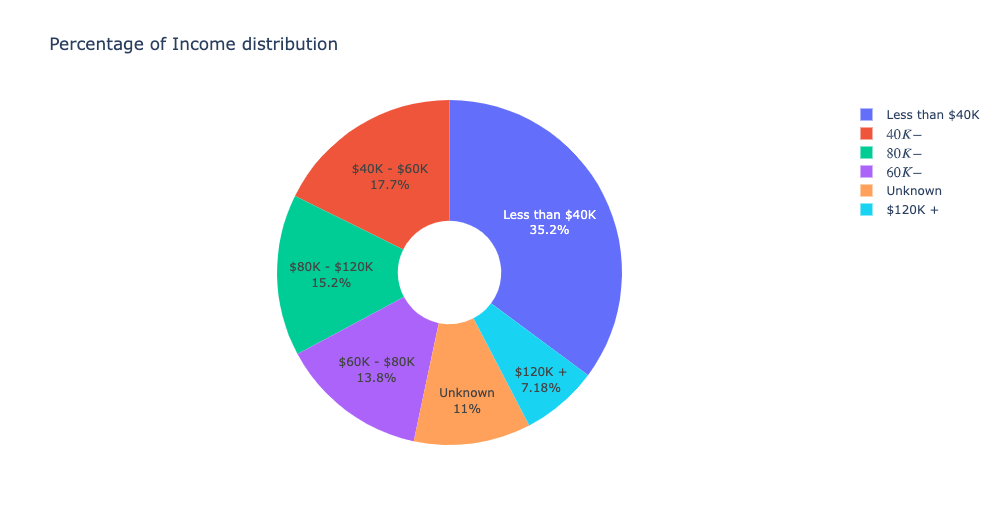

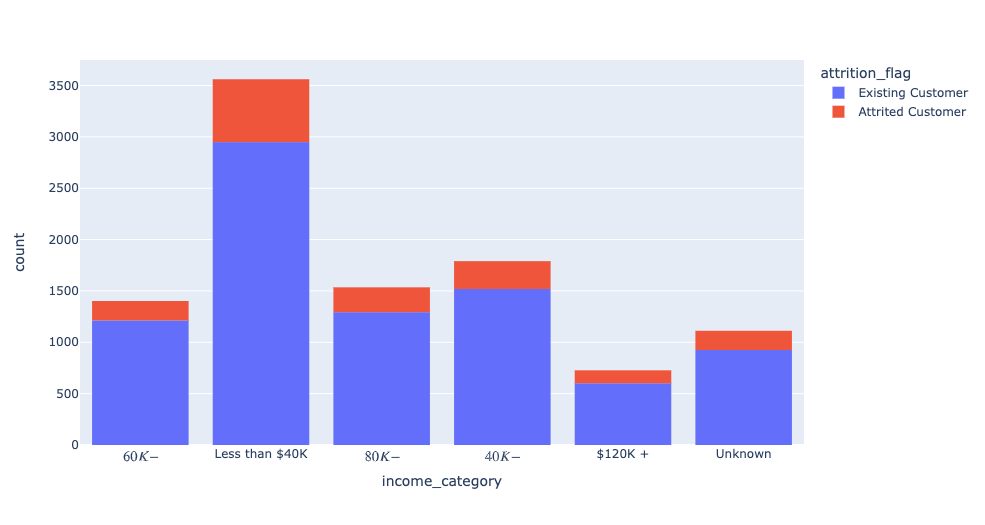

In [29]:
fig = px.pie(Churn_Dataset,names='card_category',title='Percentage of Card Distribution',hole=0.3)
fig.update_traces(textposition='outside', textinfo='percent+label')
fig.show()
print('Total number of customers:',Churn_Dataset['card_category'].count())
print(Churn_Dataset['card_category'].value_counts())
px.histogram(Churn_Dataset, x="card_category", color="attrition_flag")

Total number of customers: 10127
Blue        9436
Silver       555
Gold         116
Platinum      20
Name: card_category, dtype: int64


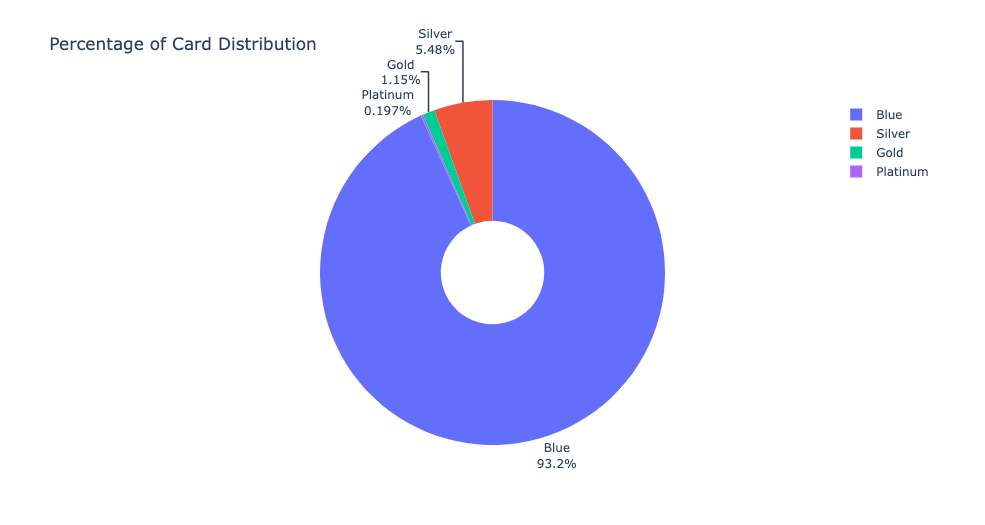

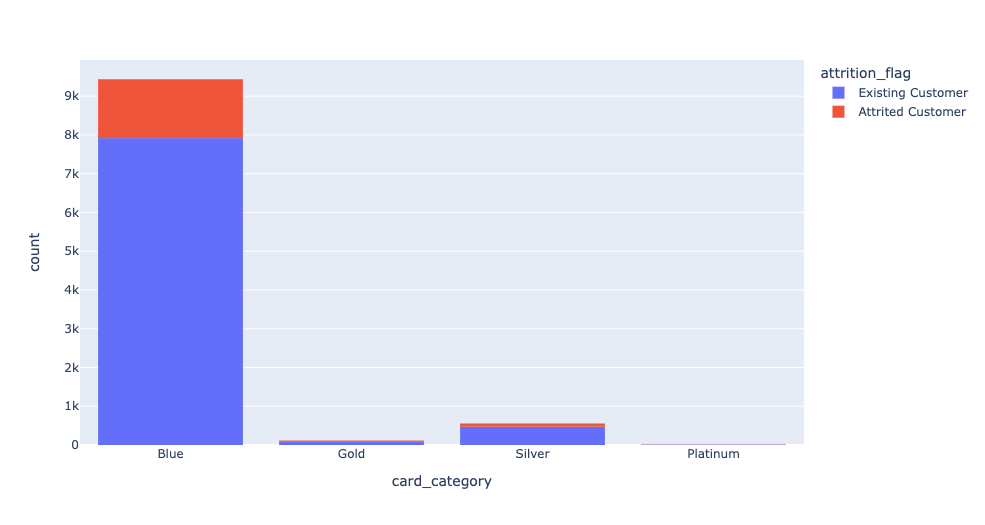

##### [Back to Top](#A-Predictive-Analysis-on-Credit-Card-Customer-Churn-Using-Maching-Learning-and-Deep-Learning-Techniques)

# 2. Data Preparation

Data Preparation includes data preprocessing and feature selection. The data is initally processed by converting all categoral attributes to numerical values. Feature selection is then performed to improve the performance of the model

### 2.1 Data Preprocessing

In [30]:
Churn_Dataset.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10127 entries, 0 to 10126
Data columns (total 20 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   attrition_flag            10127 non-null  object 
 1   customer_age              10127 non-null  int64  
 2   gender                    10127 non-null  object 
 3   dependent_count           10127 non-null  int64  
 4   education_level           10127 non-null  object 
 5   marital_status            10127 non-null  object 
 6   income_category           10127 non-null  object 
 7   card_category             10127 non-null  object 
 8   months_on_book            10127 non-null  int64  
 9   total_relationship_count  10127 non-null  int64  
 10  months_inactive_12_month  10127 non-null  int64  
 11  contacts_count_12_month   10127 non-null  int64  
 12  credit_limit              10127 non-null  float64
 13  total_revolving_bal       10127 non-null  int64  
 14  avg_op

In [31]:
Churn_Dataset.loc[Churn_Dataset["attrition_flag"] == "Existing Customer", "attrition_flag"] = 0
Churn_Dataset.loc[Churn_Dataset["attrition_flag"] == "Attrited Customer", "attrition_flag"] = 1

In [32]:
Churn_Dataset["attrition_flag"] = Churn_Dataset["attrition_flag"].astype('category').cat.codes
Churn_Dataset["gender"] = Churn_Dataset["gender"].astype('category').cat.codes
Churn_Dataset["education_level"] = Churn_Dataset["education_level"].astype('category').cat.codes
Churn_Dataset["marital_status"] = Churn_Dataset["marital_status"].astype('category').cat.codes
Churn_Dataset["income_category"] = Churn_Dataset["income_category"].astype('category').cat.codes
Churn_Dataset["card_category"] = Churn_Dataset["card_category"].astype('category').cat.codes

In [33]:
Churn_Dataset.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10127 entries, 0 to 10126
Data columns (total 20 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   attrition_flag            10127 non-null  int8   
 1   customer_age              10127 non-null  int64  
 2   gender                    10127 non-null  int8   
 3   dependent_count           10127 non-null  int64  
 4   education_level           10127 non-null  int8   
 5   marital_status            10127 non-null  int8   
 6   income_category           10127 non-null  int8   
 7   card_category             10127 non-null  int8   
 8   months_on_book            10127 non-null  int64  
 9   total_relationship_count  10127 non-null  int64  
 10  months_inactive_12_month  10127 non-null  int64  
 11  contacts_count_12_month   10127 non-null  int64  
 12  credit_limit              10127 non-null  float64
 13  total_revolving_bal       10127 non-null  int64  
 14  avg_op

In [34]:
Churn_Dataset.head()

,attrition_flag,customer_age,gender,dependent_count,education_level,marital_status,income_category,card_category,months_on_book,total_relationship_count,months_inactive_12_month,contacts_count_12_month,credit_limit,total_revolving_bal,avg_open_to_buy,total_amt_change_q4_q1,total_trans_amt,total_trans_count,total_count_change_q4_q1,avg_utilization_ratio
0,0,45,1,3,3,1,2,0,39,5,1,3,12691.0,777,11914.0,1.335,1144,42,1.625,0.061
1,0,49,0,5,2,2,4,0,44,6,1,2,8256.0,864,7392.0,1.541,1291,33,3.714,0.105
2,0,51,1,3,2,1,3,0,36,4,1,0,3418.0,0,3418.0,2.594,1887,20,2.333,0.000
3,0,40,0,4,3,3,4,0,34,3,4,1,3313.0,2517,796.0,1.405,1171,20,2.333,0.760
4,0,40,1,3,5,1,2,0,21,5,1,0,4716.0,0,4716.0,2.175,816,28,2.500,0.000


##### [Back to Top](#A-Predictive-Analysis-on-Credit-Card-Customer-Churn-Using-Maching-Learning-and-Deep-Learning-Techniques)

### 2.2 Feature Selection

Multicollinearity of the features is examines using Variance Inflator Factor (VIF) and Correlation heatmap<br>

If the proportion of cases in the reference category is small, the indicator variables will necessarily have high VIFs, even if the categorical variable is not associated with other variables in the model. <br>


In [35]:
Churn_Dataset_all = Churn_Dataset.copy()
Churn_Features = Churn_Dataset.drop(["attrition_flag"],axis=1)

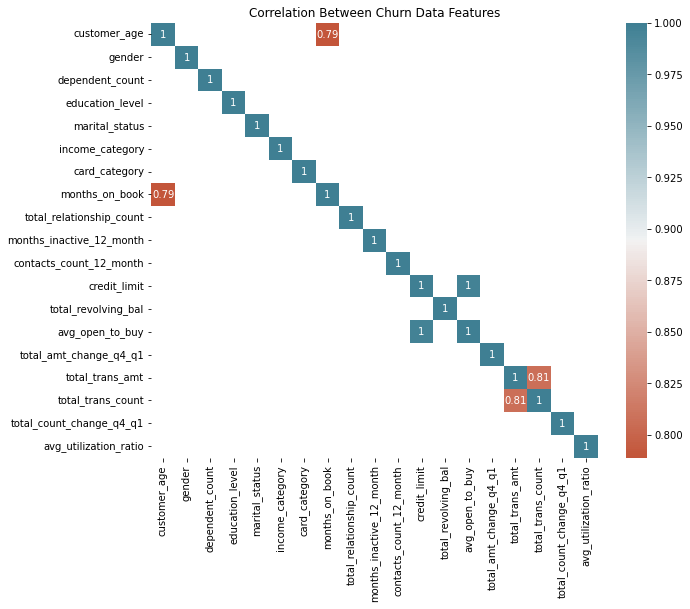

In [36]:
#corr = Churn_Dataset.loc[:,numerical].corr()
corr = Churn_Features.corr()
kot = corr[(corr>= 0.65) | (corr <= -0.65)]
plt.figure(figsize = (10,8))   
dataplot=sns.heatmap(kot,cmap=sns.diverging_palette(20, 220, n=200), annot=True)
plt.title('Correlation Between Churn Data Features')
plt.show()

In [37]:
# Find most important features relative to target Price
print("Find most important features relative to Attrition-target")
corr = Churn_Dataset.corr()
corr.sort_values(["attrition_flag"], ascending = False, inplace = True)
print(corr.attrition_flag)

Find most important features relative to Attrition-target
attrition_flag              1.000000
contacts_count_12_month     0.204491
months_inactive_12_month    0.152449
dependent_count             0.018991
marital_status              0.018597
customer_age                0.018203
income_category             0.017584
months_on_book              0.013687
education_level             0.005551
avg_open_to_buy            -0.000285
card_category              -0.006038
credit_limit               -0.023873
gender                     -0.037272
total_amt_change_q4_q1     -0.131063
total_relationship_count   -0.150005
total_trans_amt            -0.168598
avg_utilization_ratio      -0.178410
total_revolving_bal        -0.263053
total_count_change_q4_q1   -0.290054
total_trans_count          -0.371403
Name: attrition_flag, dtype: float64


In [38]:
from statsmodels.stats.outliers_influence import variance_inflation_factor
  
def getVIF(Features):    
    vif_data = pd.DataFrame()
    vif_data["Feature"] = Features.columns

    # calculating VIF for each feature
    vif_data["VIF"] = [variance_inflation_factor(Features.values, i)
                              for i in range(len(Features.columns))]
    
    #vif_data = vif_data.sort_values(by=['VIF'])
    return vif_data

In [39]:
print(getVIF(Churn_Features))

/opt/anaconda3/envs/tensorflow3/lib/python3.7/site-packages/statsmodels/stats/outliers_influence.py:195: RuntimeWarning:

divide by zero encountered in double_scalars



                     Feature        VIF
0               customer_age  77.332902
1                     gender   3.044755
2            dependent_count   4.084367
3            education_level   3.768079
4             marital_status   4.836794
5            income_category   6.010507
6              card_category   1.450771
7             months_on_book  56.465206
8   total_relationship_count   7.604975
9   months_inactive_12_month   6.157851
10   contacts_count_12_month   5.649438
11              credit_limit        inf
12       total_revolving_bal        inf
13           avg_open_to_buy        inf
14    total_amt_change_q4_q1  14.166335
15           total_trans_amt   8.724527
16         total_trans_count  24.010254
17  total_count_change_q4_q1  11.863691
18     avg_utilization_ratio   5.839804


From the heatmap, we find that credit limit and average open to buy are perfectly correlated


Both attributes have a VIF of infinity. However, credit limit a higher correlation to the target and thus a higher relative importance than average open to buy. There average open to buy attribute is eliminated

In [40]:
Churn_Features = Churn_Features.drop(["avg_open_to_buy"],axis=1)

We then examine the remaining features

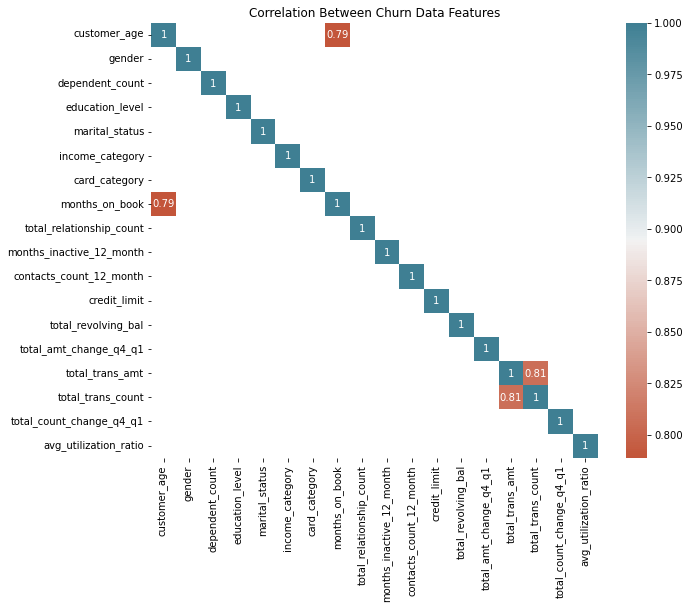

In [41]:
corr = Churn_Features.corr()
kot = corr[(corr>= 0.65) | (corr <= -0.65)]
plt.figure(figsize = (10,8))   
dataplot=sns.heatmap(kot,cmap=sns.diverging_palette(20, 220, n=200), annot=True)
plt.title('Correlation Between Churn Data Features')
plt.show()

In [42]:
print(getVIF(Churn_Features))

                     Feature        VIF
0               customer_age  77.332902
1                     gender   3.044755
2            dependent_count   4.084367
3            education_level   3.768079
4             marital_status   4.836794
5            income_category   6.010507
6              card_category   1.450771
7             months_on_book  56.465206
8   total_relationship_count   7.604975
9   months_inactive_12_month   6.157851
10   contacts_count_12_month   5.649438
11              credit_limit   4.445001
12       total_revolving_bal   6.833847
13    total_amt_change_q4_q1  14.166335
14           total_trans_amt   8.724527
15         total_trans_count  24.010254
16  total_count_change_q4_q1  11.863691
17     avg_utilization_ratio   5.839804


Next Age is dropped as it has a high VIF and highly correlated to month on book

In [43]:
Churn_Features = Churn_Features.drop(["customer_age"],axis=1)

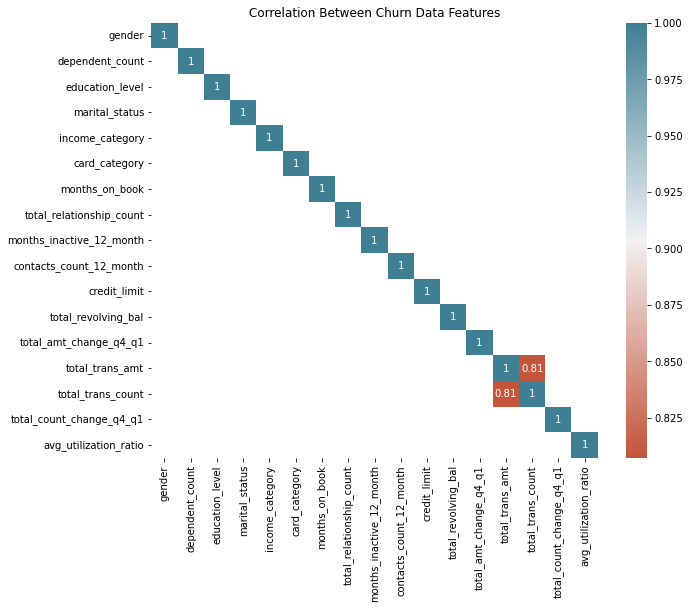

In [44]:
corr = Churn_Features.corr()
kot = corr[(corr>= 0.65) | (corr <= -0.65)]
plt.figure(figsize = (10,8))   
dataplot=sns.heatmap(kot,cmap=sns.diverging_palette(20, 220, n=200), annot=True)
plt.title('Correlation Between Churn Data Features')
plt.show()

In [45]:
print(getVIF(Churn_Features))

                     Feature        VIF
0                     gender   3.029039
1            dependent_count   4.076943
2            education_level   3.743472
3             marital_status   4.807912
4            income_category   5.933187
5              card_category   1.450374
6             months_on_book  15.786635
7   total_relationship_count   7.531501
8   months_inactive_12_month   6.113591
9    contacts_count_12_month   5.589488
10              credit_limit   4.435018
11       total_revolving_bal   6.833783
12    total_amt_change_q4_q1  14.068002
13           total_trans_amt   8.717930
14         total_trans_count  23.823686
15  total_count_change_q4_q1  11.801926
16     avg_utilization_ratio   5.824680


Next total transaction count is dropped and is highly correlated to total transaction amount and has a high VIF

In [46]:
Churn_Features = Churn_Features.drop(["total_trans_count"],axis=1)

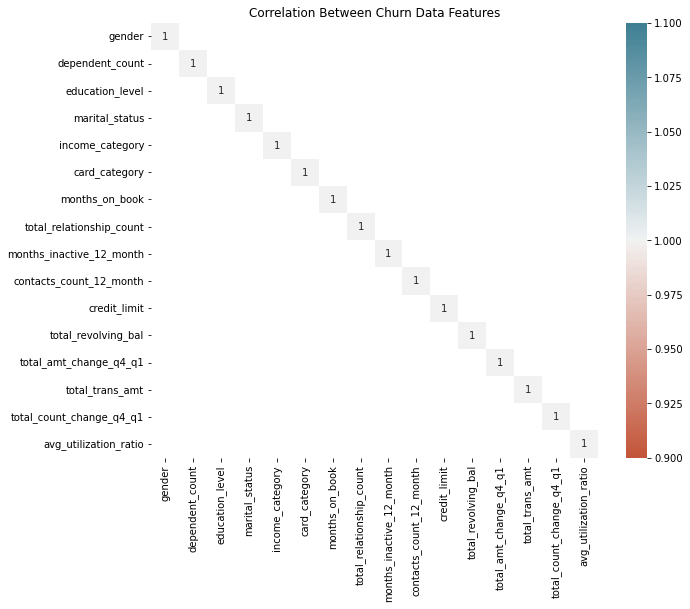

In [47]:
corr = Churn_Features.corr()
kot = corr[(corr>= 0.65) | (corr <= -0.65)]
plt.figure(figsize = (10,8))   
dataplot=sns.heatmap(kot,cmap=sns.diverging_palette(20, 220, n=200), annot=True)
plt.title('Correlation Between Churn Data Features')
plt.show()

In [48]:
print(getVIF(Churn_Features))

                     Feature        VIF
0                     gender   3.028491
1            dependent_count   3.994267
2            education_level   3.738197
3             marital_status   4.715787
4            income_category   5.868068
5              card_category   1.449961
6             months_on_book  15.317729
7   total_relationship_count   7.310005
8   months_inactive_12_month   6.094158
9    contacts_count_12_month   5.589342
10              credit_limit   4.429175
11       total_revolving_bal   6.808958
12    total_amt_change_q4_q1  14.060262
13           total_trans_amt   3.072476
14  total_count_change_q4_q1  11.599695
15     avg_utilization_ratio   5.739458


Since the proportion of cases in the reference category is small, the VIF could remain quite high (greater than 10), even if the categorical variable is not associated with other variables in the model. 

Therefore VIF of 15 and below will be accepted in order to not lose valuable information

In [49]:
Churn_Dataset = Churn_Dataset.drop(["avg_open_to_buy","customer_age", "total_trans_count"],axis=1)
display(Churn_Dataset.head())
Churn_Dataset.shape

,attrition_flag,gender,dependent_count,education_level,marital_status,income_category,card_category,months_on_book,total_relationship_count,months_inactive_12_month,contacts_count_12_month,credit_limit,total_revolving_bal,total_amt_change_q4_q1,total_trans_amt,total_count_change_q4_q1,avg_utilization_ratio
0,0,1,3,3,1,2,0,39,5,1,3,12691.0,777,1.335,1144,1.625,0.061
1,0,0,5,2,2,4,0,44,6,1,2,8256.0,864,1.541,1291,3.714,0.105
2,0,1,3,2,1,3,0,36,4,1,0,3418.0,0,2.594,1887,2.333,0.000
3,0,0,4,3,3,4,0,34,3,4,1,3313.0,2517,1.405,1171,2.333,0.760
4,0,1,3,5,1,2,0,21,5,1,0,4716.0,0,2.175,816,2.500,0.000


(10127, 17)

##### [Back to Top](#A-Predictive-Analysis-on-Credit-Card-Customer-Churn-Using-Maching-Learning-and-Deep-Learning-Techniques)

## 3. Artificial Neural Network Epoch Selection

The below finds the best epoch for the artificial neural network

In [50]:
def ANN_model():
    model = Sequential()

    model.add(Dense(64,activation='relu'))
    model.add(Dropout(0.2))
    model.add(Dense(32,activation='relu'))
    model.add(Dropout(0.2))
    model.add(Dense(16,activation='relu'))
    model.add(Dropout(0.2))
    model.add(Dense(8,activation='relu'))
    model.add(Dropout(0.2))
    model.add(Dense(1,activation='sigmoid'))
    
    model.compile(optimizer='adam', 
                  loss='binary_crossentropy',
                  metrics=['acc'])

    return model

In [51]:
ann_model = ANN_model()
X_ann = Churn_Dataset.drop(["attrition_flag"],axis=1)
y_ann = Churn_Dataset["attrition_flag"]
oversample = SMOTE()
X_ann, y_ann = oversample.fit_resample(X_ann, y_ann)

X_ann = np.asarray(X_ann)
y_ann = np.asarray(y_ann)

mean = X_ann.mean(axis=0)
X_ann -= mean
std = X_ann.std(axis=0)
X_ann /= std


history1 = ann_model.fit(X_ann, 
                         y_ann, 
                         epochs=500, 
                         batch_size=128, 
                         validation_split=0.2, 
                         verbose=1)


2022-08-23 03:30:19.361736: I tensorflow/core/platform/cpu_feature_guard.cc:145] This TensorFlow binary is optimized with Intel(R) MKL-DNN to use the following CPU instructions in performance critical operations:  SSE4.1 SSE4.2 AVX AVX2 FMA
To enable them in non-MKL-DNN operations, rebuild TensorFlow with the appropriate compiler flags.
2022-08-23 03:30:19.362024: I tensorflow/core/common_runtime/process_util.cc:115] Creating new thread pool with default inter op setting: 4. Tune using inter_op_parallelism_threads for best performance.


Train on 13600 samples, validate on 3400 samples
Epoch 1/500
13600/13600 [==============================] - 4s 267us/sample - loss: 0.5776 - acc: 0.6920 - val_loss: 0.5941 - val_acc: 0.7415
Epoch 2/500
13600/13600 [==============================] - 1s 86us/sample - loss: 0.4620 - acc: 0.8039 - val_loss: 0.4667 - val_acc: 0.7659
Epoch 3/500
13600/13600 [==============================] - 1s 88us/sample - loss: 0.4301 - acc: 0.8183 - val_loss: 0.4401 - val_acc: 0.7771
Epoch 4/500
13600/13600 [==============================] - 1s 80us/sample - loss: 0.4047 - acc: 0.8338 - val_loss: 0.4102 - val_acc: 0.7968
Epoch 5/500
13600/13600 [==============================] - 1s 87us/sample - loss: 0.3923 - acc: 0.8410 - val_loss: 0.4225 - val_acc: 0.7921
Epoch 6/500
13600/13600 [==============================] - 2s 113us/sample - loss: 0.3778 - acc: 0.8471 - val_loss: 0.3702 - val_acc: 0.8335
Epoch 7/500
13600/13600 [==============================] - 1s 85us/sample - loss: 0.3610 - acc: 0.8531 - val_

Epoch 59/500
13600/13600 [==============================] - 1s 79us/sample - loss: 0.1698 - acc: 0.9363 - val_loss: 0.1367 - val_acc: 0.9621
Epoch 60/500
13600/13600 [==============================] - 1s 78us/sample - loss: 0.1675 - acc: 0.9360 - val_loss: 0.1266 - val_acc: 0.9624
Epoch 61/500
13600/13600 [==============================] - 1s 84us/sample - loss: 0.1662 - acc: 0.9373 - val_loss: 0.1133 - val_acc: 0.9697
Epoch 62/500
13600/13600 [==============================] - 1s 77us/sample - loss: 0.1695 - acc: 0.9385 - val_loss: 0.1201 - val_acc: 0.9682
Epoch 63/500
13600/13600 [==============================] - 1s 74us/sample - loss: 0.1654 - acc: 0.9382 - val_loss: 0.1187 - val_acc: 0.9691
Epoch 64/500
13600/13600 [==============================] - 1s 73us/sample - loss: 0.1715 - acc: 0.9365 - val_loss: 0.1202 - val_acc: 0.9700
Epoch 65/500
13600/13600 [==============================] - 1s 73us/sample - loss: 0.1624 - acc: 0.9381 - val_loss: 0.1258 - val_acc: 0.9650
Epoch 66/500


Epoch 117/500
13600/13600 [==============================] - 1s 75us/sample - loss: 0.1387 - acc: 0.9512 - val_loss: 0.0819 - val_acc: 0.9791
Epoch 118/500
13600/13600 [==============================] - 1s 74us/sample - loss: 0.1345 - acc: 0.9504 - val_loss: 0.0826 - val_acc: 0.9794
Epoch 119/500
13600/13600 [==============================] - 1s 73us/sample - loss: 0.1316 - acc: 0.9511 - val_loss: 0.0780 - val_acc: 0.9803
Epoch 120/500
13600/13600 [==============================] - 1s 73us/sample - loss: 0.1368 - acc: 0.9510 - val_loss: 0.0778 - val_acc: 0.9774
Epoch 121/500
13600/13600 [==============================] - 1s 73us/sample - loss: 0.1325 - acc: 0.9513 - val_loss: 0.1048 - val_acc: 0.9682
Epoch 122/500
13600/13600 [==============================] - 1s 74us/sample - loss: 0.1337 - acc: 0.9526 - val_loss: 0.0780 - val_acc: 0.9782
Epoch 123/500
13600/13600 [==============================] - 1s 74us/sample - loss: 0.1304 - acc: 0.9523 - val_loss: 0.0957 - val_acc: 0.9712
Epoch 

Epoch 175/500
13600/13600 [==============================] - 1s 81us/sample - loss: 0.1211 - acc: 0.9572 - val_loss: 0.0719 - val_acc: 0.9779
Epoch 176/500
13600/13600 [==============================] - 1s 73us/sample - loss: 0.1166 - acc: 0.9576 - val_loss: 0.0596 - val_acc: 0.9832
Epoch 177/500
13600/13600 [==============================] - 1s 73us/sample - loss: 0.1178 - acc: 0.9566 - val_loss: 0.0756 - val_acc: 0.9765
Epoch 178/500
13600/13600 [==============================] - 1s 73us/sample - loss: 0.1207 - acc: 0.9562 - val_loss: 0.0736 - val_acc: 0.9785
Epoch 179/500
13600/13600 [==============================] - 1s 73us/sample - loss: 0.1196 - acc: 0.9554 - val_loss: 0.0734 - val_acc: 0.9812
Epoch 180/500
13600/13600 [==============================] - 1s 74us/sample - loss: 0.1180 - acc: 0.9587 - val_loss: 0.0759 - val_acc: 0.9762
Epoch 181/500
13600/13600 [==============================] - 1s 73us/sample - loss: 0.1196 - acc: 0.9575 - val_loss: 0.0695 - val_acc: 0.9794
Epoch 

Epoch 233/500
13600/13600 [==============================] - 1s 76us/sample - loss: 0.1145 - acc: 0.9597 - val_loss: 0.0705 - val_acc: 0.9782
Epoch 234/500
13600/13600 [==============================] - 1s 73us/sample - loss: 0.1071 - acc: 0.9626 - val_loss: 0.0764 - val_acc: 0.9797
Epoch 235/500
13600/13600 [==============================] - 1s 74us/sample - loss: 0.1106 - acc: 0.9595 - val_loss: 0.0655 - val_acc: 0.9800
Epoch 236/500
13600/13600 [==============================] - 1s 73us/sample - loss: 0.1067 - acc: 0.9610 - val_loss: 0.0649 - val_acc: 0.9815
Epoch 237/500
13600/13600 [==============================] - 1s 73us/sample - loss: 0.1111 - acc: 0.9610 - val_loss: 0.0664 - val_acc: 0.9818
Epoch 238/500
13600/13600 [==============================] - 1s 73us/sample - loss: 0.1112 - acc: 0.9590 - val_loss: 0.0816 - val_acc: 0.9759
Epoch 239/500
13600/13600 [==============================] - 1s 73us/sample - loss: 0.1058 - acc: 0.9622 - val_loss: 0.0691 - val_acc: 0.9785
Epoch 

13600/13600 [==============================] - 1s 88us/sample - loss: 0.1031 - acc: 0.9615 - val_loss: 0.0780 - val_acc: 0.9750
Epoch 291/500
13600/13600 [==============================] - 1s 92us/sample - loss: 0.1066 - acc: 0.9620 - val_loss: 0.0669 - val_acc: 0.9824
Epoch 292/500
13600/13600 [==============================] - 1s 108us/sample - loss: 0.1056 - acc: 0.9629 - val_loss: 0.0738 - val_acc: 0.9776
Epoch 293/500
13600/13600 [==============================] - 1s 104us/sample - loss: 0.1012 - acc: 0.9647 - val_loss: 0.0594 - val_acc: 0.9835
Epoch 294/500
13600/13600 [==============================] - 1s 86us/sample - loss: 0.1008 - acc: 0.9646 - val_loss: 0.0626 - val_acc: 0.9794
Epoch 295/500
13600/13600 [==============================] - 1s 93us/sample - loss: 0.1044 - acc: 0.9625 - val_loss: 0.0675 - val_acc: 0.9800
Epoch 296/500
13600/13600 [==============================] - 1s 102us/sample - loss: 0.1080 - acc: 0.9606 - val_loss: 0.0730 - val_acc: 0.9771
Epoch 297/500
136

13600/13600 [==============================] - 2s 112us/sample - loss: 0.1021 - acc: 0.9639 - val_loss: 0.0725 - val_acc: 0.9776
Epoch 348/500
13600/13600 [==============================] - 2s 113us/sample - loss: 0.1039 - acc: 0.9639 - val_loss: 0.0643 - val_acc: 0.9800
Epoch 349/500
13600/13600 [==============================] - 1s 103us/sample - loss: 0.1005 - acc: 0.9653 - val_loss: 0.0688 - val_acc: 0.9800
Epoch 350/500
13600/13600 [==============================] - 2s 119us/sample - loss: 0.0998 - acc: 0.9634 - val_loss: 0.0687 - val_acc: 0.9812
Epoch 351/500
13600/13600 [==============================] - 2s 126us/sample - loss: 0.1038 - acc: 0.9635 - val_loss: 0.0691 - val_acc: 0.9818
Epoch 352/500
13600/13600 [==============================] - 2s 131us/sample - loss: 0.0998 - acc: 0.9651 - val_loss: 0.0628 - val_acc: 0.9818
Epoch 353/500
13600/13600 [==============================] - 2s 129us/sample - loss: 0.1048 - acc: 0.9635 - val_loss: 0.0586 - val_acc: 0.9824
Epoch 354/500

13600/13600 [==============================] - 2s 153us/sample - loss: 0.0972 - acc: 0.9655 - val_loss: 0.0646 - val_acc: 0.9812
Epoch 405/500
13600/13600 [==============================] - 2s 153us/sample - loss: 0.0995 - acc: 0.9643 - val_loss: 0.0608 - val_acc: 0.9815
Epoch 406/500
13600/13600 [==============================] - 2s 145us/sample - loss: 0.1041 - acc: 0.9656 - val_loss: 0.0656 - val_acc: 0.9812
Epoch 407/500
13600/13600 [==============================] - 2s 149us/sample - loss: 0.0961 - acc: 0.9660 - val_loss: 0.0761 - val_acc: 0.9747
Epoch 408/500
13600/13600 [==============================] - 2s 151us/sample - loss: 0.1030 - acc: 0.9629 - val_loss: 0.0645 - val_acc: 0.9818
Epoch 409/500
13600/13600 [==============================] - 2s 145us/sample - loss: 0.0937 - acc: 0.9651 - val_loss: 0.0602 - val_acc: 0.9818
Epoch 410/500
13600/13600 [==============================] - 1s 91us/sample - loss: 0.1006 - acc: 0.9640 - val_loss: 0.0705 - val_acc: 0.9818
Epoch 411/500


Epoch 462/500
13600/13600 [==============================] - 1s 87us/sample - loss: 0.1006 - acc: 0.9655 - val_loss: 0.0682 - val_acc: 0.9797
Epoch 463/500
13600/13600 [==============================] - 1s 88us/sample - loss: 0.0963 - acc: 0.9670 - val_loss: 0.0653 - val_acc: 0.9812
Epoch 464/500
13600/13600 [==============================] - 1s 90us/sample - loss: 0.0947 - acc: 0.9671 - val_loss: 0.0801 - val_acc: 0.9762
Epoch 465/500
13600/13600 [==============================] - 1s 88us/sample - loss: 0.0994 - acc: 0.9668 - val_loss: 0.0624 - val_acc: 0.9812
Epoch 466/500
13600/13600 [==============================] - 1s 91us/sample - loss: 0.0965 - acc: 0.9663 - val_loss: 0.0595 - val_acc: 0.9821
Epoch 467/500
13600/13600 [==============================] - 1s 90us/sample - loss: 0.0922 - acc: 0.9686 - val_loss: 0.0617 - val_acc: 0.9794
Epoch 468/500
13600/13600 [==============================] - 1s 92us/sample - loss: 0.1009 - acc: 0.9638 - val_loss: 0.0685 - val_acc: 0.9803
Epoch 

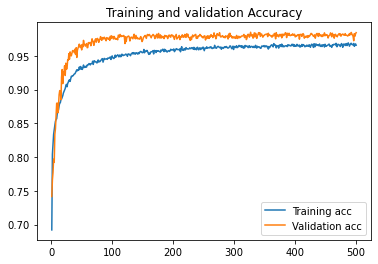

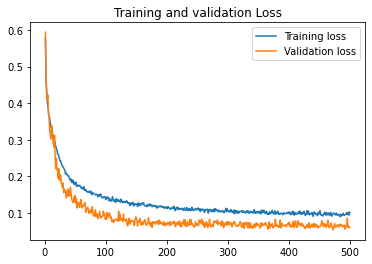

In [52]:
acc = history1.history['acc']
val_acc = history1.history['val_acc']
 
loss = history1.history['loss']
val_loss = history1.history['val_loss']

epochs = range(1, 501)
 
plt.figure()
 
plt.plot(epochs, acc, label='Training acc')
plt.plot(epochs, val_acc, label='Validation acc')
plt.title('Training and validation Accuracy')
plt.legend()
plt.show()


plt.plot(epochs, loss, label='Training loss')
plt.plot(epochs, val_loss, label='Validation loss')
plt.title('Training and validation Loss')
plt.legend()
plt.show()

In [53]:
best_epoch_model = np.argmin(history1.history['val_loss'])
print("best epoch:%s \nvalidation loss:%.3f \nvalidation acc:%.3f"%(best_epoch_model, 
                                                                 history1.history['val_loss'][best_epoch_model], 
                                                                 history1.history['val_acc'][best_epoch_model]))

best epoch:471 
validation loss:0.053 
validation acc:0.983


Using the accuracy and loss plots over 500 epoch above, we can choose 250 as a good epoch value

##### [Back to Top](#A-Predictive-Analysis-on-Credit-Card-Customer-Churn-Using-Maching-Learning-and-Deep-Learning-Techniques)

## 4. Cross Validation using Machine Learning and Deep Learning models

The models are developed using a 10-fold cross-validation. 

By using cross validation, we can verify how accurate the model is performing on multiple and different subsets of data, therefore, ensuring that it generalizes well to the new samples.

In [54]:
def get_cross_validation(X, y,models):
    fold = 0
    cv_outer = StratifiedKFold(n_splits=10, shuffle=True)
    cv_performance_df = pd.DataFrame([], columns =["Model", "Accuracy", "Precision", "Recall", "F1-Score"])
    
    for train_ix, test_ix in cv_outer.split(X,y):
        print("Fold ",fold +1)
        fold +=1
        for clf in models:
            model = models[clf]
            x_train_cv, x_test_cv = X.iloc[train_ix, :], X.iloc[test_ix, :]
            y_train_cv, y_test_cv = y[train_ix], y[test_ix]

            if clf == "ANN":
                x_train_cv = np.asarray(x_train_cv)
                x_test_cv = np.asarray(x_test_cv)

                y_train_cv = np.asarray(y_train_cv)
                y_test_cv = np.asarray(y_test_cv)

                model.fit(x_train_cv,
                          y_train_cv,
                          batch_size=128,
                          epochs=250,
                          validation_split=0.2, 
                          verbose=0)
                Model_prediction = model.predict_classes(x_test_cv)
                
            else:
                model.fit(x_train_cv, y_train_cv)
                Model_prediction = model.predict(x_test_cv)

            Model_Accuracy = accuracy_score(y_test_cv, Model_prediction)
            #print("Accuracy: " ,Model_Accuracy)

            Model_Precision = precision_score(y_test_cv, Model_prediction, zero_division =0) 
            #print("Precision: ",Model_Precision)

            Model_Recall = recall_score(y_test_cv, Model_prediction) 
            #print("Recall: ",Model_Recall)

            Model_f1_score = f1_score(y_test_cv, Model_prediction) 
            #print("F1 Score: ",Model_f1_score)
            
            cv_performance_df = cv_performance_df.append({"Model": clf,
                                                          "Accuracy": Model_Accuracy,
                                                          "Precision": Model_Precision, 
                                                          "Recall": Model_Recall,
                                                          "F1-Score": Model_f1_score}, 
                                                         ignore_index=True)
    print("Cross Validation Complete")
    return cv_performance_df

## CV on selected features

In [55]:
X = Churn_Dataset.drop(["attrition_flag"],axis=1)
y = Churn_Dataset["attrition_flag"]

classifiers = {"Random Forest":RandomForestClassifier(), 
               "SVC":SVC(), 
               "K-Nearest Neighbours": KNeighborsClassifier(),
               "Logistic Regression":LogisticRegression(max_iter=100000),
               "XGBClassifier": XGBClassifier(eval_metric="logloss",use_label_encoder=False),
               "ANN": ANN_model()}

cv_df = get_cross_validation(X,y,classifiers)

Fold  1
Fold  2
Fold  3
Fold  4
Fold  5
Fold  6
Fold  7
Fold  8
Fold  9
Fold  10
Cross Validation Complete


In [56]:
cv_df.groupby(["Model"]).mean()

,Accuracy,Precision,Recall,F1-Score
Model,,,,
ANN,0.839341,0.000000,0.000000,0.000000
K-Nearest Neighbours,0.896217,0.713803,0.592452,0.646614
Logistic Regression,0.877159,0.747010,0.357695,0.483042
Random Forest,0.949441,0.910122,0.760869,0.828343
SVC,0.839341,0.000000,0.000000,0.000000
XGBClassifier,0.963661,0.910806,0.857998,0.883340


In [57]:
cv_df.groupby(["Model"]).std()

,Accuracy,Precision,Recall,F1-Score
Model,,,,
ANN,0.000401,0.000000,0.000000,0.000000
K-Nearest Neighbours,0.008417,0.033095,0.044944,0.033556
Logistic Regression,0.006821,0.050297,0.028972,0.031681
Random Forest,0.006674,0.025574,0.035364,0.024651
SVC,0.000401,0.000000,0.000000,0.000000
XGBClassifier,0.007182,0.022338,0.033598,0.024016


## CV on all features

In [58]:
X = Churn_Dataset_all.drop(["attrition_flag"],axis=1)
y = Churn_Dataset_all["attrition_flag"]

classifiers = {"Random Forest":RandomForestClassifier(), 
               "SVC":SVC(), 
               "K-Nearest Neighbours": KNeighborsClassifier(),
               "Logistic Regression":LogisticRegression(max_iter=100000),
               "XGBClassifier": XGBClassifier(eval_metric="logloss",use_label_encoder=False),
               "ANN": ANN_model()}

cv_df = get_cross_validation(X,y,classifiers)

Fold  1
Fold  2
Fold  3
Fold  4
Fold  5
Fold  6
Fold  7
Fold  8
Fold  9
Fold  10
Cross Validation Complete


In [59]:
cv_df.groupby(["Model"]).mean()

,Accuracy,Precision,Recall,F1-Score
Model,,,,
ANN,0.897112,0.666228,0.453227,0.537224
K-Nearest Neighbours,0.892960,0.706829,0.570374,0.630813
Logistic Regression,0.892565,0.740959,0.511956,0.604126
Random Forest,0.962577,0.931011,0.829183,0.876691
SVC,0.839341,0.000000,0.000000,0.000000
XGBClassifier,0.972846,0.937058,0.891241,0.913208


In [60]:
cv_df.groupby(["Model"]).std()

,Accuracy,Precision,Recall,F1-Score
Model,,,,
ANN,0.031394,0.353353,0.245236,0.285457
K-Nearest Neighbours,0.007529,0.026590,0.039518,0.031265
Logistic Regression,0.008871,0.044201,0.048047,0.038257
Random Forest,0.006757,0.026469,0.033479,0.022887
SVC,0.000401,0.000000,0.000000,0.000000
XGBClassifier,0.006917,0.022085,0.035251,0.022701


##### [Back to Top](#A-Predictive-Analysis-on-Credit-Card-Customer-Churn-Using-Maching-Learning-and-Deep-Learning-Techniques)

## Class Balancing Techniques

Only a small percentage of 16.1% of the customers who have decided to churn, therefore class balancing techniques will be required to improve the modelling performance. The experiment carried out for the SMOTE dataset and the Randomly Sampled Dataset. 

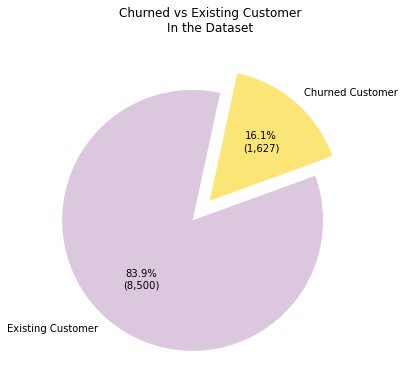

In [61]:
true_count = Churn_Dataset[Churn_Dataset['attrition_flag'] == 1].shape[0]
false_count = Churn_Dataset[Churn_Dataset['attrition_flag'] == 0].shape[0]

total = Churn_Dataset.shape[0]
input_data = [true_count, false_count]
labels = ['Churned Customer', 'Existing Customer']
explode = [0,0.2]
plt.figure(figsize = (8, 6))
colors = ["#fce577", "#dcc8de"]
#create pie chart
plt.pie(input_data, labels = labels, 
        colors = colors, 
        autopct=lambda x: '{:.1f}%\n({})'.format(x, format(int((total*x/100).round(0)),",")),
        startangle = 20,explode =explode)

plt.title("Churned vs Existing Customer\nIn the Dataset")
plt.show()

# 5. SMOTE Balancing Technique

Synthetic Minority Oversampling Technique, or SMOTE oversampling method is used to increase the label churn example, balancing the number of churn and attritted customer examples of label samples.

In [62]:
def getSMOTE(X,y):
    counter = Counter(y)
    print("Distribution Before SMOTE")
    print(counter)

    # transform the dataset
    oversample = SMOTE()
    X, y = oversample.fit_resample(X, y)

    # summarize the new class distribution
    print("\nDistribution After SMOTE")
    counter = Counter(y)
    print(counter)
    
    return X,y

In [63]:
from sklearn.preprocessing import MinMaxScaler
def data_normalization(train_df, val_df, test_df):
    scaler = MinMaxScaler()
    # fitting the scaler to training data
    scaler = scaler.fit(train_df)
    # Transforming training and test data using scaler
    train_df = scaler.transform(train_df)
    val_df = scaler.transform(val_df)
    test_df = scaler.transform(test_df)
    
    return train_df, val_df, test_df

##### [Back to Top](#A-Predictive-Analysis-on-Credit-Card-Customer-Churn-Using-Maching-Learning-and-Deep-Learning-Techniques)

## 5.1 Modelling using Random Forest, SVM, KNN, ANN, Logistic Regression and Ensembles (Stacking & Voting)

In [64]:
from sklearn.utils import shuffle
def split_data(X_all, y_all, testing_size):
    
    X_y = X_all.copy()
    X_y["target"] = y_all
    X_y = shuffle(X_y)
    
    X_all = X_y.drop("target", axis=1)
    y_all = X_y["target"]

    training_size = int(testing_size[0]*len(X_all))
    validation_size = int(testing_size[1]*len(X_all))  
    testing_size = int(testing_size[2]*len(X_all))
    
    X_train = X_all.iloc[:training_size].reset_index(drop=True)
    y_train = y_all.iloc[:training_size].reset_index(drop=True)
    
    X_validation = X_all.iloc[training_size:training_size+validation_size].reset_index(drop=True)
    y_validation = y_all.iloc[training_size:training_size+validation_size].reset_index(drop=True)

    X_test = X_all.iloc[training_size+validation_size:].reset_index(drop=True)
    y_test = y_all.iloc[training_size+validation_size:].reset_index(drop=True)

    return X_train, y_train, X_validation, y_validation, X_test, y_test

In [71]:
def runCustomEnsemble(X_all,y_all, dic_models):
    df_vote = pd.DataFrame([])
    X_train, y_train, X_val, y_val, X_test, y_test = split_data(X_all,y_all,[0.7,0.15,0.15])
    
    # Applying normalization to data
    X_train, X_val, X_test = data_normalization(X_train, X_val, X_test )
    
    X_train, y_train = getSMOTE(X_train, y_train)
    
    df_ensemble_train = pd.DataFrame([])
    df_ensemble_train["label"] = y_val
    
    df_ensemble_test = pd.DataFrame([])
    df_ensemble_test["label"] = y_test
    
    df_performance = pd.DataFrame(columns=["Model","Accuracy","Precision","Recall", "F1 Score"])

    plt.rcParams['figure.figsize'] = [6, 4]
    for key in dic_models:
        print(key)
        row={}
        model = dic_models[key]
        if key != "ANN":
            model.fit(X_train, y_train)
            pred1 = model.predict(X_val)
            df_ensemble_train[key] = pred1
            pred2 = model.predict(X_test)
            df_ensemble_test[key] = pred2
        else:
            X_train = np.asarray(X_train)
            X_val = np.asarray(X_val)
            X_test = np.asarray(X_test)
            
            y_train = np.asarray(y_train)
            y_val = np.asarray(y_val)
            y_test = np.asarray(y_test)
            
            model.fit(X_train,
                      y_train,
                      batch_size=128,
                      epochs=250,
                      validation_split=0.2, 
                      verbose=0)
            pred1 = model.predict_classes(X_val)
            df_ensemble_train[key] = pred1
            pred2 = model.predict_classes(X_test)
            df_ensemble_test[key] = pred2
        
        Model_Accuracy = accuracy_score(y_test, pred2)
        Model_Precision = precision_score(y_test, pred2) 
        Model_Recall = recall_score(y_test, pred2)      
        Model_f1_score = f1_score(y_test, pred2) 
        
        plt.rcParams['figure.figsize'] = [6, 4]
        cf_matrix = confusion_matrix(y_test, pred2)
        ax = sns.heatmap(cf_matrix, annot=True, cmap='Purples',fmt='g')

        ax.set_title('Confusion Matrix\nof ' + key);
        ax.set_ylabel('Actual Category ');
        ax.set_xlabel('Predicted Category')
        ax.xaxis.set_ticklabels(['Not Churn','Churn'])
        ax.yaxis.set_ticklabels(['Not Churn','Churn'])

        plt.show()

        row["Model"]= key
        row['Accuracy'] = Model_Accuracy
        row['Precision'] = Model_Precision
        row["Recall"] = Model_Recall
        row["F1 Score"] = Model_f1_score

        df_performance = df_performance.append(row,ignore_index=True)      


    X = df_ensemble_train.drop("label", axis=1)
    y = df_ensemble_train["label"]
    
    X_test = df_ensemble_test.drop("label", axis=1)
    y_test = df_ensemble_test["label"]
    
    model = LogisticRegression()
    model.fit(X, y)
        
    pred = model.predict(X_test)

    
    Model_Accuracy = accuracy_score(y_test, pred)
    Model_Precision = precision_score(y_test, pred) 
    Model_Recall = recall_score(y_test, pred)      
    Model_f1_score = f1_score(y_test, pred) 
    
    plt.rcParams['figure.figsize'] = [6, 4]
    cf_matrix = confusion_matrix(y_test, pred)
    ax = sns.heatmap(cf_matrix, annot=True, cmap='Purples',fmt='g')

    ax.set_title('Confusion Matrix\nof Stacking Ensemble');
    ax.set_ylabel('Actual Category ');
    ax.set_xlabel('Predicted Category')
    ax.xaxis.set_ticklabels(['Not Churn','Churn'])
    ax.yaxis.set_ticklabels(['Not Churn','Churn'])

    plt.show()
    row={}
    row["Model"]= "Stacking_estimator"
    row['Accuracy'] = Model_Accuracy
    row['Precision'] = Model_Precision
    row["Recall"] = Model_Recall
    row["F1 Score"] = Model_f1_score
    df_performance = df_performance.append(row,ignore_index=True)
    
    df_vote = X_test.copy()
    df_vote["vote"] = df_vote.sum(axis=1)
    df_vote["Voting_estimator"] = 0
    df_vote.loc[(df_vote["vote"] >=4), "Voting_estimator"] = 1
    #df_vote.loc[(df_vote["XGBClassifier"] ==0), "Voting_estimator"] = 0
    pred = df_vote["Voting_estimator"]
    
    Model_Accuracy = accuracy_score(y_test, pred)
    Model_Precision = precision_score(y_test, pred) 
    Model_Recall = recall_score(y_test, pred)      
    Model_f1_score = f1_score(y_test, pred) 
    
    plt.rcParams['figure.figsize'] = [6, 4]
    cf_matrix = confusion_matrix(y_test, pred)
    ax = sns.heatmap(cf_matrix, annot=True, cmap='Purples',fmt='g')

    ax.set_title('Confusion Matrix\nof Voting Ensemble');
    ax.set_ylabel('Actual Category ');
    ax.set_xlabel('Predicted Category')
    ax.xaxis.set_ticklabels(['Not Churn','Churn'])
    ax.yaxis.set_ticklabels(['Not Churn','Churn'])

    plt.show()
    
    row={}
    row["Model"]= "Voting_estimator"
    row['Accuracy'] = Model_Accuracy
    row['Precision'] = Model_Precision
    row["Recall"] = Model_Recall
    row["F1 Score"] = Model_f1_score
    df_performance = df_performance.append(row,ignore_index=True)
    

    display(df_performance)
    
    return df_ensemble_train, df_ensemble_test, df_performance

### Modeling on entire dataset

Run  1
Distribution Before SMOTE
Counter({0: 5994, 1: 1094})

Distribution After SMOTE
Counter({0: 5994, 1: 5994})
Random Forest


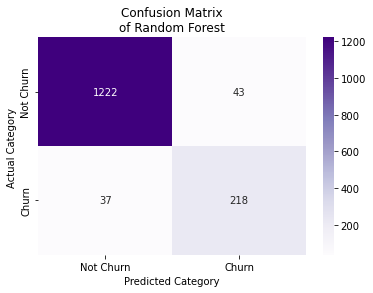

SVC


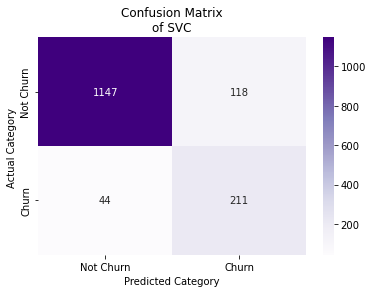

K-Nearest Neighbours


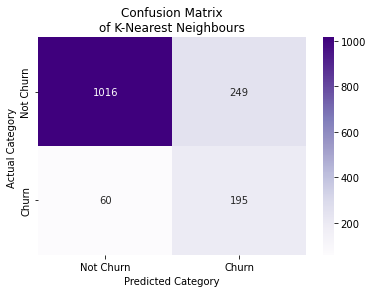

XGBClassifier


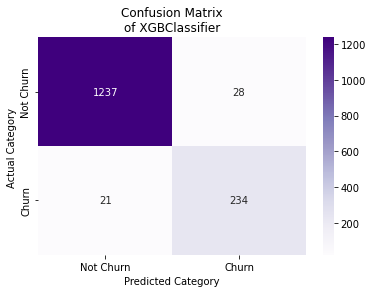

ANN


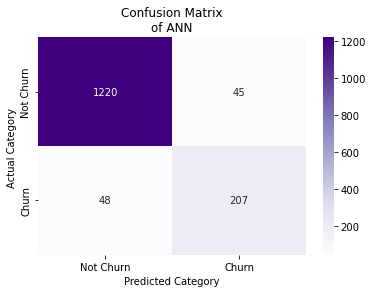

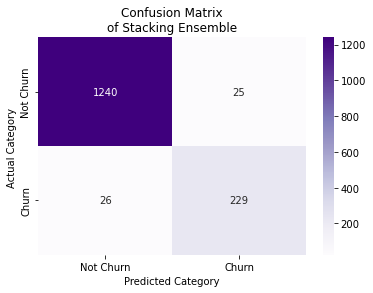

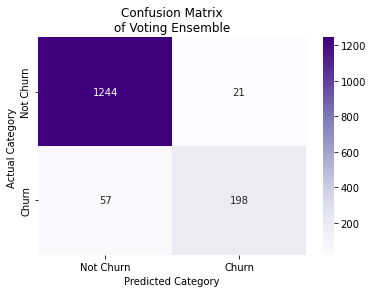

,Model,Accuracy,Precision,Recall,F1 Score
0,Random Forest,0.947368,0.835249,0.854902,0.844961
1,SVC,0.893421,0.641337,0.827451,0.722603
2,K-Nearest Neighbours,0.796711,0.439189,0.764706,0.557940
3,XGBClassifier,0.967763,0.893130,0.917647,0.905222
4,ANN,0.938816,0.821429,0.811765,0.816568
5,Stacking_estimator,0.966447,0.901575,0.898039,0.899804
6,Voting_estimator,0.948684,0.904110,0.776471,0.835443


Run  2
Distribution Before SMOTE
Counter({0: 5960, 1: 1128})

Distribution After SMOTE
Counter({0: 5960, 1: 5960})
Random Forest


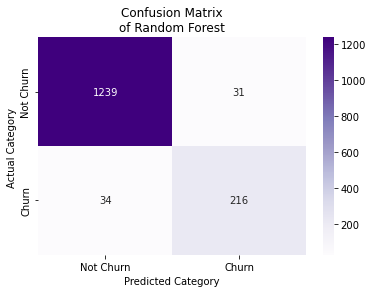

SVC


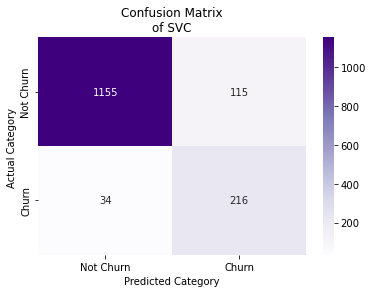

K-Nearest Neighbours


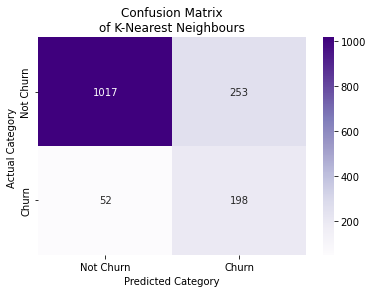

XGBClassifier


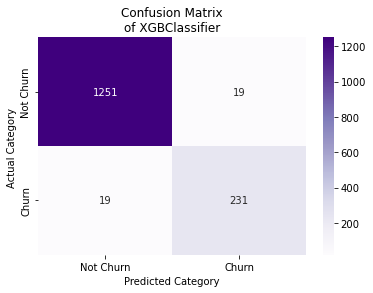

ANN


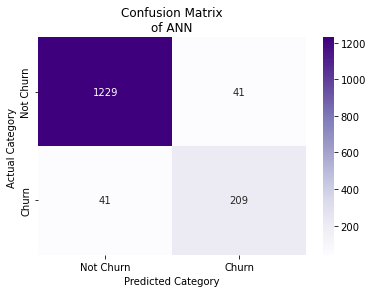

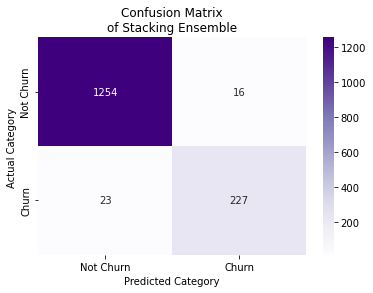

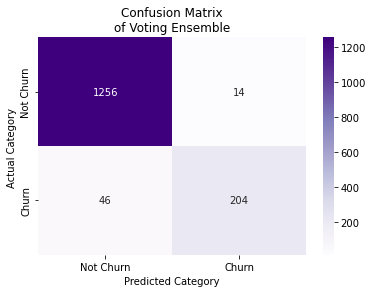

,Model,Accuracy,Precision,Recall,F1 Score
0,Random Forest,0.957237,0.874494,0.864,0.869215
1,SVC,0.901974,0.652568,0.864,0.743546
2,K-Nearest Neighbours,0.799342,0.439024,0.792,0.564907
3,XGBClassifier,0.975000,0.924000,0.924,0.924000
4,ANN,0.946053,0.836000,0.836,0.836000
5,Stacking_estimator,0.974342,0.934156,0.908,0.920892
6,Voting_estimator,0.960526,0.935780,0.816,0.871795


Run  3
Distribution Before SMOTE
Counter({0: 5924, 1: 1164})

Distribution After SMOTE
Counter({0: 5924, 1: 5924})
Random Forest


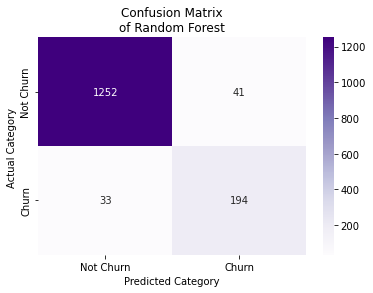

SVC


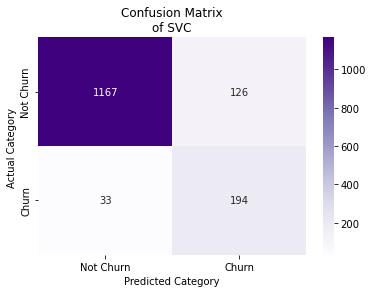

K-Nearest Neighbours


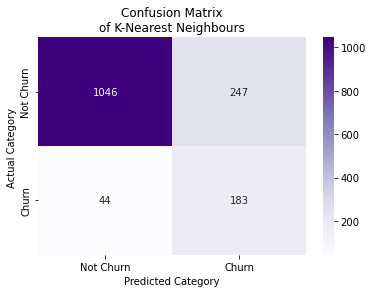

XGBClassifier


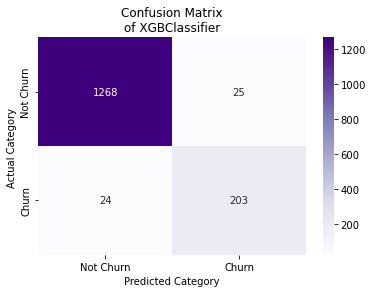

ANN


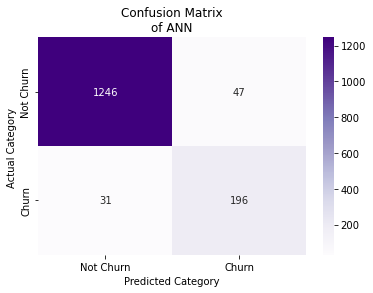

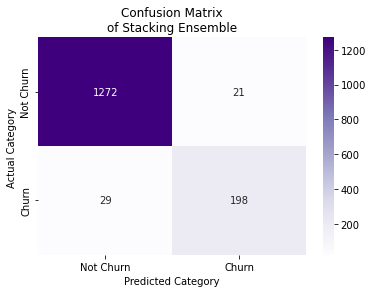

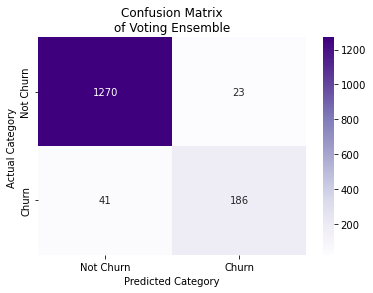

,Model,Accuracy,Precision,Recall,F1 Score
0,Random Forest,0.951316,0.825532,0.854626,0.839827
1,SVC,0.895395,0.606250,0.854626,0.709324
2,K-Nearest Neighbours,0.808553,0.425581,0.806167,0.557078
3,XGBClassifier,0.967763,0.890351,0.894273,0.892308
4,ANN,0.948684,0.806584,0.863436,0.834043
5,Stacking_estimator,0.967105,0.904110,0.872247,0.887892
6,Voting_estimator,0.957895,0.889952,0.819383,0.853211


Run  4
Distribution Before SMOTE
Counter({0: 5961, 1: 1127})

Distribution After SMOTE
Counter({0: 5961, 1: 5961})
Random Forest


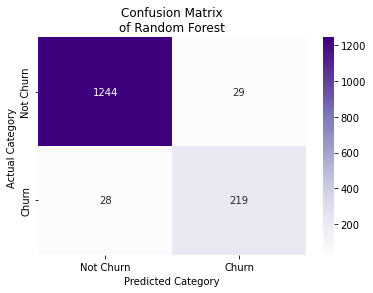

SVC


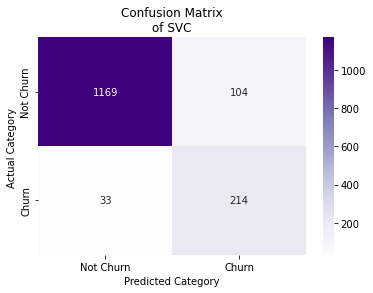

K-Nearest Neighbours


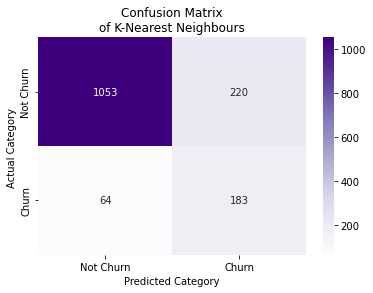

XGBClassifier


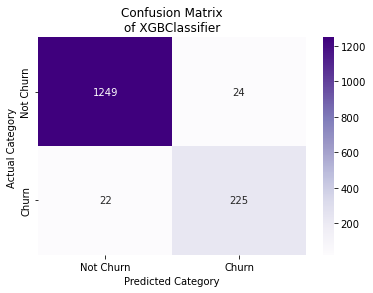

ANN


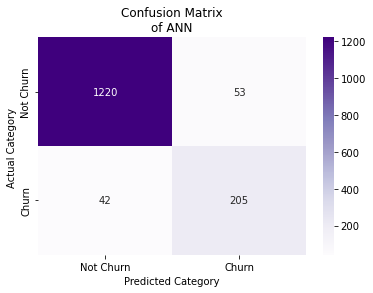

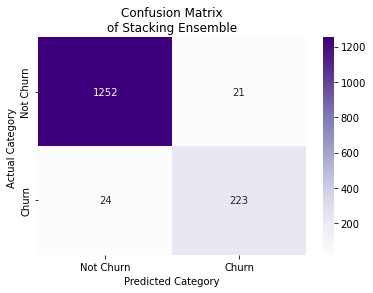

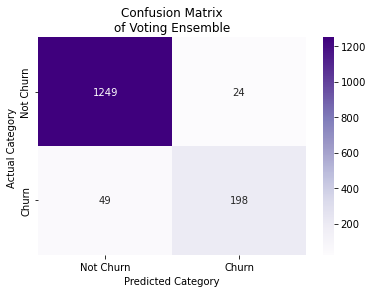

,Model,Accuracy,Precision,Recall,F1 Score
0,Random Forest,0.962500,0.883065,0.886640,0.884848
1,SVC,0.909868,0.672956,0.866397,0.757522
2,K-Nearest Neighbours,0.813158,0.454094,0.740891,0.563077
3,XGBClassifier,0.969737,0.903614,0.910931,0.907258
4,ANN,0.937500,0.794574,0.829960,0.811881
5,Stacking_estimator,0.970395,0.913934,0.902834,0.908350
6,Voting_estimator,0.951974,0.891892,0.801619,0.844350


Run  5
Distribution Before SMOTE
Counter({0: 5966, 1: 1122})

Distribution After SMOTE
Counter({0: 5966, 1: 5966})
Random Forest


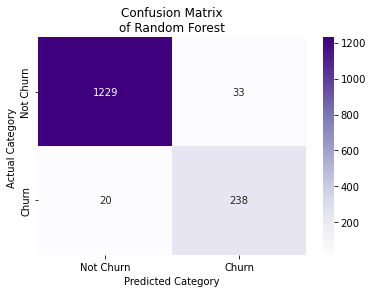

SVC


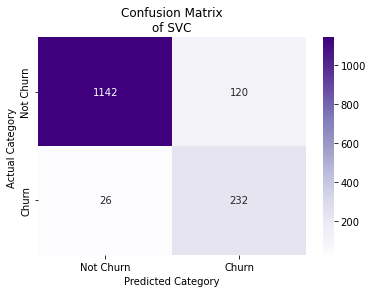

K-Nearest Neighbours


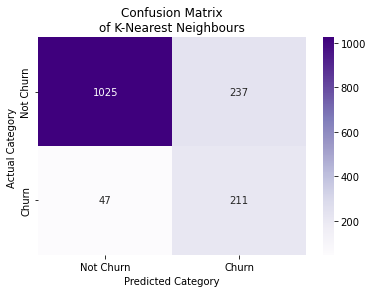

XGBClassifier


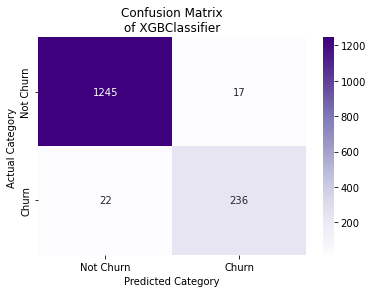

ANN


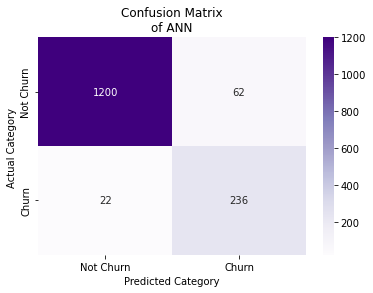

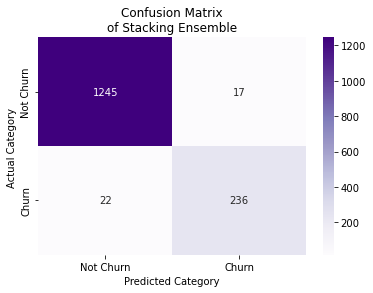

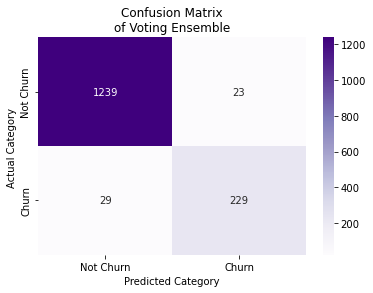

,Model,Accuracy,Precision,Recall,F1 Score
0,Random Forest,0.965132,0.878229,0.922481,0.899811
1,SVC,0.903947,0.659091,0.899225,0.760656
2,K-Nearest Neighbours,0.813158,0.470982,0.817829,0.597734
3,XGBClassifier,0.974342,0.932806,0.914729,0.923679
4,ANN,0.944737,0.791946,0.914729,0.848921
5,Stacking_estimator,0.974342,0.932806,0.914729,0.923679
6,Voting_estimator,0.965789,0.908730,0.887597,0.898039


Run  6
Distribution Before SMOTE
Counter({0: 5947, 1: 1141})

Distribution After SMOTE
Counter({0: 5947, 1: 5947})
Random Forest


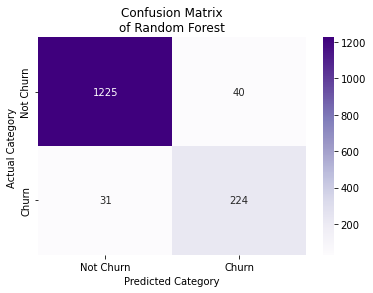

SVC


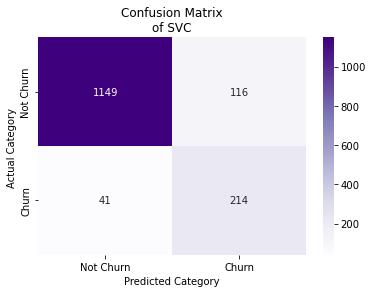

K-Nearest Neighbours


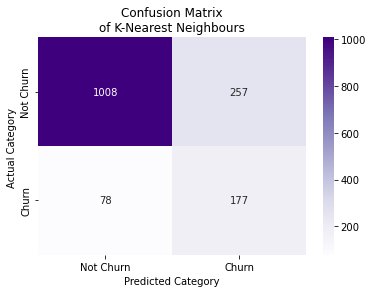

XGBClassifier


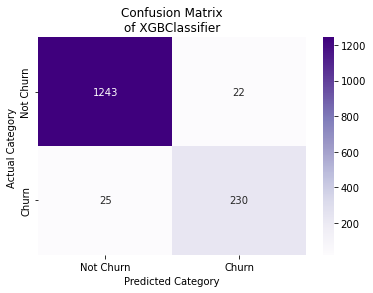

ANN


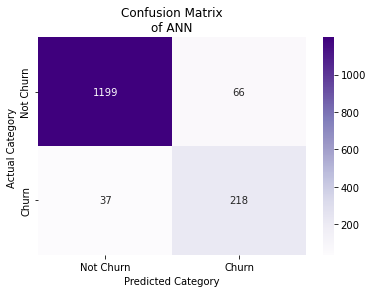

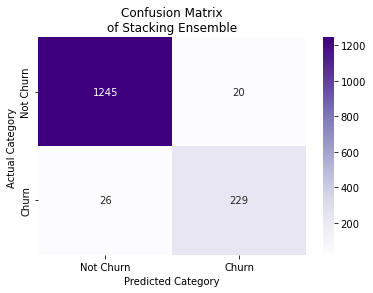

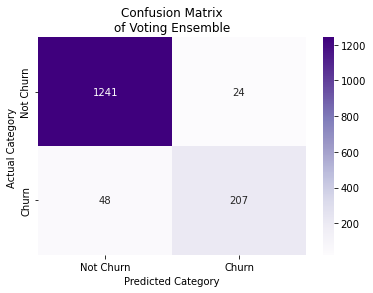

,Model,Accuracy,Precision,Recall,F1 Score
0,Random Forest,0.953289,0.848485,0.878431,0.863198
1,SVC,0.896711,0.648485,0.839216,0.731624
2,K-Nearest Neighbours,0.779605,0.407834,0.694118,0.513788
3,XGBClassifier,0.969079,0.912698,0.901961,0.907298
4,ANN,0.932237,0.767606,0.854902,0.808905
5,Stacking_estimator,0.969737,0.919679,0.898039,0.908730
6,Voting_estimator,0.952632,0.896104,0.811765,0.851852


Run  7
Distribution Before SMOTE
Counter({0: 5963, 1: 1125})

Distribution After SMOTE
Counter({0: 5963, 1: 5963})
Random Forest


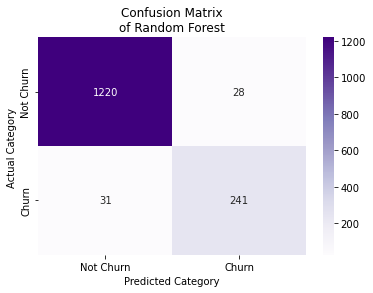

SVC


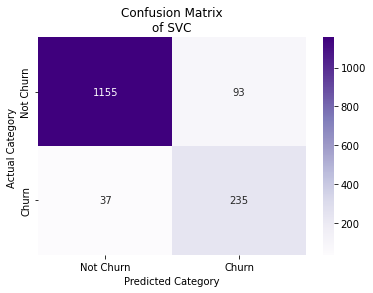

K-Nearest Neighbours


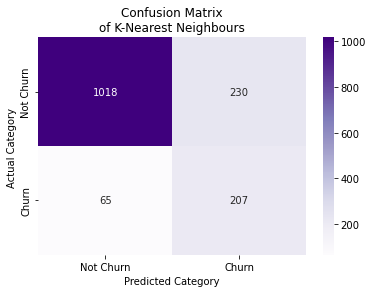

XGBClassifier


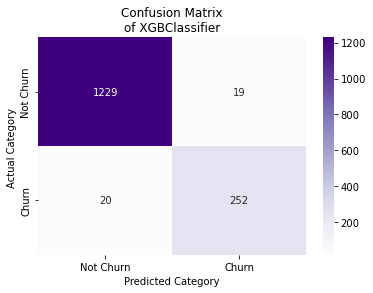

ANN


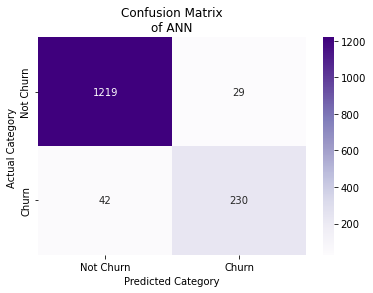

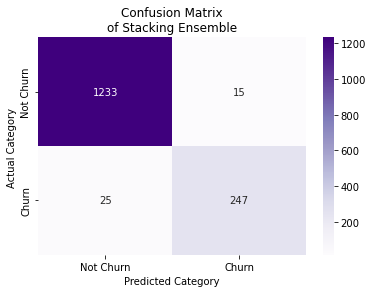

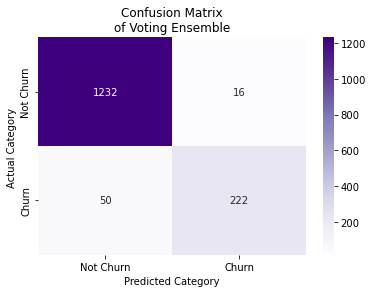

,Model,Accuracy,Precision,Recall,F1 Score
0,Random Forest,0.961184,0.895911,0.886029,0.890943
1,SVC,0.914474,0.716463,0.863971,0.783333
2,K-Nearest Neighbours,0.805921,0.473684,0.761029,0.583921
3,XGBClassifier,0.974342,0.929889,0.926471,0.928177
4,ANN,0.953289,0.888031,0.845588,0.866290
5,Stacking_estimator,0.973684,0.942748,0.908088,0.925094
6,Voting_estimator,0.956579,0.932773,0.816176,0.870588


Run  8
Distribution Before SMOTE
Counter({0: 5963, 1: 1125})

Distribution After SMOTE
Counter({0: 5963, 1: 5963})
Random Forest


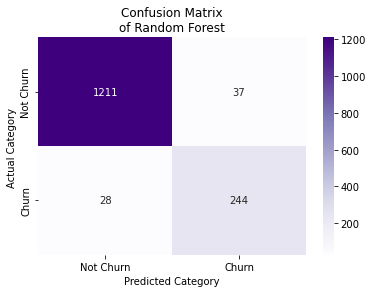

SVC


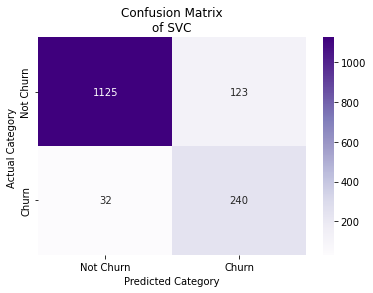

K-Nearest Neighbours


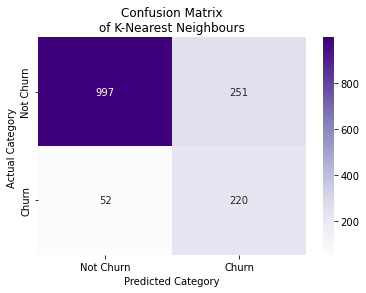

XGBClassifier


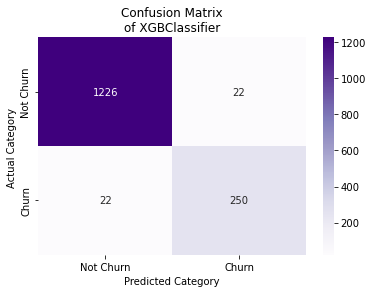

ANN


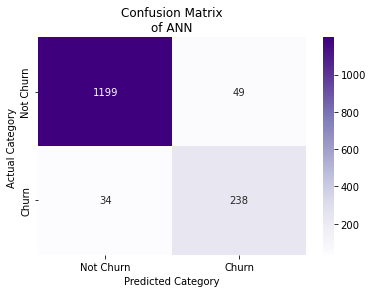

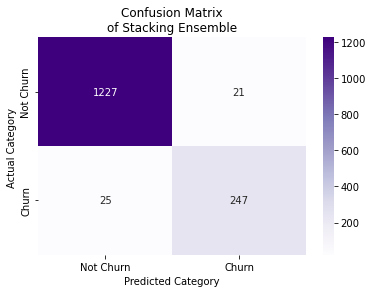

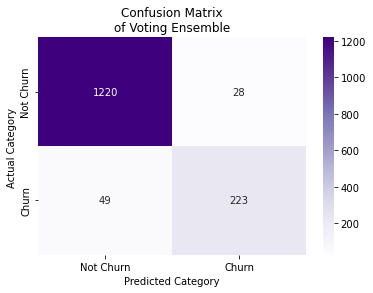

,Model,Accuracy,Precision,Recall,F1 Score
0,Random Forest,0.957237,0.868327,0.897059,0.882459
1,SVC,0.898026,0.661157,0.882353,0.755906
2,K-Nearest Neighbours,0.800658,0.467091,0.808824,0.592194
3,XGBClassifier,0.971053,0.919118,0.919118,0.919118
4,ANN,0.945395,0.829268,0.875000,0.851521
5,Stacking_estimator,0.969737,0.921642,0.908088,0.914815
6,Voting_estimator,0.949342,0.888446,0.819853,0.852772


Run  9
Distribution Before SMOTE
Counter({0: 5940, 1: 1148})

Distribution After SMOTE
Counter({0: 5940, 1: 5940})
Random Forest


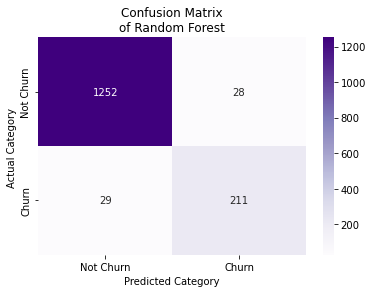

SVC


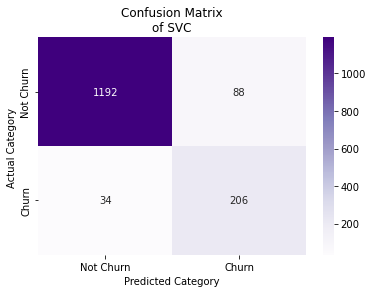

K-Nearest Neighbours


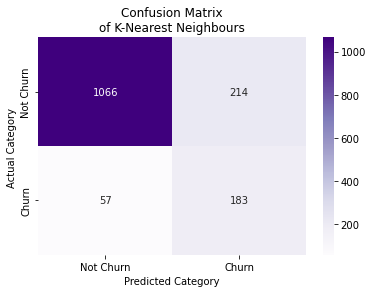

XGBClassifier


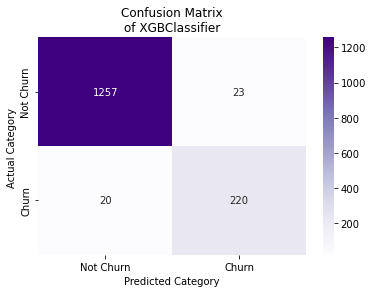

ANN


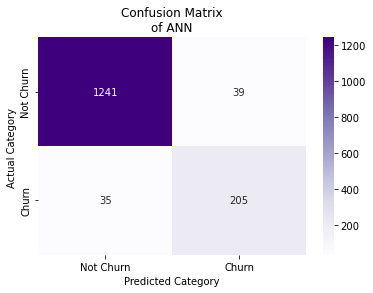

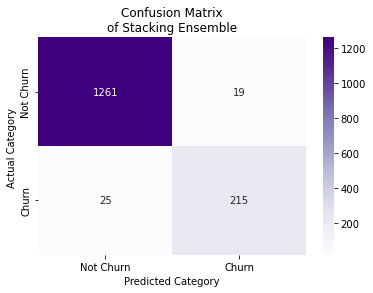

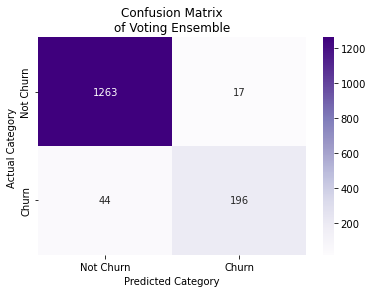

,Model,Accuracy,Precision,Recall,F1 Score
0,Random Forest,0.962500,0.882845,0.879167,0.881002
1,SVC,0.919737,0.700680,0.858333,0.771536
2,K-Nearest Neighbours,0.821711,0.460957,0.762500,0.574568
3,XGBClassifier,0.971711,0.905350,0.916667,0.910973
4,ANN,0.951316,0.840164,0.854167,0.847107
5,Stacking_estimator,0.971053,0.918803,0.895833,0.907173
6,Voting_estimator,0.959868,0.920188,0.816667,0.865342


Run  10
Distribution Before SMOTE
Counter({0: 5913, 1: 1175})

Distribution After SMOTE
Counter({0: 5913, 1: 5913})
Random Forest


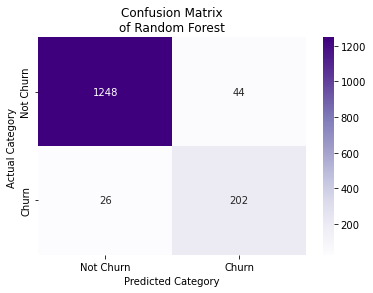

SVC


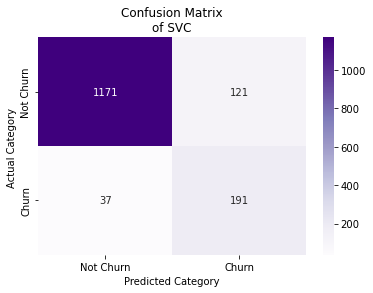

K-Nearest Neighbours


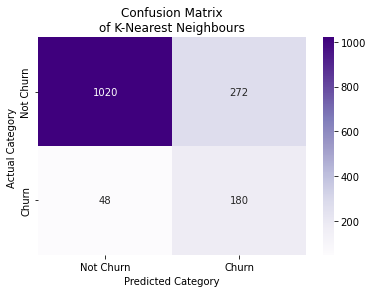

XGBClassifier


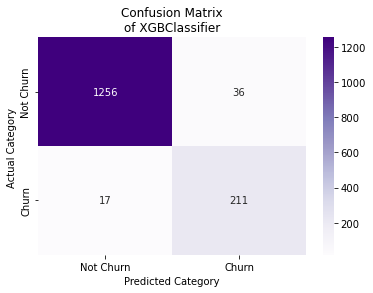

ANN


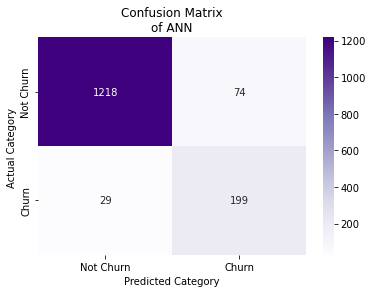

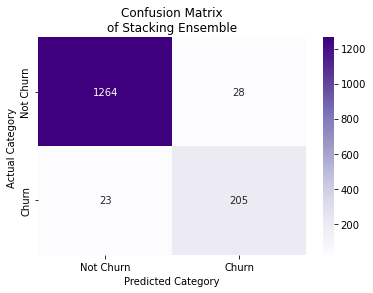

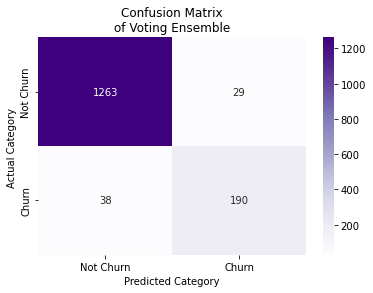

,Model,Accuracy,Precision,Recall,F1 Score
0,Random Forest,0.953947,0.821138,0.885965,0.852321
1,SVC,0.896053,0.612179,0.837719,0.707407
2,K-Nearest Neighbours,0.789474,0.398230,0.789474,0.529412
3,XGBClassifier,0.965132,0.854251,0.925439,0.888421
4,ANN,0.932237,0.728938,0.872807,0.794411
5,Stacking_estimator,0.966447,0.879828,0.899123,0.889371
6,Voting_estimator,0.955921,0.867580,0.833333,0.850112


In [72]:
performance_final = pd.DataFrame([])
X = Churn_Dataset_all.drop(["attrition_flag"],axis=1)
y = Churn_Dataset_all["attrition_flag"]
num_of_run = 10
for i in range(num_of_run):
    print("Run ",i+1)
    classifiers = {"Random Forest":RandomForestClassifier(), 
                   "SVC":SVC(), 
                   "K-Nearest Neighbours": KNeighborsClassifier(),
                   "XGBClassifier": XGBClassifier(eval_metric="logloss",use_label_encoder=False), 
                   "ANN": ANN_model()}

    df_ensemble_train, df_ensemble_test, df_performance = runCustomEnsemble(X,y,classifiers)
    performance_final = pd.concat([performance_final,df_performance])


In [73]:
performance_final.groupby(["Model"]).mean()

,Accuracy,Precision,Recall,F1 Score
Model,,,,
ANN,0.943026,0.810454,0.855835,0.831565
K-Nearest Neighbours,0.802829,0.443667,0.773754,0.563462
Random Forest,0.957171,0.861327,0.880930,0.870859
SVC,0.902961,0.657117,0.859329,0.744346
Stacking_estimator,0.970329,0.916928,0.900502,0.908580
Voting_estimator,0.955921,0.903555,0.819886,0.859350
XGBClassifier,0.970592,0.906521,0.915123,0.910645


In [74]:
performance_final.groupby(["Model"]).std()

,Accuracy,Precision,Recall,F1 Score
Model,,,,
ANN,0.007490,0.043612,0.028471,0.022801
K-Nearest Neighbours,0.012402,0.026501,0.037410,0.026336
Random Forest,0.005697,0.026627,0.020374,0.020313
SVC,0.008963,0.034387,0.021411,0.025946
Stacking_estimator,0.003077,0.018361,0.011611,0.013196
Voting_estimator,0.005381,0.021331,0.028067,0.017742
XGBClassifier,0.003298,0.023386,0.010351,0.013374


In [81]:
performance_final.groupby(["Model"]).max()

,Accuracy,Precision,Recall,F1 Score
Model,,,,
ANN,0.953289,0.888031,0.914729,0.866290
K-Nearest Neighbours,0.821711,0.473684,0.817829,0.597734
Random Forest,0.965132,0.895911,0.922481,0.899811
SVC,0.919737,0.716463,0.899225,0.783333
Stacking_estimator,0.974342,0.942748,0.914729,0.925094
Voting_estimator,0.965789,0.935780,0.887597,0.898039
XGBClassifier,0.975000,0.932806,0.926471,0.928177


In [75]:
performance_final.to_csv("Performance_SMOTE_all.csv")

In [79]:
df_ensemble_train.tail(10) #Sample training and testing data for ensemble models

,label,Random Forest,SVC,K-Nearest Neighbours,XGBClassifier,ANN
1509,0,0,0,0,0,0
1510,0,0,0,0,0,0
1511,1,1,1,1,1,1
1512,1,1,1,0,1,1
1513,0,0,0,0,0,0
1514,0,0,1,1,0,0
1515,0,0,0,1,0,0
1516,0,0,0,0,0,0
1517,0,0,0,0,0,0
1518,0,0,0,1,0,0


### Modeling on dataset with Feature Selection

Run  1
Distribution Before SMOTE
Counter({0: 5958, 1: 1130})

Distribution After SMOTE
Counter({0: 5958, 1: 5958})
Random Forest


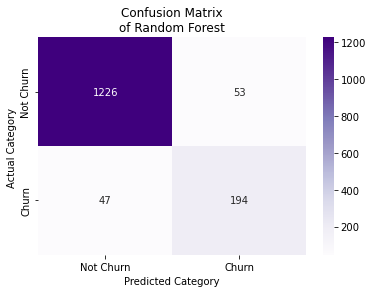

SVC


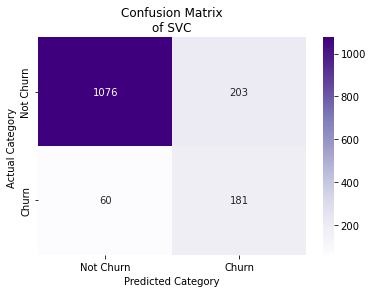

K-Nearest Neighbours


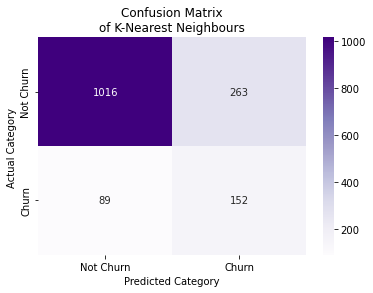

XGBClassifier


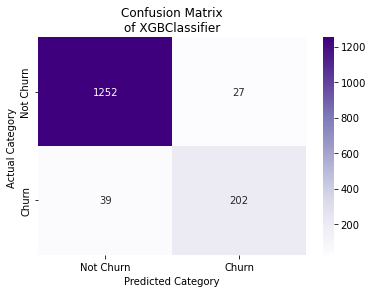

ANN


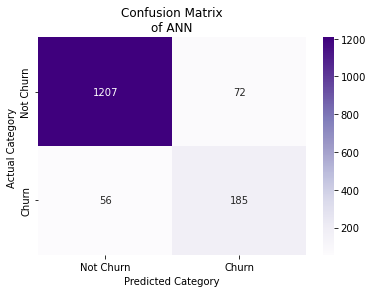

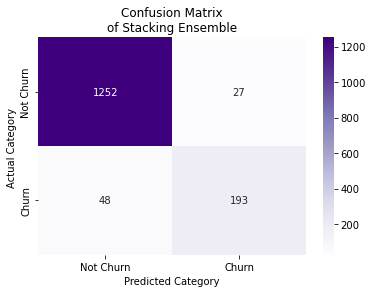

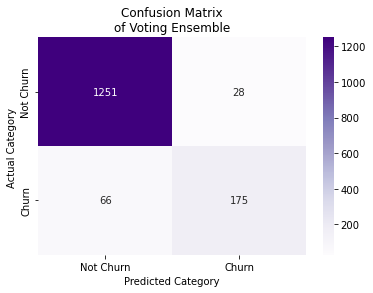

,Model,Accuracy,Precision,Recall,F1 Score
0,Random Forest,0.934211,0.785425,0.804979,0.795082
1,SVC,0.826974,0.471354,0.751037,0.579200
2,K-Nearest Neighbours,0.768421,0.366265,0.630705,0.463415
3,XGBClassifier,0.956579,0.882096,0.838174,0.859574
4,ANN,0.915789,0.719844,0.767635,0.742972
5,Stacking_estimator,0.950658,0.877273,0.800830,0.837310
6,Voting_estimator,0.938158,0.862069,0.726141,0.788288


Run  2
Distribution Before SMOTE
Counter({0: 5937, 1: 1151})

Distribution After SMOTE
Counter({0: 5937, 1: 5937})
Random Forest


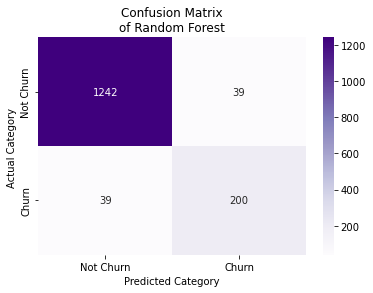

SVC


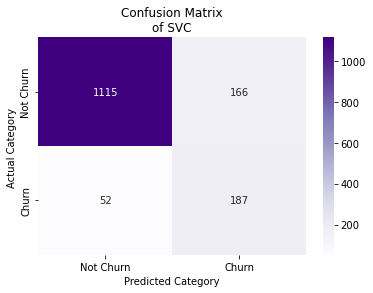

K-Nearest Neighbours


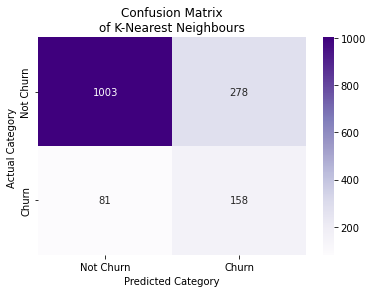

XGBClassifier


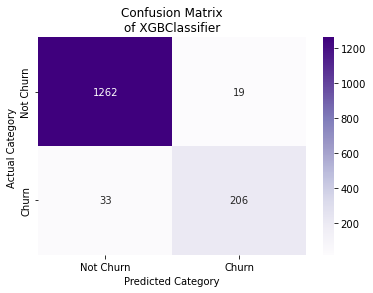

ANN


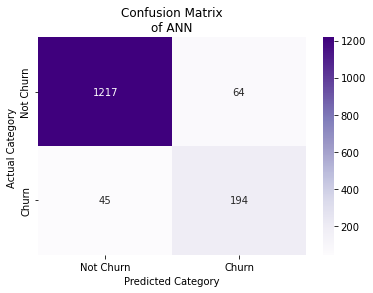

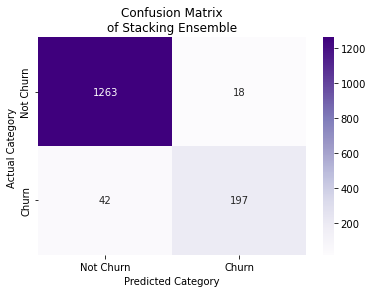

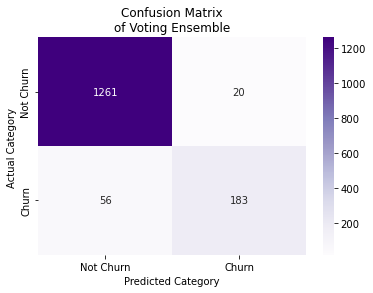

,Model,Accuracy,Precision,Recall,F1 Score
0,Random Forest,0.948684,0.836820,0.836820,0.836820
1,SVC,0.856579,0.529745,0.782427,0.631757
2,K-Nearest Neighbours,0.763816,0.362385,0.661088,0.468148
3,XGBClassifier,0.965789,0.915556,0.861925,0.887931
4,ANN,0.928289,0.751938,0.811715,0.780684
5,Stacking_estimator,0.960526,0.916279,0.824268,0.867841
6,Voting_estimator,0.950000,0.901478,0.765690,0.828054


Run  3
Distribution Before SMOTE
Counter({0: 5932, 1: 1156})

Distribution After SMOTE
Counter({0: 5932, 1: 5932})
Random Forest


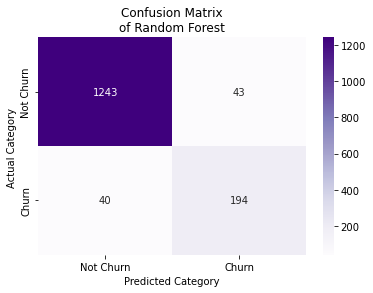

SVC


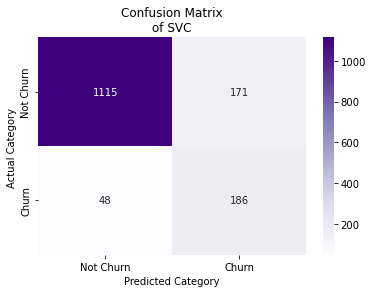

K-Nearest Neighbours


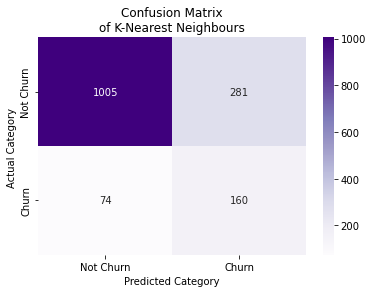

XGBClassifier


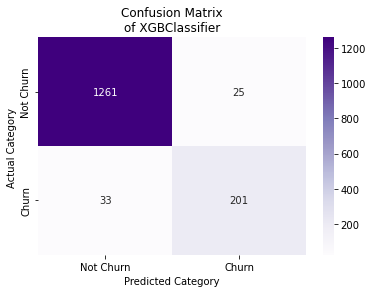

ANN


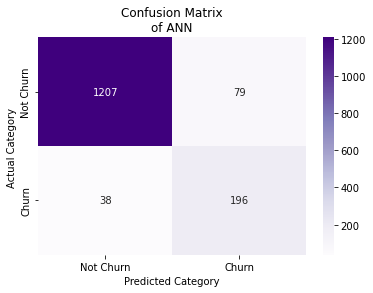

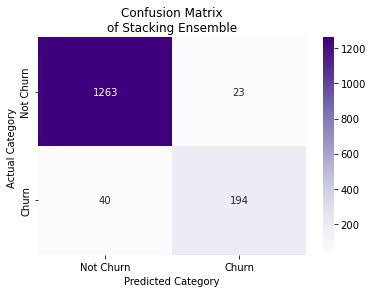

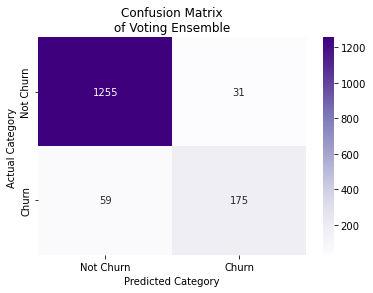

,Model,Accuracy,Precision,Recall,F1 Score
0,Random Forest,0.945395,0.818565,0.829060,0.823779
1,SVC,0.855921,0.521008,0.794872,0.629442
2,K-Nearest Neighbours,0.766447,0.362812,0.683761,0.474074
3,XGBClassifier,0.961842,0.889381,0.858974,0.873913
4,ANN,0.923026,0.712727,0.837607,0.770138
5,Stacking_estimator,0.958553,0.894009,0.829060,0.860310
6,Voting_estimator,0.940789,0.849515,0.747863,0.795455


Run  4
Distribution Before SMOTE
Counter({0: 5946, 1: 1142})

Distribution After SMOTE
Counter({0: 5946, 1: 5946})
Random Forest


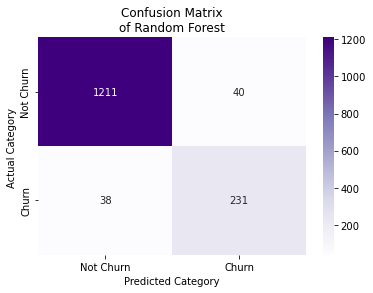

SVC


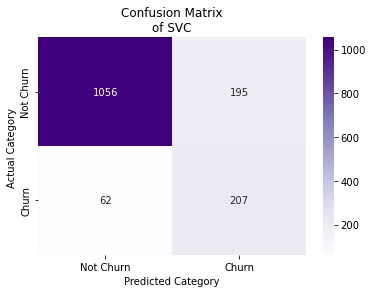

K-Nearest Neighbours


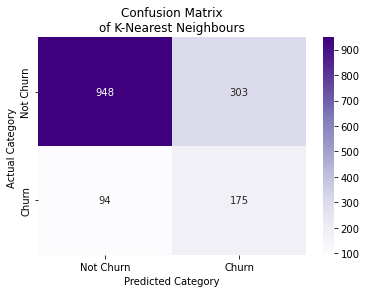

XGBClassifier


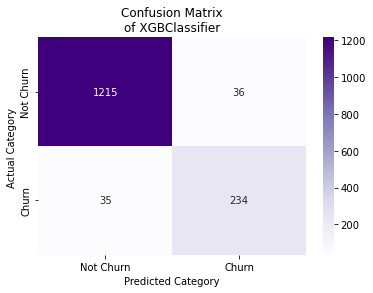

ANN


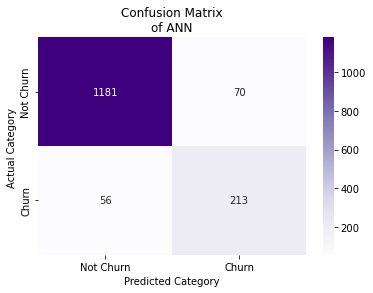

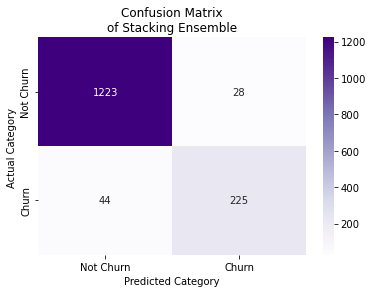

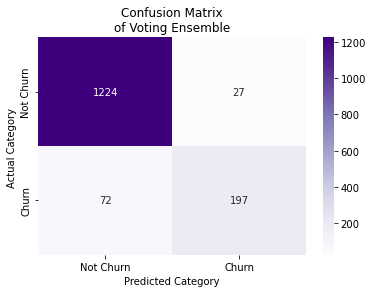

,Model,Accuracy,Precision,Recall,F1 Score
0,Random Forest,0.948684,0.852399,0.858736,0.855556
1,SVC,0.830921,0.514925,0.769517,0.616990
2,K-Nearest Neighbours,0.738816,0.366109,0.650558,0.468541
3,XGBClassifier,0.953289,0.866667,0.869888,0.868275
4,ANN,0.917105,0.752650,0.791822,0.771739
5,Stacking_estimator,0.952632,0.889328,0.836431,0.862069
6,Voting_estimator,0.934868,0.879464,0.732342,0.799189


Run  5
Distribution Before SMOTE
Counter({0: 5947, 1: 1141})

Distribution After SMOTE
Counter({0: 5947, 1: 5947})
Random Forest


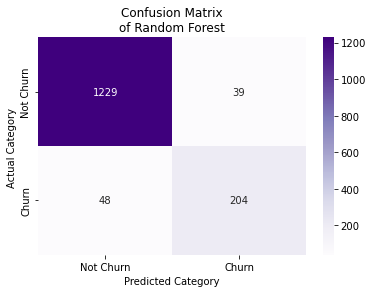

SVC


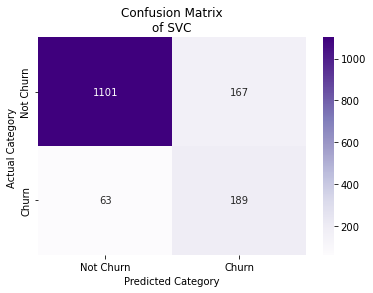

K-Nearest Neighbours


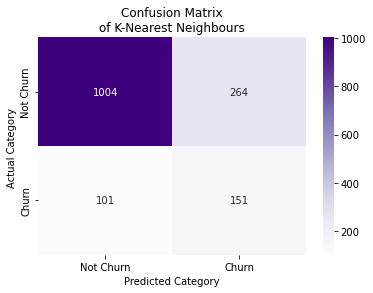

XGBClassifier


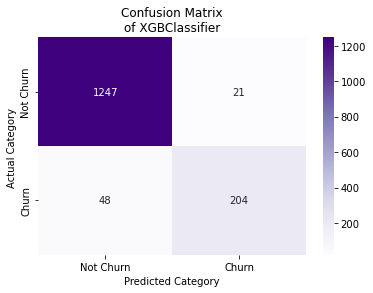

ANN


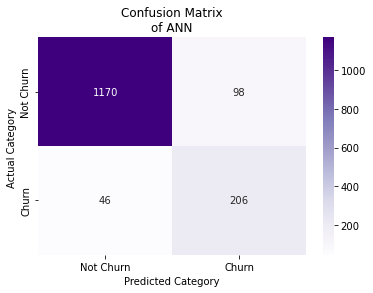

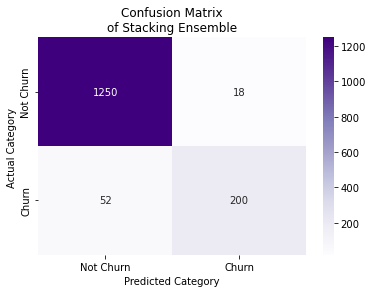

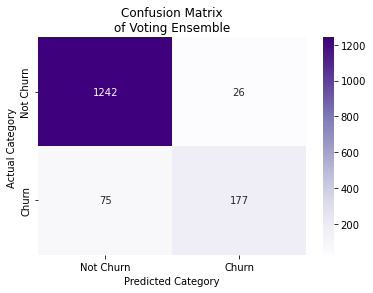

,Model,Accuracy,Precision,Recall,F1 Score
0,Random Forest,0.942763,0.839506,0.809524,0.824242
1,SVC,0.848684,0.530899,0.750000,0.621711
2,K-Nearest Neighbours,0.759868,0.363855,0.599206,0.452774
3,XGBClassifier,0.954605,0.906667,0.809524,0.855346
4,ANN,0.905263,0.677632,0.817460,0.741007
5,Stacking_estimator,0.953947,0.917431,0.793651,0.851064
6,Voting_estimator,0.933553,0.871921,0.702381,0.778022


Run  6
Distribution Before SMOTE
Counter({0: 5964, 1: 1124})

Distribution After SMOTE
Counter({0: 5964, 1: 5964})
Random Forest


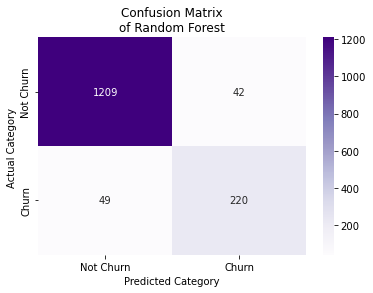

SVC


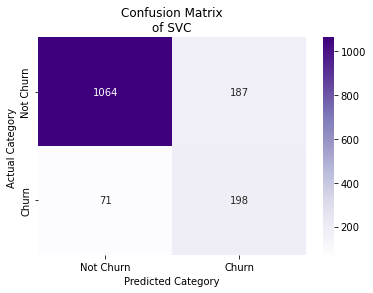

K-Nearest Neighbours


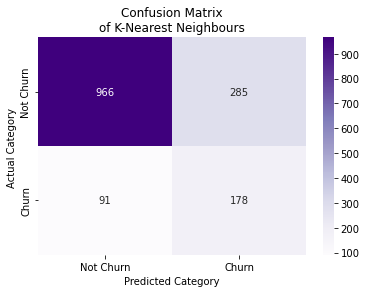

XGBClassifier


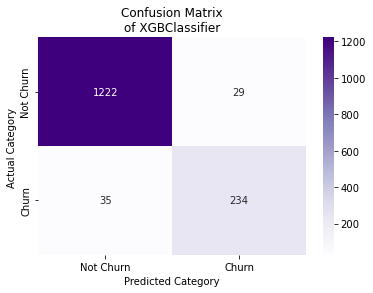

ANN


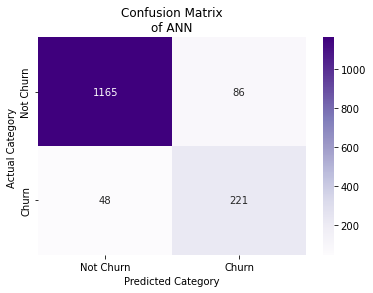

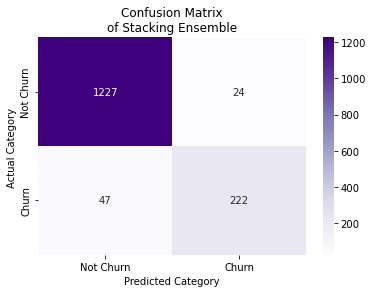

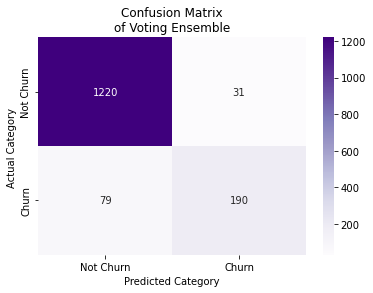

,Model,Accuracy,Precision,Recall,F1 Score
0,Random Forest,0.940132,0.839695,0.817844,0.828625
1,SVC,0.830263,0.514286,0.736059,0.605505
2,K-Nearest Neighbours,0.752632,0.384449,0.661710,0.486339
3,XGBClassifier,0.957895,0.889734,0.869888,0.879699
4,ANN,0.911842,0.719870,0.821561,0.767361
5,Stacking_estimator,0.953289,0.902439,0.825279,0.862136
6,Voting_estimator,0.927632,0.859729,0.706320,0.775510


Run  7
Distribution Before SMOTE
Counter({0: 5929, 1: 1159})

Distribution After SMOTE
Counter({0: 5929, 1: 5929})
Random Forest


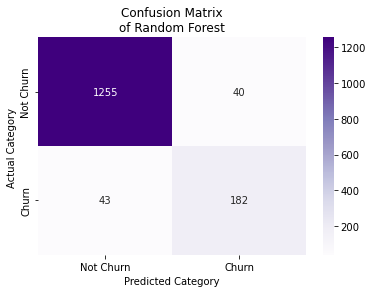

SVC


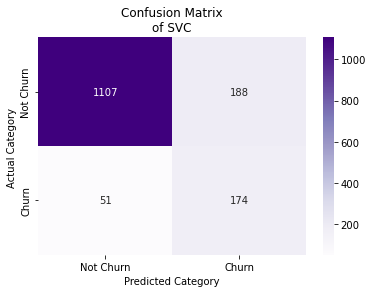

K-Nearest Neighbours


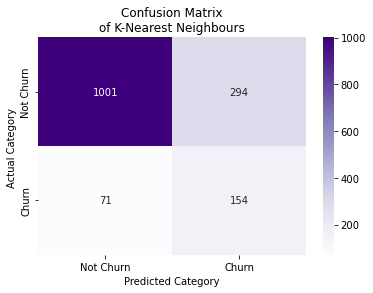

XGBClassifier


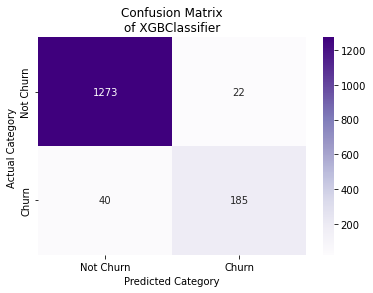

ANN


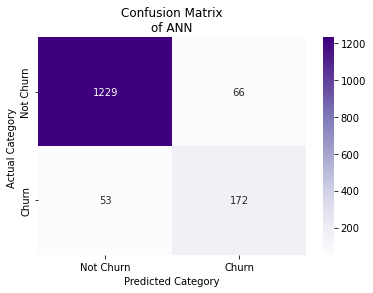

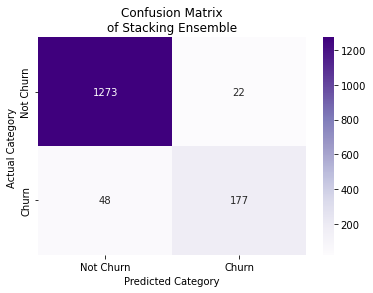

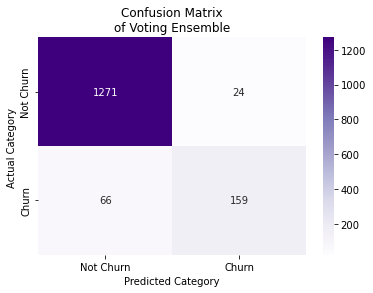

,Model,Accuracy,Precision,Recall,F1 Score
0,Random Forest,0.945395,0.819820,0.808889,0.814318
1,SVC,0.842763,0.480663,0.773333,0.592845
2,K-Nearest Neighbours,0.759868,0.343750,0.684444,0.457652
3,XGBClassifier,0.959211,0.893720,0.822222,0.856481
4,ANN,0.921711,0.722689,0.764444,0.742981
5,Stacking_estimator,0.953947,0.889447,0.786667,0.834906
6,Voting_estimator,0.940789,0.868852,0.706667,0.779412


Run  8
Distribution Before SMOTE
Counter({0: 5921, 1: 1167})

Distribution After SMOTE
Counter({0: 5921, 1: 5921})
Random Forest


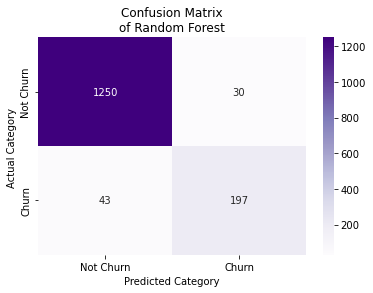

SVC


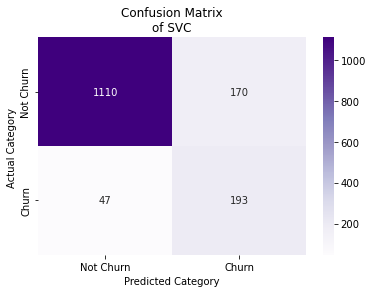

K-Nearest Neighbours


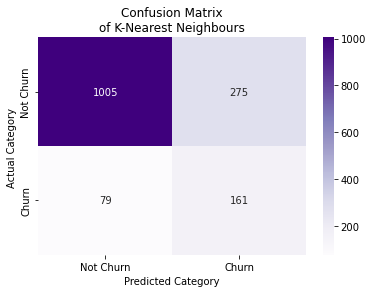

XGBClassifier


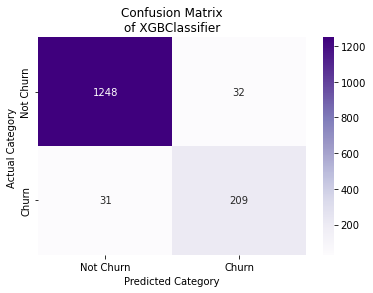

ANN


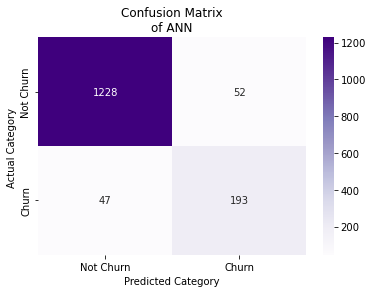

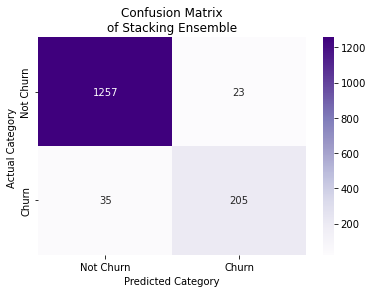

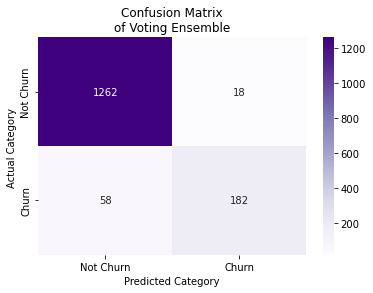

,Model,Accuracy,Precision,Recall,F1 Score
0,Random Forest,0.951974,0.867841,0.820833,0.843683
1,SVC,0.857237,0.531680,0.804167,0.640133
2,K-Nearest Neighbours,0.767105,0.369266,0.670833,0.476331
3,XGBClassifier,0.958553,0.867220,0.870833,0.869023
4,ANN,0.934868,0.787755,0.804167,0.795876
5,Stacking_estimator,0.961842,0.899123,0.854167,0.876068
6,Voting_estimator,0.950000,0.910000,0.758333,0.827273


Run  9
Distribution Before SMOTE
Counter({0: 5971, 1: 1117})

Distribution After SMOTE
Counter({0: 5971, 1: 5971})
Random Forest


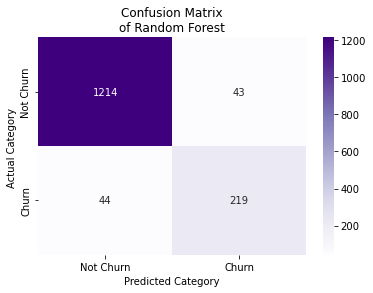

SVC


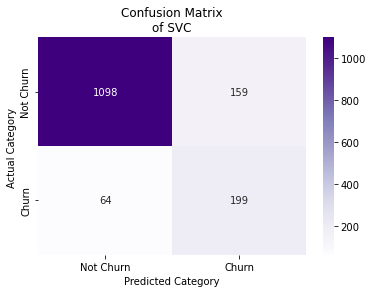

K-Nearest Neighbours


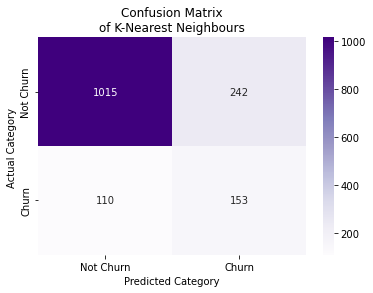

XGBClassifier


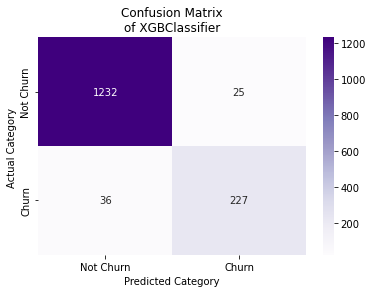

ANN


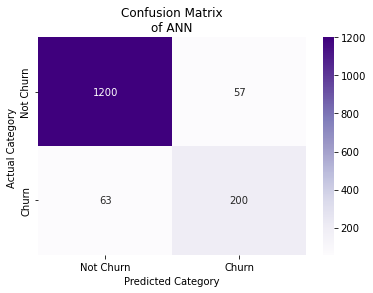

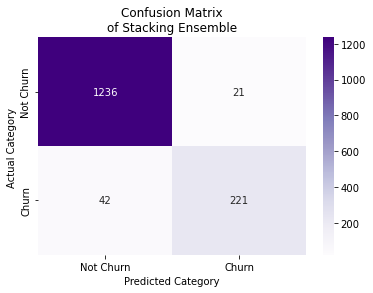

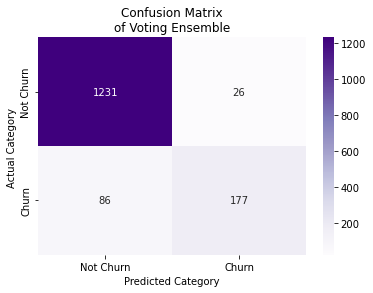

,Model,Accuracy,Precision,Recall,F1 Score
0,Random Forest,0.942763,0.835878,0.832700,0.834286
1,SVC,0.853289,0.555866,0.756654,0.640902
2,K-Nearest Neighbours,0.768421,0.387342,0.581749,0.465046
3,XGBClassifier,0.959868,0.900794,0.863118,0.881553
4,ANN,0.921053,0.778210,0.760456,0.769231
5,Stacking_estimator,0.958553,0.913223,0.840304,0.875248
6,Voting_estimator,0.926316,0.871921,0.673004,0.759657


Run  10
Distribution Before SMOTE
Counter({0: 5952, 1: 1136})

Distribution After SMOTE
Counter({0: 5952, 1: 5952})
Random Forest


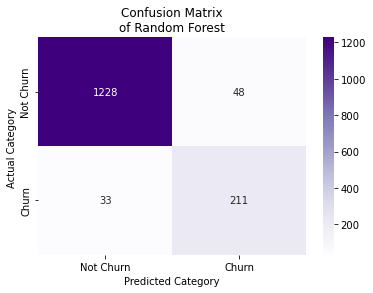

SVC


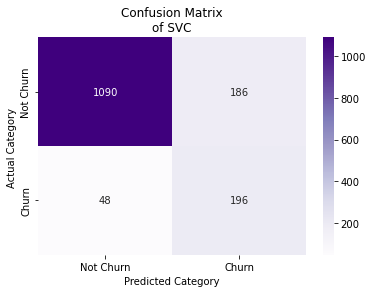

K-Nearest Neighbours


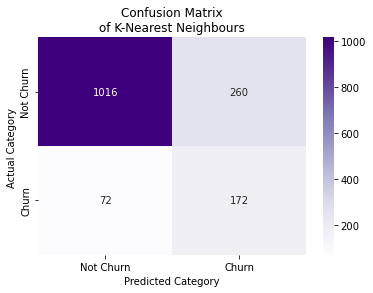

XGBClassifier


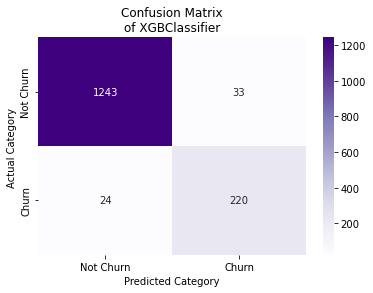

ANN


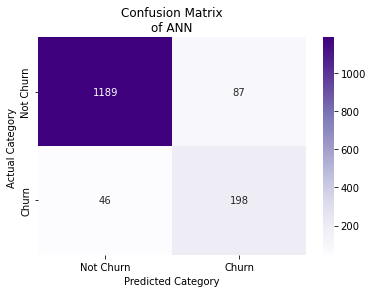

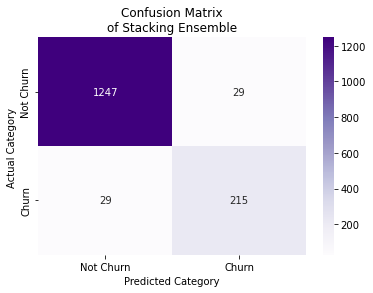

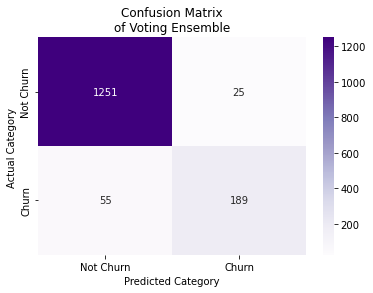

,Model,Accuracy,Precision,Recall,F1 Score
0,Random Forest,0.946711,0.814672,0.864754,0.838966
1,SVC,0.846053,0.513089,0.803279,0.626198
2,K-Nearest Neighbours,0.781579,0.398148,0.704918,0.508876
3,XGBClassifier,0.962500,0.869565,0.901639,0.885312
4,ANN,0.912500,0.694737,0.811475,0.748582
5,Stacking_estimator,0.961842,0.881148,0.881148,0.881148
6,Voting_estimator,0.947368,0.883178,0.774590,0.825328


In [82]:
performance_final_fs = pd.DataFrame([])
X = Churn_Dataset.drop(["attrition_flag"],axis=1)
y = Churn_Dataset["attrition_flag"]
num_of_run = 10
for i in range(num_of_run):
    print("Run ",i+1)
    classifiers = {"Random Forest":RandomForestClassifier(random_state=0,max_depth=100,n_estimators=1000), 
                   "SVC":SVC(probability=True), 
                   "K-Nearest Neighbours": KNeighborsClassifier(n_neighbors=3),
                   "XGBClassifier": XGBClassifier(eval_metric="logloss",use_label_encoder=False), 
                   "ANN": ANN_model()}

    df_ensemble_train, df_ensemble_test, df_performance = runCustomEnsemble(X,y,classifiers)
    performance_final_fs = pd.concat([performance_final_fs,df_performance])


In [83]:
performance_final_fs.groupby(["Model"]).mean()

,Accuracy,Precision,Recall,F1 Score
Model,,,,
ANN,0.919145,0.731805,0.798834,0.763057
K-Nearest Neighbours,0.762697,0.370438,0.652897,0.472120
Random Forest,0.944671,0.831062,0.828414,0.829536
SVC,0.844868,0.516352,0.772134,0.618468
Stacking_estimator,0.956579,0.897970,0.827180,0.860810
Voting_estimator,0.938947,0.875813,0.729333,0.795619
XGBClassifier,0.959013,0.888140,0.856619,0.871711


In [84]:
df_ensemble_train.head(10)

,label,Random Forest,SVC,K-Nearest Neighbours,XGBClassifier,ANN
0,0,0,0,0,0,0
1,0,0,0,0,0,0
2,0,0,0,0,0,0
3,0,0,0,0,0,0
4,0,0,0,0,0,0
5,0,0,0,0,0,0
6,0,0,0,0,0,0
7,1,0,1,0,0,0
8,1,1,1,1,1,1
9,0,0,0,1,0,0


##### [Back to Top](#A-Predictive-Analysis-on-Credit-Card-Customer-Churn-Using-Maching-Learning-and-Deep-Learning-Techniques)

## 5.2 Results

By applying SMOTE balancing technique on the training dataset, we were able to increase the recall score significantly. 

On average, XGBoost had the highest accuracy of 96.26%, followed by the Stacking Ensemble with an accuracy of 96.13%. Since the dataset is highly imbalanced, accuracy could be a misleading metric for evaluating the model. 

Recall and Precision are more relevant evaluation metric for this analysis. The Stacking Ensemble method consistency had the highest precision with values reaching 94% over the 10 iterations. While XGBoost consistently gave a higher recall values with a maximum value of 91%.

In [85]:
performance_final.groupby(["Model"]).mean()#.sort_values(by=['Precision'])

,Accuracy,Precision,Recall,F1 Score
Model,,,,
ANN,0.943026,0.810454,0.855835,0.831565
K-Nearest Neighbours,0.802829,0.443667,0.773754,0.563462
Random Forest,0.957171,0.861327,0.880930,0.870859
SVC,0.902961,0.657117,0.859329,0.744346
Stacking_estimator,0.970329,0.916928,0.900502,0.908580
Voting_estimator,0.955921,0.903555,0.819886,0.859350
XGBClassifier,0.970592,0.906521,0.915123,0.910645


In [86]:
performance_final.groupby(["Model"]).max()#.sort_values(by=['Precision'])

,Accuracy,Precision,Recall,F1 Score
Model,,,,
ANN,0.953289,0.888031,0.914729,0.866290
K-Nearest Neighbours,0.821711,0.473684,0.817829,0.597734
Random Forest,0.965132,0.895911,0.922481,0.899811
SVC,0.919737,0.716463,0.899225,0.783333
Stacking_estimator,0.974342,0.942748,0.914729,0.925094
Voting_estimator,0.965789,0.935780,0.887597,0.898039
XGBClassifier,0.975000,0.932806,0.926471,0.928177


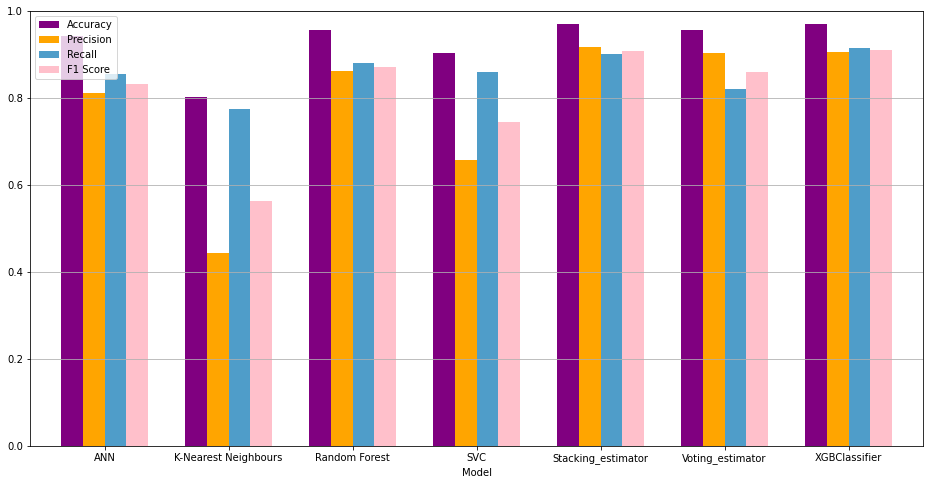

In [88]:
performance_final_group = performance_final.groupby(["Model"]).mean()#.sort_values(by=['Precision'])
performance_final_group.plot.bar(rot = 0,color=["purple","orange","#4f9dc9","pink"], width=0.7)
plt.rcParams['figure.figsize'] = [16, 8]
plt.ylim(0, 1)
plt.grid(axis = 'y')
plt.legend(loc=2)
plt.show()

The below shows the recall and precision values for the machine learning and ensemble models over 10 iterations. XGBoost and Stacking Ensemble outperforms the other models, performing competitively with one another. Although the Voting ensemble method showed high precision score, the recall values were relatively low.

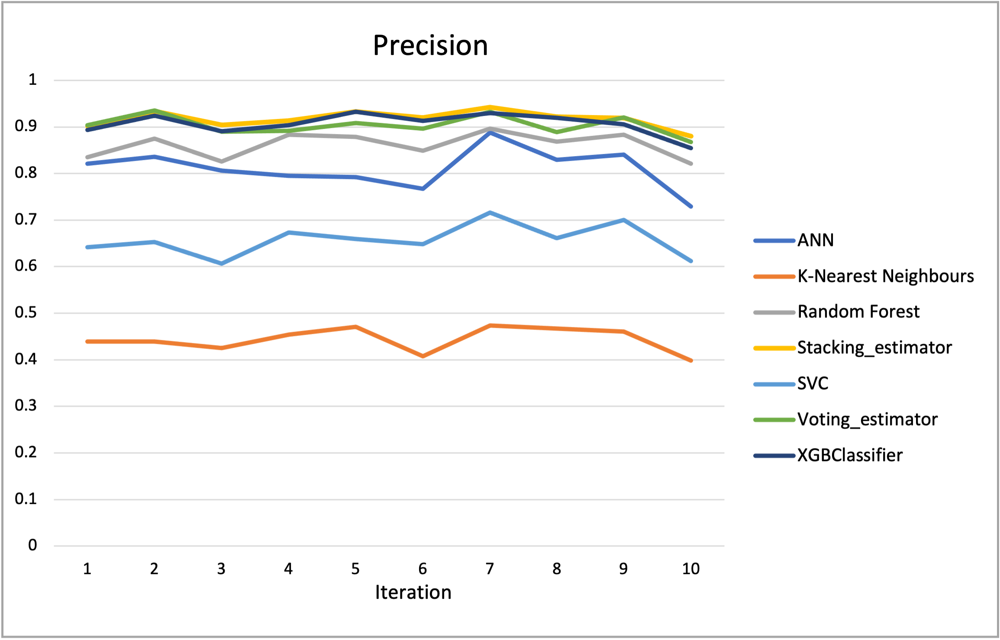

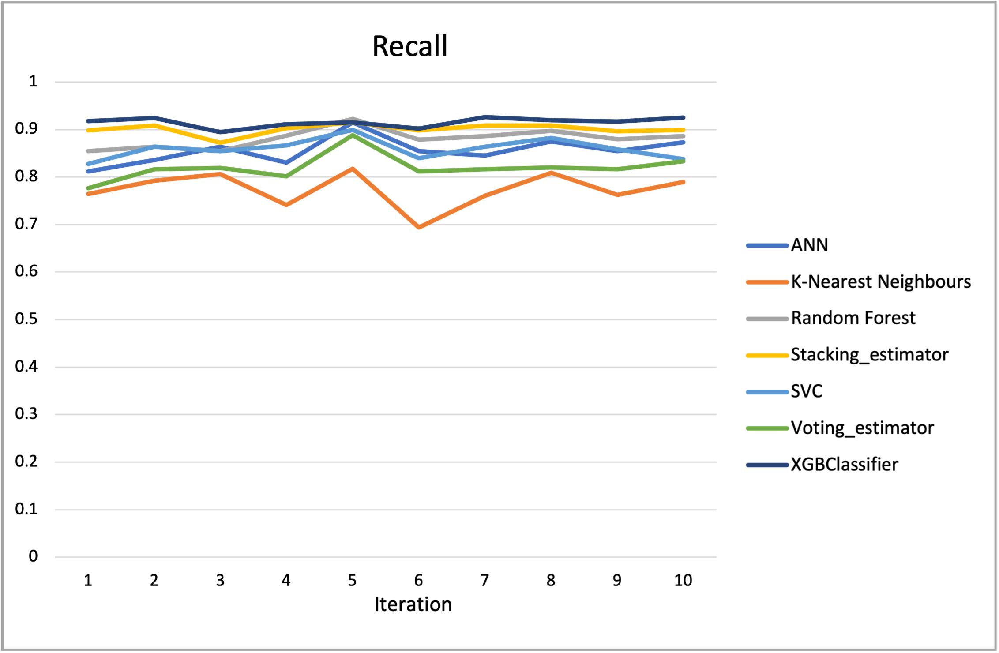

In [89]:
performance_final.to_csv("Performance_SMOTE2.csv")

##### [Back to Top](#A-Predictive-Analysis-on-Credit-Card-Customer-Churn-Using-Maching-Learning-and-Deep-Learning-Techniques)

## 5.3 Feature Importance

In order for credit card companies to have a better understanding of their customer base, feature Importance is determined using XGBoost and confirmed using Random Forest. Evaluating which attributes are more relevant in predicting churn is important for service provider, as it helps improve customer retention.

We find that behavioural and interactive attributes are more relevant in predicting if a credit card customer will churn rather than demographic attributes such as income category, education level, dependent count and marital status.

In [104]:
from xgboost import plot_importance
from sklearn.model_selection import train_test_split

models={"XGB":XGBClassifier(random_state = 2,use_label_encoder=False,eval_metric="logloss"),
        "RF":RandomForestClassifier()}

X = Churn_Dataset_all.drop(["attrition_flag"],axis=1)
y = Churn_Dataset_all["attrition_flag"]

output_df = {"Feature": list(X.columns)}

for key in models:
    # Split the data into a training set and a test set
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state =1)

    oversample = SMOTE()
    X_train, y_train = oversample.fit_resample(X_train, y_train)

    model = models[key]
    # Training the model
    model.fit(X_train, y_train)

    # Computing the importance of each feature
    model_feature_importance = model.feature_importances_
    
    # Normalize model importance
    norm_importance = (model_feature_importance - 
                       np.min(model_feature_importance))/(np.max(model_feature_importance) - 
                                                                  np.min(model_feature_importance))  
    

    output_df[key] = list(norm_importance.round(3))

output_df = pd.DataFrame.from_dict(output_df).sort_values(by=['XGB'],ascending =False).set_index('Feature')
output_df.index.name = ''
print(output_df)

                            XGB     RF
                                      
total_trans_count         1.000  0.925
total_relationship_count  0.298  0.266
total_revolving_bal       0.297  0.442
total_trans_amt           0.248  1.000
gender                    0.188  0.091
total_count_change_q4_q1  0.116  0.445
avg_open_to_buy           0.064  0.114
customer_age              0.062  0.098
total_amt_change_q4_q1    0.062  0.235
income_category           0.060  0.053
avg_utilization_ratio     0.055  0.289
card_category             0.052  0.000
months_inactive_12_month  0.047  0.049
contacts_count_12_month   0.040  0.051
credit_limit              0.028  0.118
marital_status            0.025  0.013
education_level           0.007  0.031
months_on_book            0.005  0.058
dependent_count           0.000  0.025


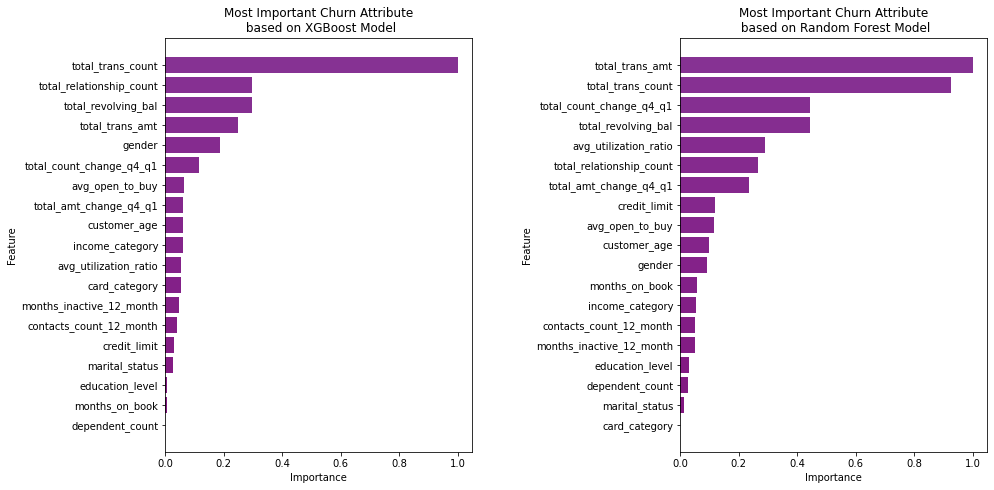

In [105]:
fig, axs = plt.subplots(1,2, figsize=(15,8))

cmap = plt.get_cmap("BuPu")(np.flip(np.arange(220)))

output_df = output_df.sort_values(by="XGB",ascending =True)
axs[0].barh(output_df.index,output_df["XGB"],color=cmap)
axs[0].set_title('Most Important Churn Attribute\n based on XGBoost Model')
axs[0].set(ylabel='Feature')
axs[0].set(xlabel='Importance')

output_df = output_df.sort_values(by="RF",ascending =True)
axs[1].barh(output_df.index,output_df["RF"],color=cmap)
axs[1].set_title('Most Important Churn Attribute\n based on Random Forest Model')
axs[1].set(ylabel='Feature')
axs[1].set(xlabel='Importance')

fig.tight_layout(pad=5.0)
plt.show()



##### [Back to Top](#A-Predictive-Analysis-on-Credit-Card-Customer-Churn-Using-Maching-Learning-and-Deep-Learning-Techniques)

# 6. Random Sampling Balancing Technique

## 6.1 Modelling using Random Forest, SVM, KNN, ANN, Logistic Regression and Ensembles (Stacking & Voting)

In [95]:
def split_data_rs(): 
    Existing_Class = Churn_Dataset_all[Churn_Dataset_all["attrition_flag"] ==0]
    Attrited_Class = Churn_Dataset_all[Churn_Dataset_all["attrition_flag"] ==1]

    Existing_Class = Existing_Class.sample(frac=1).reset_index(drop=True)
    Attrited_Class = Attrited_Class.sample(frac=1).reset_index(drop=True)

    X_train_E = Existing_Class.iloc[:700]
    X_train_A = Attrited_Class.iloc[:300]

    X_val_E = Existing_Class.iloc[700:1400]
    X_val_A = Attrited_Class.iloc[300:600]

    X_test_E = Existing_Class.iloc[1400:]
    X_test_A = Attrited_Class.iloc[600:]

    X_train = pd.concat([X_train_E, X_train_A])
    X_val = pd.concat([X_val_E, X_val_A])
    X_test = pd.concat([X_test_E, X_test_A])

    X_train = X_train.sample(frac=1).reset_index(drop=True)
    X_val = X_val.sample(frac=1).reset_index(drop=True)
    X_test = X_test.sample(frac=1).reset_index(drop=True)

    y_train = X_train["attrition_flag"]
    y_val = X_val["attrition_flag"]
    y_test = X_test["attrition_flag"]


    drop_col = ["attrition_flag"]
    X_train = X_train.drop(drop_col,axis=1)
    X_val = X_val.drop(drop_col,axis=1)
    X_test = X_test.drop(drop_col,axis=1)

    #print(X_train.shape)
    #print(X_val.shape)
    #print(X_test.shape)
    #print(y_train.shape)
    #print(y_val.shape)
    #print(y_test.shape)
    
    return X_train, y_train, X_val, y_val, X_test, y_test

In [96]:
from sklearn.linear_model import Lasso
from xgboost import XGBClassifier
from sklearn.metrics import classification_report
def runCustomEnsembleRandomSample(X_train, y_train, X_val, y_val, X_test, y_test, dic_models):
    df_vote = pd.DataFrame([])
    
    #print(len(X_train),len(X_val),len(X_test))
    
    # Applying normalization to data
    X_train, X_val, X_test = data_normalization(X_train, X_val, X_test)
    
    df_ensemble_train = pd.DataFrame([])
    df_ensemble_train["label"] = y_val
    
    df_ensemble_test = pd.DataFrame([])
    df_ensemble_test["label"] = y_test
    
    df_performance = pd.DataFrame(columns=["Model","Accuracy","Precision","Recall", "F1 Score"])

    
    for key in dic_models:
        row={}
        model = dic_models[key]
        if key != "ANN":
            model.fit(X_train, y_train)
            pred1 = model.predict(X_val)
            df_ensemble_train[key] = pred1
            pred2 = model.predict(X_test)
            df_ensemble_test[key] = pred2
        else:
            X_train = np.asarray(X_train)
            X_val = np.asarray(X_val)
            X_test = np.asarray(X_test)
            
            y_train = np.asarray(y_train)
            y_val = np.asarray(y_val)
            y_test = np.asarray(y_test)
            
            model.fit(X_train,
                      y_train,
                      batch_size=128,
                      epochs=250,
                      validation_split=0.2, 
                      verbose=0)
            pred1 = model.predict_classes(X_val)
            df_ensemble_train[key] = pred1
            pred2 = model.predict_classes(X_test)
            df_ensemble_test[key] = pred2
        
        Model_Accuracy = accuracy_score(y_test, pred2)
        Model_Precision = precision_score(y_test, pred2) 
        Model_Recall = recall_score(y_test, pred2)      
        Model_f1_score = f1_score(y_test, pred2) 
        
        print(key+ " Model Complete")
        row["Model"]= key
        row['Accuracy'] = Model_Accuracy
        row['Precision'] = Model_Precision
        row["Recall"] = Model_Recall
        row["F1 Score"] = Model_f1_score

        df_performance = df_performance.append(row,ignore_index=True)      


    X = df_ensemble_train.drop("label", axis=1)
    y = df_ensemble_train["label"]
    
    #For voting estimator, prediction is based on results on test
    X_test = df_ensemble_test.drop("label", axis=1)
    y_test = df_ensemble_test["label"]
    
    model = LogisticRegression()
    model.fit(X, y)
    pred = model.predict(X_test)

    Model_Accuracy = accuracy_score(y_test, pred)
    Model_Precision = precision_score(y_test, pred) 
    Model_Recall = recall_score(y_test, pred)      
    Model_f1_score = f1_score(y_test, pred) 
    
    row={}
    row["Model"]= "Stacking_estimator"
    row['Accuracy'] = Model_Accuracy
    row['Precision'] = Model_Precision
    row["Recall"] = Model_Recall
    row["F1 Score"] = Model_f1_score
    df_performance = df_performance.append(row,ignore_index=True)
    
    df_vote = X_test.copy()
    df_vote["vote"] = df_vote.sum(axis=1)
    df_vote["Voting_estimator"] = 0
    df_vote.loc[(df_vote["vote"] >=4), "Voting_estimator"] = 1
    pred = df_vote["Voting_estimator"]
    
    Model_Accuracy = accuracy_score(y_test, pred)
    Model_Precision = precision_score(y_test, pred) 
    Model_Recall = recall_score(y_test, pred)      
    Model_f1_score = f1_score(y_test, pred) 
    
    row={}
    row["Model"]= "Voting_estimator"
    row['Accuracy'] = Model_Accuracy
    row['Precision'] = Model_Precision
    row["Recall"] = Model_Recall
    row["F1 Score"] = Model_f1_score
    df_performance = df_performance.append(row,ignore_index=True)
    
    display(df_performance)
    
    return df_ensemble_train, df_ensemble_test, df_performance

In [97]:
performance_final = pd.DataFrame([])
num_of_run = 10
for i in range(num_of_run):
    print("Run ",i+1)

    X_train, y_train, X_val, y_val, X_test, y_test = split_data_rs()
    classifiers = {"Random Forest":RandomForestClassifier(random_state=0,max_depth=100,n_estimators=1000), 
                   "SVC":SVC(probability=True), 
                   "K-Nearest Neighbours": KNeighborsClassifier(n_neighbors=2),
                   "XGBClassifier": XGBClassifier(eval_metric="logloss",use_label_encoder=False), 
                   "ANN": ANN_model()
                  }

    df_ensemble_train, df_ensemble_test, df_performance = runCustomEnsembleRandomSample(X_train,
                                                                                        y_train,
                                                                                        X_val, 
                                                                                        y_val,
                                                                                        X_test,
                                                                                        y_test,
                                                                                        classifiers)
    performance_final = pd.concat([performance_final,df_performance])

Run  1
Random Forest Model Complete
SVC Model Complete
K-Nearest Neighbours Model Complete
XGBClassifier Model Complete
ANN Model Complete


,Model,Accuracy,Precision,Recall,F1 Score
0,Random Forest,0.945736,0.770295,0.813048,0.791094
1,SVC,0.916697,0.680785,0.641675,0.660652
2,K-Nearest Neighbours,0.886059,0.569464,0.403116,0.472064
3,XGBClassifier,0.956441,0.796476,0.880234,0.836263
4,ANN,0.902916,0.589879,0.760467,0.664398
5,Stacking_estimator,0.954965,0.810913,0.839338,0.824880
6,Voting_estimator,0.938108,0.843832,0.626095,0.718837


Run  2
Random Forest Model Complete
SVC Model Complete
K-Nearest Neighbours Model Complete
XGBClassifier Model Complete
ANN Model Complete


,Model,Accuracy,Precision,Recall,F1 Score
0,Random Forest,0.950904,0.779857,0.851996,0.814332
1,SVC,0.909930,0.639282,0.659202,0.649089
2,K-Nearest Neighbours,0.875969,0.511628,0.407011,0.453362
3,XGBClassifier,0.956811,0.797012,0.883155,0.837875
4,ANN,0.893811,0.555331,0.801363,0.656038
5,Stacking_estimator,0.956195,0.806393,0.859786,0.832234
6,Voting_estimator,0.939830,0.843990,0.642648,0.729685


Run  3
Random Forest Model Complete
SVC Model Complete
K-Nearest Neighbours Model Complete
XGBClassifier Model Complete
ANN Model Complete


,Model,Accuracy,Precision,Recall,F1 Score
0,Random Forest,0.939461,0.720892,0.850049,0.780161
1,SVC,0.912760,0.644545,0.690360,0.666667
2,K-Nearest Neighbours,0.884951,0.560209,0.416748,0.477945
3,XGBClassifier,0.941307,0.717220,0.884129,0.791976
4,ANN,0.898240,0.571429,0.778968,0.659250
5,Stacking_estimator,0.941307,0.717563,0.883155,0.791794
6,Voting_estimator,0.933432,0.774887,0.666991,0.716902


Run  4
Random Forest Model Complete
SVC Model Complete
K-Nearest Neighbours Model Complete
XGBClassifier Model Complete
ANN Model Complete


,Model,Accuracy,Precision,Recall,F1 Score
0,Random Forest,0.953365,0.797794,0.845180,0.820804
1,SVC,0.918420,0.681637,0.665044,0.673238
2,K-Nearest Neighbours,0.887658,0.572519,0.438169,0.496415
3,XGBClassifier,0.954719,0.783319,0.887050,0.831963
4,ANN,0.913867,0.631749,0.763389,0.691358
5,Stacking_estimator,0.954719,0.783319,0.887050,0.831963
6,Voting_estimator,0.941922,0.858065,0.647517,0.738069


Run  5
Random Forest Model Complete
SVC Model Complete
K-Nearest Neighbours Model Complete
XGBClassifier Model Complete
ANN Model Complete


,Model,Accuracy,Precision,Recall,F1 Score
0,Random Forest,0.944506,0.751309,0.838364,0.792453
1,SVC,0.913621,0.644960,0.703992,0.673184
2,K-Nearest Neighbours,0.889258,0.584329,0.428432,0.494382
3,XGBClassifier,0.952135,0.767169,0.891918,0.824854
4,ANN,0.910914,0.616988,0.777994,0.688200
5,Stacking_estimator,0.952135,0.767169,0.891918,0.824854
6,Voting_estimator,0.939215,0.822249,0.662123,0.733549


Run  6
Random Forest Model Complete
SVC Model Complete
K-Nearest Neighbours Model Complete
XGBClassifier Model Complete
ANN Model Complete


,Model,Accuracy,Precision,Recall,F1 Score
0,Random Forest,0.949059,0.783010,0.825706,0.803791
1,SVC,0.915590,0.674157,0.642648,0.658026
2,K-Nearest Neighbours,0.887658,0.575198,0.424537,0.488515
3,XGBClassifier,0.955457,0.785408,0.890944,0.834854
4,ANN,0.898733,0.575332,0.758520,0.654347
5,Stacking_estimator,0.957918,0.822201,0.851022,0.836364
6,Voting_estimator,0.937123,0.846774,0.613437,0.711462


Run  7
Random Forest Model Complete
SVC Model Complete
K-Nearest Neighbours Model Complete
XGBClassifier Model Complete
ANN Model Complete


,Model,Accuracy,Precision,Recall,F1 Score
0,Random Forest,0.949059,0.770521,0.850049,0.808333
1,SVC,0.912883,0.643049,0.698150,0.669468
2,K-Nearest Neighbours,0.881998,0.544619,0.404090,0.463946
3,XGBClassifier,0.952135,0.764073,0.898734,0.825951
4,ANN,0.889996,0.543042,0.816943,0.652411
5,Stacking_estimator,0.953488,0.787933,0.864654,0.824513
6,Voting_estimator,0.939584,0.822115,0.666018,0.735880


Run  8
Random Forest Model Complete
SVC Model Complete
K-Nearest Neighbours Model Complete
XGBClassifier Model Complete
ANN Model Complete


,Model,Accuracy,Precision,Recall,F1 Score
0,Random Forest,0.948320,0.766462,0.850049,0.806094
1,SVC,0.913129,0.649025,0.680623,0.664449
2,K-Nearest Neighbours,0.886182,0.569863,0.405063,0.473534
3,XGBClassifier,0.953858,0.780551,0.883155,0.828689
4,ANN,0.888274,0.540121,0.779942,0.638247
5,Stacking_estimator,0.951397,0.764657,0.888997,0.822152
6,Voting_estimator,0.938969,0.830635,0.649464,0.728962


Run  9
Random Forest Model Complete
SVC Model Complete
K-Nearest Neighbours Model Complete
XGBClassifier Model Complete
ANN Model Complete


,Model,Accuracy,Precision,Recall,F1 Score
0,Random Forest,0.947090,0.771611,0.825706,0.797742
1,SVC,0.913990,0.653558,0.679649,0.666348
2,K-Nearest Neighbours,0.887658,0.580056,0.402142,0.474986
3,XGBClassifier,0.951889,0.767227,0.888997,0.823636
4,ANN,0.904147,0.593514,0.766310,0.668933
5,Stacking_estimator,0.952996,0.796143,0.844206,0.819471
6,Voting_estimator,0.939707,0.845560,0.639727,0.728381


Run  10
Random Forest Model Complete
SVC Model Complete
K-Nearest Neighbours Model Complete
XGBClassifier Model Complete
ANN Model Complete


,Model,Accuracy,Precision,Recall,F1 Score
0,Random Forest,0.949059,0.767686,0.855891,0.809392
1,SVC,0.915467,0.666341,0.663096,0.664714
2,K-Nearest Neighbours,0.887781,0.579750,0.407011,0.478261
3,XGBClassifier,0.951397,0.761589,0.895813,0.823266
4,ANN,0.905131,0.591168,0.808179,0.682847
5,Stacking_estimator,0.954473,0.792000,0.867575,0.828067
6,Voting_estimator,0.937738,0.824408,0.644596,0.723497


##### [Back to Top](#A-Predictive-Analysis-on-Credit-Card-Customer-Churn-Using-Maching-Learning-and-Deep-Learning-Techniques)

## 6.2 Results

A similar experimentation is carried out on the random sampled dataset. Again, XGBoost and Stacking Ensemble perform best at predicting customer churn. However, we see that there is no significant improvement compared to the SMOTE dataset

In [98]:
performance_final.groupby(["Model"]).mean().sort_values(by=['Precision'])

,Accuracy,Precision,Recall,F1 Score
Model,,,,
K-Nearest Neighbours,0.885517,0.564764,0.413632,0.477341
ANN,0.900603,0.580855,0.781207,0.665603
SVC,0.914249,0.657734,0.672444,0.664584
Random Forest,0.947656,0.767944,0.840604,0.802420
XGBClassifier,0.952615,0.772004,0.888413,0.825933
Stacking_estimator,0.952959,0.784829,0.867770,0.823629
Voting_estimator,0.938563,0.831252,0.645862,0.726522


In [99]:
performance_final.groupby(["Model"]).std().sort_values(by=['Precision'])

,Accuracy,Precision,Recall,F1 Score
Model,,,,
SVC,0.002383,0.016442,0.021725,0.007294
Random Forest,0.003809,0.020490,0.014377,0.012128
K-Nearest Neighbours,0.003908,0.021879,0.012669,0.013260
XGBClassifier,0.004430,0.023151,0.005988,0.013079
Voting_estimator,0.002239,0.023271,0.017077,0.008674
Stacking_estimator,0.004517,0.029771,0.019321,0.012302
ANN,0.008435,0.030007,0.020849,0.017207


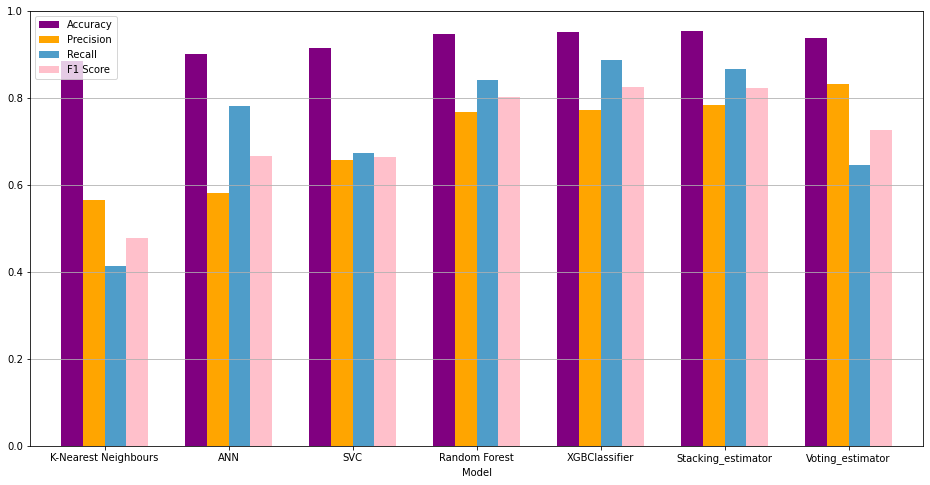

In [100]:
performance_final_group = performance_final.groupby(["Model"]).mean().sort_values(by=['Precision'])
performance_final_group.plot.bar(rot = 0,color=["purple","orange","#4f9dc9","pink"], width=0.7)
plt.rcParams['figure.figsize'] = [16, 8]
plt.ylim(0, 1)
plt.grid(axis = 'y')
plt.legend(loc=2)
plt.show()

In [101]:
performance_final.to_csv("Performance_RS.csv")

##### [Back to Top](#A-Predictive-Analysis-on-Credit-Card-Customer-Churn-Using-Maching-Learning-and-Deep-Learning-Techniques)

## 6.3 Feature Importance
Feature Importance is also determined using Random Sampling

In [106]:
from xgboost import plot_importance
from sklearn.model_selection import train_test_split

models={"XGB":XGBClassifier(random_state = 2,use_label_encoder=False,eval_metric="logloss"),
        "RF":RandomForestClassifier()}

output_df = {"Feature": list(X.columns)}

for key in models:
    # Split the data into a training set and a test set
    X_train, y_train, X_val, y_val, X_test, y_test = split_data_rs()

    model = models[key]
    # Training the model
    model.fit(X_train, y_train)

    # Computing the importance of each feature
    model_feature_importance = model.feature_importances_
    
    # Normalize model importance
    norm_importance = (model_feature_importance - 
                       np.min(model_feature_importance))/(np.max(model_feature_importance) - 
                                                                  np.min(model_feature_importance))  
    

    output_df[key] = list(norm_importance.round(3))

output_df = pd.DataFrame.from_dict(output_df).sort_values(by=['XGB'],ascending =False).set_index('Feature')
output_df.index.name = ''
print(output_df)

                            XGB     RF
                                      
total_trans_count         1.000  1.000
total_revolving_bal       0.565  0.562
total_relationship_count  0.403  0.235
total_count_change_q4_q1  0.313  0.560
total_trans_amt           0.305  0.954
contacts_count_12_month   0.222  0.108
credit_limit              0.164  0.169
customer_age              0.159  0.159
months_inactive_12_month  0.152  0.177
gender                    0.121  0.032
avg_open_to_buy           0.118  0.172
total_amt_change_q4_q1    0.117  0.330
months_on_book            0.115  0.118
dependent_count           0.062  0.071
avg_utilization_ratio     0.059  0.380
income_category           0.041  0.077
marital_status            0.041  0.035
education_level           0.033  0.059
card_category             0.000  0.000


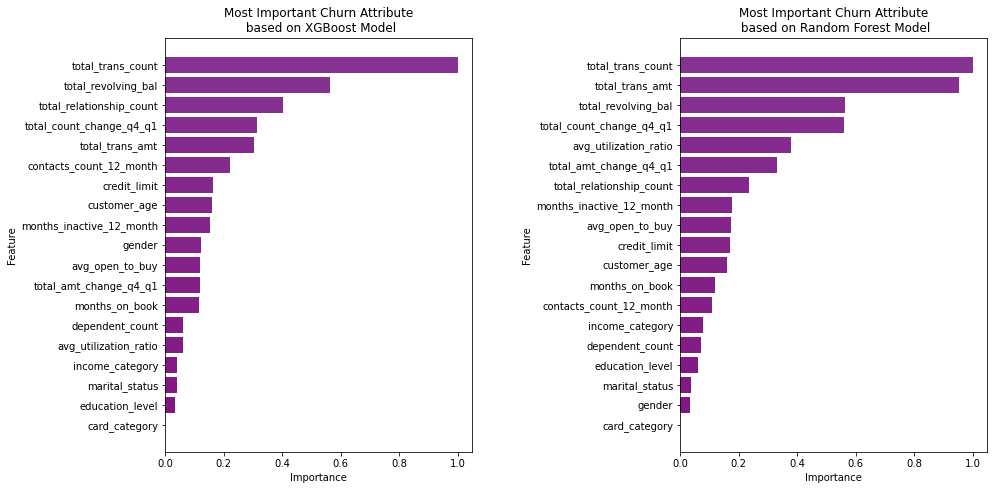

In [108]:
fig, axs = plt.subplots(1,2, figsize=(15,8))

cmap = plt.get_cmap("BuPu")(np.flip(np.arange(220)))

output_df = output_df.sort_values(by="XGB",ascending =True)
axs[0].barh(output_df.index,output_df["XGB"],color=cmap)
axs[0].set_title('Most Important Churn Attribute\n based on XGBoost Model')
axs[0].set(ylabel='Feature')
axs[0].set(xlabel='Importance')

output_df = output_df.sort_values(by="RF",ascending =True)
axs[1].barh(output_df.index,output_df["RF"],color=cmap)
axs[1].set_title('Most Important Churn Attribute\n based on Random Forest Model')
axs[1].set(ylabel='Feature')
axs[1].set(xlabel='Importance')

fig.tight_layout(pad=5.0)
plt.show()



##### [Back to Top](#A-Predictive-Analysis-on-Credit-Card-Customer-Churn-Using-Maching-Learning-and-Deep-Learning-Techniques)

# 7. Conclusion


We were able to significantly improve the recall score (up to 27% for ANN) by applying SMOTE balancing technique to the training data and making predictions on the raw data. Overall, XGBoost classifier and Stacking Ensemble outperformed all other models. After 10 iterations, XGBoost classifier achieved an average accuracy of 97.06%, precision of 90.65%, recall of 91.51% and f1-score of 91.06%. The Stacking Ensemble model performed competitively with an accuracy of 97.03%, precision of 91.69%,  recall of 90.05% and f1-score of 90.86% on average. Although the Voting Ensemble showed high precision values of  90.36%, the recall values were relatively low and therefore is would not be a suitable model to utilize. Compared to the SMOTE dataset, the stratified randomly sampled dataset showed no improvements.

Over the 10 iterations, we observed a trade-off between precision and recall for the XGBoost and the Stacking Ensemble model. XGBoost consistently achieved the highest recall score while Stacking Ensemble performed best in terms of precision. When deciding which model to use, the credit card company should consider its goals as well cost of the marketing strategy. XGBoost model has the ability to correctly capture more of the churning customers than the Stacking Ensemble. However, if the marketing campaign is more costly and if the company is only interested in capturing a portion of the churning customer, they could consider utilizing the Stacking ensemble model as the model is able to achieve a higher precision and predict less false positives than the XGBoost model.

On evaluating the features importance, we saw that behavioural and interactive attributes are more relevant in predicting if a credit card customer will churn rather than demographic attributes such as income category, education level, dependent count and marital status.